### 切分訓練、測試集
train:val = 8:2 <br>
和9:1切分做比較

In [30]:
def moveFile(fileDir, tarDir, splitrate):
    import os, random, shutil
    
    pathDir = os.listdir(fileDir)  # 資料夾中所有檔案的檔名
    filenumber=len(pathDir)  # 資料夾中共有多少檔案
    splitrate=splitrate  # 自定義抽取圖片的比例，例: 100張抽10張，就是0.1
    picknumber=int(filenumber*splitrate)  # 按照rate比例從資料夾中取該數量圖片
    print("Willing to move {} files to target directory.\nThe file names are showed below.\n".format(picknumber))
    sample = random.sample(pathDir, picknumber)  # 隨機選取picknumber數量的圖片(sample為含有該數量圖片檔名的list)
    print(sample)
    
    for name in sample:
        shutil.move(fileDir+name, tarDir+name)
    print("\nAll moves complete!")

In [32]:
fileroot = "D:\\TGI102_AI_BootCamp\\AIA_Interview\\SplitDatasets\\trainset\\"
pathdir = os.listdir(fileroot)
tarroot = "D:\\TGI102_AI_BootCamp\\AIA_Interview\\SplitDatasets\\valset\\"

for dirname in pathdir:
    fileDir = fileroot + dirname + "\\"
    tarDir = tarroot + dirname + "\\"
    splitrate = 0.2
    moveFile(fileDir, tarDir, splitrate)

Willing to move 160 files to target directory.
The file names are showed below.

['4c8c3218fa69408e.png', '35d7888cd6a644dd.png', '0f12e755b85b4348.png', '9c8046ab059e4021.png', '0c8caa49859e4767.png', '5e2c653383114f96.png', '0e3d586f56714636.png', '28d8258e81a8412d.png', '72ecd2d87c734179.png', '6c4da2ed69a64e9a.png', '8c11c9aae59d4fe8.png', '64a0fb9d85e14dc8.png', '025a8c72ff2b48d6.png', '029d7d69692d4779.png', '340b1e61711b46d5.png', '96c1c0b154c74c83.png', '9bbea81ad61b421c.png', '1f9f571a6ea0465d.png', '18b57cde0fcd4f64.png', '3e3d8fb284c54501.png', '19b7803129e74915.png', '7d32a23bfdab4ecc.png', '35d3edd2ab5a4467.png', '22eaf71bd3fd4c1f.png', '56c2c9a146454403.png', '4fb73e8997914621.png', '3c109d6d9544428b.png', '48aa2a10d32c4115.png', '3f4ae890d6d94c2e.png', '4df15f817e1e4f02.png', '314d95b30087422d.png', '5acb934eed194c00.png', '0a3fa9d3e78842d7.png', '2ef77758466d4503.png', '24fc1302877c4a1e.png', '10b1b326995b435b.png', '03f78b57f8ac41f0.png', '2cb69e98a3f14602.png', '28f10


All moves complete!
Willing to move 160 files to target directory.
The file names are showed below.

['5f4accaacad64b44.png', '5e34c75f26d24bed.png', '9aa9c546e0cc4594.png', '8b38fbb08fd74492.png', '18f1f6d1c79c4775.png', '6f351d8dd57242a6.png', '8a4b32554a5f44a5.png', '14f9b3e6e7324fd2.png', '9d8a12250bbc497e.png', '4c26196791194342.png', '4a6404b0c5d643d2.png', '18c3e141027542f7.png', '11f628dbc2574229.png', '8c50b36c11d8480a.png', '17baf82af83c4931.png', '19aa95cd856a47fe.png', '9cc120ceb02544ba.png', '8b66a3aee9db4389.png', '0ff3328bd5c2491f.png', '8f892fda0623446c.png', '7b24e9c3bf864cde.png', '3aafba79772646b3.png', '3cbb4ae1a7fb4e4a.png', '7c74bd144e8e4a9f.png', '6eb1c4b6ae244b96.png', '2f2b746594174162.png', '5ca80eecda434fb4.png', '4b385235f538412f.png', '3e2b03e2404a453c.png', '3fcc33e93b5a427b.png', '8bbe04064b7f4d21.png', '8d5fc260f18e417b.png', '8d952cbc16ce496a.png', '9c6321a3ef994770.png', '3b337c4b1ef248bb.png', '01c5c54e1940444f.png', '3cff7e157698443c.png', '5f626b9f

### 環境配置與導入所需的套件

In [1]:
import os
import torch
os.environ['KMP_DUPLICATE_LIB_OK']='True'
torch.backends.cudnn.benchmark=True

import torchvision
from torch import nn, optim
from torch.nn import functional as F
from torchvision import transforms
from torchvision import models as m
from torch.utils.data import DataLoader

import matplotlib.pyplot as plt
from time import time
import datetime
import random
import numpy as np
import pandas as pd
import gc
from PIL import Image
import csv

In [2]:
torch.manual_seed(1412)
random.seed(1412)
np.random.seed(1412)

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

### 導入數據集，查看數據(數據結構、可視化)

In [4]:
train_dataset = torchvision.datasets.ImageFolder(root="D:\\TGI102_AI_BootCamp\\AIA_Interview\\SplitDatasets\\trainset\\", 
                                           transform=transforms.ToTensor()
                                            )

In [5]:
train_dataset

Dataset ImageFolder
    Number of datapoints: 3840
    Root location: D:\TGI102_AI_BootCamp\AIA_Interview\SplitDatasets\trainset\
    StandardTransform
Transform: ToTensor()

In [6]:
train_dataset[0]

(tensor([[[0.4000, 0.5451, 0.4039,  ..., 0.4784, 0.4627, 0.4627],
          [0.4078, 0.3686, 0.5098,  ..., 0.4588, 0.4588, 0.4471],
          [0.4078, 0.4000, 0.3804,  ..., 0.4549, 0.4392, 0.4314],
          ...,
          [0.1490, 0.0353, 0.0627,  ..., 0.4471, 0.6196, 0.6510],
          [0.0549, 0.0745, 0.0902,  ..., 0.3176, 0.5176, 0.6235],
          [0.0745, 0.0667, 0.0471,  ..., 0.2118, 0.3529, 0.5686]],
 
         [[0.1569, 0.3059, 0.1647,  ..., 0.3608, 0.3451, 0.3412],
          [0.1647, 0.1255, 0.2706,  ..., 0.3412, 0.3373, 0.3255],
          [0.1647, 0.1569, 0.1373,  ..., 0.3333, 0.3176, 0.3098],
          ...,
          [0.1451, 0.0314, 0.0588,  ..., 0.2471, 0.4000, 0.4118],
          [0.0510, 0.0706, 0.0863,  ..., 0.1333, 0.3098, 0.3961],
          [0.0706, 0.0627, 0.0431,  ..., 0.0627, 0.1647, 0.3569]],
 
         [[0.0588, 0.1961, 0.0549,  ..., 0.2588, 0.2431, 0.2314],
          [0.0667, 0.0275, 0.1608,  ..., 0.2392, 0.2275, 0.2157],
          [0.0667, 0.0588, 0.0392,  ...,

In [7]:
for x, y in train_dataset:
    print(x.shape)
    print(y)
    break

torch.Size([3, 218, 178])
0


In [8]:
np.unique(train_dataset.targets)

array([0, 1, 2, 3, 4, 5])

In [4]:
# 可視化圖片
def plotsample(data):
    fig, axs = plt.subplots(1,10,figsize=(10,10))
    for i in range(10):
        num = random.randint(0,len(data)-1)
        npimg = torchvision.utils.make_grid(data[num][0]).numpy()
        nplabel = data[num][1]
        axs[i].imshow(np.transpose(npimg, (1, 2, 0))) 
        axs[i].set_title(nplabel)
        axs[i].axis("off")

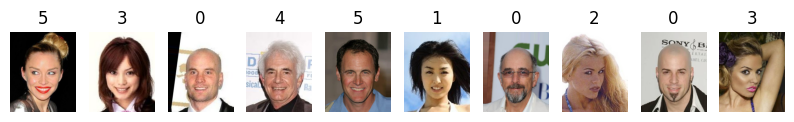

In [10]:
plotsample(train_dataset)

In [11]:
val_dataset = torchvision.datasets.ImageFolder(root="D:\\TGI102_AI_BootCamp\\AIA_Interview\\SplitDatasets\\valset\\", 
                                           transform=transforms.ToTensor()
                                            )
val_dataset

Dataset ImageFolder
    Number of datapoints: 960
    Root location: D:\TGI102_AI_BootCamp\AIA_Interview\SplitDatasets\valset\
    StandardTransform
Transform: ToTensor()

In [12]:
for x, y in val_dataset:
    print(x.shape)
    print(y)
    break

torch.Size([3, 218, 178])
0


In [13]:
np.unique(val_dataset.targets)

array([0, 1, 2, 3, 4, 5])

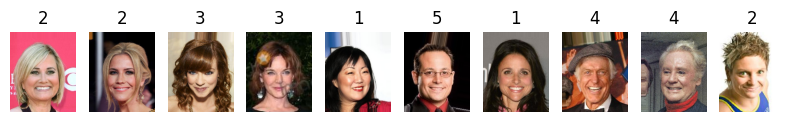

In [14]:
plotsample(val_dataset)

### 數據預處理、數據增強

In [60]:
# Transform1
transform_train = transforms.Compose([
                                        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.5, hue=0.1),
                                        transforms.Resize((256, 256)),
                                        transforms.RandomRotation(degrees = [-5,5]),
                                        transforms.CenterCrop(224),
                                        transforms.RandomHorizontalFlip(50), 
                                        transforms.ToTensor(),
                                        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                                        ])

In [61]:
train_dataset = torchvision.datasets.ImageFolder(root="D:\\TGI102_AI_BootCamp\\AIA_Interview\\SplitDatasets\\trainset\\", 
                                           transform=transform_train
                                            )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

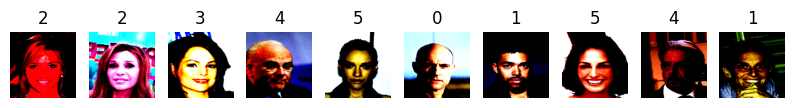

In [62]:
plotsample(train_dataset)

In [57]:
transform_val = transforms.Compose([transforms.Resize((256, 256)),
                                      transforms.CenterCrop(224), 
                                      transforms.ToTensor(),
                                      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                                        ])

In [58]:
val_dataset = torchvision.datasets.ImageFolder(root="D:\\TGI102_AI_BootCamp\\AIA_Interview\\SplitDatasets\\valset\\", 
                                           transform=transform_val
                                            )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

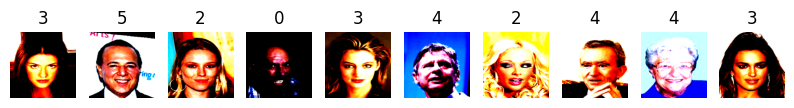

In [59]:
plotsample(val_dataset)

### 建立Resnet 模型

In [26]:
torch.manual_seed(1412)
resnet34_ = m.resnet34()

resnet34_

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [27]:
resnet34_.fc = torch.nn.Linear(512, 6, bias=True)
resnet34_

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [28]:
from torchinfo import summary

In [29]:
summary(resnet34_, (10, 3, 224, 224), depth=2, device='cpu')

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [10, 6]                   --
├─Conv2d: 1-1                            [10, 64, 112, 112]        9,408
├─BatchNorm2d: 1-2                       [10, 64, 112, 112]        128
├─ReLU: 1-3                              [10, 64, 112, 112]        --
├─MaxPool2d: 1-4                         [10, 64, 56, 56]          --
├─Sequential: 1-5                        [10, 64, 56, 56]          --
│    └─BasicBlock: 2-1                   [10, 64, 56, 56]          73,984
│    └─BasicBlock: 2-2                   [10, 64, 56, 56]          73,984
│    └─BasicBlock: 2-3                   [10, 64, 56, 56]          73,984
├─Sequential: 1-6                        [10, 128, 28, 28]         --
│    └─BasicBlock: 2-4                   [10, 128, 28, 28]         230,144
│    └─BasicBlock: 2-5                   [10, 128, 28, 28]         295,424
│    └─BasicBlock: 2-6                   [10, 128, 28, 28] 

### 定義與訓練/測試相關的函數(使用GPU)

#### 提前停止函數
當連續n次：　1.損失差值小於閾值　2. 新一次損失大於歷史最低損失(訓練效果越來越差)，即提前停止訓練

In [5]:
class EarlyStopping():
    def __init__(self, patience=5, tol=0.0005):  
        """
        當連續patience次迭代時，每一輪迭代的損失與歷史最低損失之間的差值小於閾值時
        就觸發提前停止(代表下次訓練準確率/Loss沒有上次訓練好, 可能是過擬合; 或模型已收斂, loss無法再降低)
        """
        self.patience = patience
        self.tol = tol
        self.counter = 0
        self.lowest_loss = None
        self.early_stop = False
        
    def __call__(self, val_loss):
        if self.lowest_loss == None:  
            self.lowest_loss = val_loss
        elif self.lowest_loss - val_loss > self.tol:
            self.lowest_loss = val_loss
            self.counter = 0
        elif self.lowest_loss - val_loss < self.tol:
            self.counter += 1
            print("\t NOTICE: Early stopping counter {} of {}".format(self.counter,self.patience))
            if self.counter >= self.patience:
                print('\t NOTICE: Early Stopping Actived')
                self.early_stop = True
                
        return self.early_stop

In [6]:
def IterOnce(net, criterion, opt, x, y):
    """
    對模型進行一次迭代的函數
    
    net: 實例化後的架構
    criterion: 損失函數
    opt: 優化算法
    x: 這一個batch中所有的樣本
    y: 這一個batch中所有樣本的真實標籤
    """
    sigma = net.forward(x)
    loss = criterion(sigma,y)
    loss.backward()
    opt.step()
    opt.zero_grad(set_to_none=True)
    yhat = torch.argmax(sigma,1)
    correct = torch.sum(yhat == y)
    return correct,loss

In [7]:
def TestOnce(net, criterion, x, y):
    """
    對一組數據進行測試並輸出測試結果的函數
    
    net: 經過訓練後的架構
    criterion：損失函數
    x：要測試的數據的所有樣本
    y：要測試的數據的真實標籤
    """
    with torch.no_grad(): 
        sigma = net.forward(x)
        loss = criterion(sigma,y)
        yhat = torch.argmax(sigma,1)
        correct = torch.sum(yhat == y)
    return correct,loss

In [8]:
torch.cuda.manual_seed(1412)
torch.cuda.manual_seed_all(1412)

In [9]:
def fit_test(net, batchdata, testdata, criterion, opt, epochs, patience, tol, modelname, PATH):
    """
    對模型進行訓練
    並在每個epoch後輸出訓練集和測試集上的準確率/損失，以實現對模型的監控
    保存最佳測試集準確率的模型權重
    
    參數說明：
    net: 實例化後的網路
    batchdata：使用Dataloader分割後的訓練數據
    testdata：使用Dataloader分割後的測試數據
    criterion：所使用的損失函數
    opt：所使用的優化算法
    epochs：一共要使用完整數據集訓練epochs次
    patience：Earlystop觸發的條件次數
    tol：提前停止時測試集上loss下降的閾值，連續patience次loss下降不超過tol就會觸發提前停止
    modelname：現在正在運行的模型名稱，用於保存權重時作為文件名
    PATH：將權重文件保存在path目錄下
    
    """  
    SamplePerEpoch = batchdata.dataset.__len__()
    allsamples = SamplePerEpoch*epochs
    trainedsamples = 0
    trainlosslist = []
    testlosslist = []
    trainacclist = []
    testacclist = []
    early_stopping = EarlyStopping(patience=patience, tol=tol)
    highestacc = None
    
    for epoch in range(1,epochs+1):
        net.train()
        correct_train = 0
        loss_train = 0
        for batch_idx, (x, y) in enumerate(batchdata):
            x = x.to(device,non_blocking=True)
            y = y.to(device,non_blocking=True).view(x.shape[0])
            correct, loss = IterOnce(net, criterion, opt, x, y)
            
            # 計算樣本總量、總的correct、loss
            trainedsamples += x.shape[0]
            loss_train += loss
            correct_train += correct
            
            if (batch_idx+1) % 125 == 0:
                print('Epoch{}:[{}/{}({:.0f}%)]'.format(epoch, 
                                                        trainedsamples, 
                                                        allsamples, 
                                                        100*trainedsamples/allsamples))
            
        TrainAccThisEpoch = float(correct_train*100)/SamplePerEpoch
        TrainLossThisEpoch = float(loss_train*100)/SamplePerEpoch # 平均每個樣本上的損失
        trainacclist.append(TrainAccThisEpoch)
        trainlosslist.append(TrainLossThisEpoch)
        
        # 清理GPU內存
        # 清理掉一個epoch循環下面不再需要的中間變量
        del x,y,correct,loss,correct_train,loss_train
        gc.collect()
        torch.cuda.empty_cache()
    
        #　每訓練完一個epoch，就在測試集上驗證模型現在的效果
        net.eval()
        loss_test = 0
        correct_test = 0
        loss_test = 0
        TestSample = testdata.dataset.__len__()

        for x,y in testdata:
            x = x.to(device, non_blocking=True)
            y = y.to(device, non_blocking=True).view(x.shape[0])
            correct, loss = TestOnce(net, criterion, x, y)
            loss_test += loss
            correct_test += correct

        TestAccThisEpoch = float(correct_test * 100)/TestSample
        TestLossThisEpoch = float(loss_test * 100)/TestSample
        testacclist.append(TestAccThisEpoch)
        testlosslist.append(TestLossThisEpoch)
        
        # 清理GPU內存
        del x,y,correct,loss,correct_test,loss_test
        gc.collect()
        torch.cuda.empty_cache()
        
        print("\t Train Loss:{:.6f}, Test Loss:{:.6f}, Train Acc:{:.3f}%, Test Acc:{:.3f}%".format(TrainLossThisEpoch, 
                                                                                                   TestLossThisEpoch, 
                                                                                                   TrainAccThisEpoch, 
                                                                                                   TestAccThisEpoch))
        
        # 若測試集準確率出現新高/測試集loss出現新低，保存這一組權重
        if highestacc == None:
            highestacc = TestAccThisEpoch
        if highestacc < TestAccThisEpoch:
            highestacc = TestAccThisEpoch
            torch.save(net.state_dict(),os.path.join(PATH,modelname+".pt"))
            print("\t Weight Saved")
        
        # 提前停止
        early_stop = early_stopping(TestLossThisEpoch)
        if early_stop == True:
            break
            
    print("Training Complete!")
    return trainlosslist, testlosslist, trainacclist, testacclist

----------------------------

### 加入lr_scheduler的訓練函數

In [10]:
def fit_test_lrscheduler(net, batchdata, testdata, criterion, opt, scheduler, epochs, patience, tol, modelname, PATH):
    """
    對模型進行訓練
    並在每個epoch後輸出訓練集和測試集上的準確率/損失，以實現對模型的監控
    保存最佳測試集準確率的模型權重
    加入學習率調度器，可以動態調整學習率
    
    參數說明：
    net: 實例化後的網路
    batchdata：使用Dataloader分割後的訓練數據
    testdata：使用Dataloader分割後的測試數據
    criterion：所使用的損失函數
    opt：所使用的優化算法
    scheduler：所使用的學習率調度器
    epochs：一共要使用完整數據集訓練epochs次
    patience：Earlystop觸發的條件次數
    tol：提前停止時測試集上loss下降的閾值，連續patience次loss下降不超過tol就會觸發提前停止
    modelname：現在正在運行的模型名稱，用於保存權重時作為文件名
    PATH：將權重文件保存在path目錄下
    
    """
    SamplePerEpoch = batchdata.dataset.__len__()
    allsamples = SamplePerEpoch*epochs
    trainedsamples = 0
    trainlosslist = []
    testlosslist = []
    trainacclist = []
    testacclist = []
    early_stopping = EarlyStopping(patience=patience, tol=tol)
    highestacc = None
    
    for epoch in range(1,epochs+1):
        net.train()
        correct_train = 0
        loss_train = 0
        for batch_idx, (x, y) in enumerate(batchdata):
            x = x.to(device,non_blocking=True)
            y = y.to(device,non_blocking=True).view(x.shape[0])
            correct, loss = IterOnce(net, criterion, opt, x, y)
            
            # 計算樣本總量、總的correct、loss
            trainedsamples += x.shape[0]
            loss_train += loss
            correct_train += correct
            
            if (batch_idx+1) % 125 == 0:
                print('Epoch{}:[{}/{}({:.0f}%)]'.format(epoch,
                                                        trainedsamples,
                                                        allsamples,
                                                        100*trainedsamples/allsamples))
        
        scheduler.step()
        
        TrainAccThisEpoch = float(correct_train*100)/SamplePerEpoch
        TrainLossThisEpoch = float(loss_train*100)/SamplePerEpoch  # 平均每個樣本上的損失
        trainacclist.append(TrainAccThisEpoch)
        trainlosslist.append(TrainLossThisEpoch)
        
        # 清理GPU內存
        # 清理掉一個epoch循環下面不再需要的中間變量
        del x,y,correct,loss,correct_train,loss_train
        gc.collect()
        torch.cuda.empty_cache()
    
        # 每訓練完一個epoch，在測試集上驗證模型現在的效果
        net.eval()
        loss_test = 0
        correct_test = 0
        loss_test = 0
        TestSample = testdata.dataset.__len__()

        for x,y in testdata:
            x = x.to(device, non_blocking=True)
            y = y.to(device, non_blocking=True).view(x.shape[0])
            correct, loss = TestOnce(net, criterion, x, y)
            loss_test += loss
            correct_test += correct

        TestAccThisEpoch = float(correct_test * 100)/TestSample
        TestLossThisEpoch = float(loss_test * 100)/TestSample
        testacclist.append(TestAccThisEpoch)
        testlosslist.append(TestLossThisEpoch)
        
        #清理GPU內存
        del x,y,correct,loss,correct_test,loss_test
        gc.collect()
        torch.cuda.empty_cache()
        
        print("\t Train Loss:{:.6f}, Test Loss:{:.6f}, Train Acc:{:.3f}%, Test Acc:{:.3f}%".format(TrainLossThisEpoch, 
                                                                                                   TestLossThisEpoch, 
                                                                                                   TrainAccThisEpoch, 
                                                                                                   TestAccThisEpoch))
        
        # 若測試集準確率出現新高/測試集loss出現新低，保存這一組權重
        if highestacc == None:
            highestacc = TestAccThisEpoch
        if highestacc < TestAccThisEpoch:
            highestacc = TestAccThisEpoch
            torch.save(net.state_dict(),os.path.join(PATH,modelname+".pt"))
            print("\t Weight Saved")
        
        # 提前停止
        early_stop = early_stopping(TestLossThisEpoch)
        if early_stop == True:
            break
            
    print("Training Complete!")
    return trainlosslist, testlosslist, trainacclist, testacclist

### 準備訓練所需的所有參數，執行訓練
net, batchdata, testdata, criterion, opt, scheduler, epochs, patience, tol, modelname, PATH

In [21]:
train_dataset

Dataset ImageFolder
    Number of datapoints: 3840
    Root location: D:\TGI102_AI_BootCamp\AIA_Interview\SplitDatasets\trainset\
    StandardTransform
Transform: Compose(
               Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=None)
               CenterCrop(size=(224, 224))
               RandomHorizontalFlip(p=0.5)
               ColorJitter(brightness=[0.7, 1.3], contrast=[0.7, 1.3], saturation=[0.5, 1.5], hue=[-0.1, 0.1])
               RandomRotation(degrees=[-5.0, 5.0], interpolation=nearest, expand=False, fill=0)
               RandomChoice(
               RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0), ratio=(0.75, 1.3333), interpolation=bilinear)
               RandomAffine(degrees=[0.0, 0.0], translate=(0.05, 0.05), shear=[3.0, 3.0])
           )(p=None)
               RandomApply(
               p=0.3
               Compose(
               CenterCrop(size=(150, 150))
               Pad(padding=(0, 70, 0, 0), fill=0, padding_mode=edge)
  

In [22]:
val_dataset

Dataset ImageFolder
    Number of datapoints: 960
    Root location: D:\TGI102_AI_BootCamp\AIA_Interview\SplitDatasets\valset\
    StandardTransform
Transform: Compose(
               Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=None)
               CenterCrop(size=(224, 224))
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

### 執行訓練函數

In [11]:
def full_procedure(net, epochs, bs, modelname, PATH, lr=0.001, patience=5, tol=10**(-5), 
                   optimizer="RMSprop", alpha=0.99, momentum=0, betas=(0.9, 0.999), wd=0):
    
    """
    將模型訓練及測試的所有參數準備好
    調用訓練及測試函數，輸出trainloss, testloss, trainacc, testacc列表
    
    參數說明：
    net: 實例化後的網絡
    epochs：一共要使用完整數據集epochs次
    bs：批次大小
    modelname：現在正在運行的模型名稱，用於保存權重時作為文件名
    PATH：將權重文件保存在path目錄下
    lr：學習率
    patience：Earlystop觸發的條件次數
    tol：提前停止時測試集上loss下降的閾值，連續patience次loss下降不超過tol就會觸發提前停止
    optmizer：所使用的優化算法
    alpha：RMSprop的參數
    momentum：SGD, RMSprop的參數
    betas： Adam的參數
    wd：Weight_decay, SGD, RMSprop, Adam的正則項
    """
    
    torch.cuda.manual_seed(1412)
    torch.cuda.manual_seed_all(1412)
    torch.manual_seed(1412)
    
    # 分割數據
    batchdata = DataLoader(train_dataset, batch_size=bs, shuffle=True
                           , drop_last=False)
    testdata = DataLoader(val_dataset, batch_size=bs, shuffle=False
                          , drop_last=False)
    
    # 損失函數，優化算法
    criterion = nn.CrossEntropyLoss(reduction="sum")
    if optimizer == "RMSprop":
        opt = optim.RMSprop(net.parameters(), lr=lr, 
                            alpha=alpha,momentum=momentum,weight_decay=wd)
    elif optimizer == "Adam":
        opt = optim.Adam(net.parameters(), lr=lr, 
                         betas=betas, weight_decay=wd)
    elif optimizer == "SGD":
        opt = optim.SGD(net.parameters(), lr=lr, 
                        momentum=momentum, weight_decay=wd)
    else:
        print("Please choose a optimizer: RMSprop, Adam, SGD.")
        
    # 訓練與測試
    trainloss, testloss, trainacc, testacc = fit_test(net,batchdata,testdata,criterion,opt,epochs,patience,tol,modelname,PATH)
    
    return trainloss, testloss, trainacc, testacc

### 加入lr_scheduler執行訓練函數

In [12]:
def full_procedure_lrscheduler(net, epochs, bs, modelname, PATH, lr=0.001, patience=5, tol=10**(-5), 
                               optimizer="RMSprop", alpha=0.99, momentum_SGD=0.9, momentum_RMS=0, betas=(0.9, 0.999), wd=0, 
                               scheduler="StepLR", step_size=5, gamma=0.1, T_max=5, eta_min=0, last_epoch=-1, 
                               mode="min", fator=0.1, patience_lr=10, verbose=False, threshold=0.0001, threshold_mode='rel', 
                               cooldown=0, min_lr=0):
    """
    將模型訓練及測試的所有參數準備好
    調用訓練及測試函數，輸出trainloss, testloss, trainacc, testacc列表
    
    參數說明：
    net: 實例化後的網絡
    epochs：一共要使用完整數據集epochs次
    bs：批次大小
    modelname：現在正在運行的模型名稱，用於保存權重時作為文件名
    PATH：將權重文件保存在path目錄下
    lr：學習率
    patience：Earlystop的條件達成次數
    tol：提前停止時測試集上loss下降的閾值，連續patience次loss下降不超過tol就會觸發提前停止
    optmizer：所使用的優化算法，本函數目前提供SGD, RMSprop, Adam三種可選
    alpha：RMSprop的參數，預設值為0.99
    momentum：SGD, RMSprop的參數，SGD預設值0.9，RSMprop預設值為0
    betas： Adam的參數，預設值為(0.9, 0.999)
    wd：Weight_decay, SGD, RMSprop, Adam的正則項，預設值為0
    scheduler：學習率調度器，本函數目前提供StepLR, ExponentialLR, CosineAnnealingLR, ReduceLROnPlateau四種可選
    step_size(int)：每幾個Epoch要調整學習率，StepLR, ExponentialLR的參數，預設值為5
    gamma(float)：學習率調整的倍率，StepLR, ExponentialLR的參數，預設值為0.1
    T_max(int)：一次學習率週期的迭代次數，即T_max個epoch之後重新設置學習率，CosineAnnealingLR的參數，預設值為5
    eta_min(float)：最小學習率，即在一個週期中，學習率最小會下降到eta_min，CosineAnnealingLR的參數，預設值為0
    last_epoch(int)：指示從哪一個Epoch開始調整學習率，StepLR, ExponentialLR, CosineAnnealingLR的參數，預設值為-1，表示從頭開始
    mode(str)：模式選擇，有min和max兩種模式，min表示當指標不再降低(如監測loss)，max表示當指標不再升高(如監測accuracy)，ReduceLROnPlateau的參數
    factor(float)：學習率調整倍數(等同於其它學習率調整器的gamma)，ReduceLROnPlateau的參數
    patience_lr(int)：即忍受該指標多少個step不變化，當超過patience次時，調整學習率，ReduceLROnPlateau的參數
    verbose(bool)：是否打印學習率信息，ReduceLROnPlateau的參數
    threshold(float)：配合threshold_mode使用，預設值1e-4，作用是用來控制當前指標與best指標的差異，ReduceLROnPlateau的參數
    threshold_mode(str)：選擇判斷指標是否達最優的模式，有兩種模式，rel和abs，ReduceLROnPlateau的參數
    cooldown(int)：“冷卻時間“，當調整學習率之後，讓學習率調整策略冷靜一下，讓模型再訓練一段時間，再重啟監測模式，ReduceLROnPlateau的參數
    min_lr(float or list)：學習率下限，可為float，或者list，當有多個參數組時，可用list進行設置，ReduceLROnPlateau的參數
    """
    
    torch.cuda.manual_seed(1412)
    torch.cuda.manual_seed_all(1412)
    torch.manual_seed(1412)
    
    # 分割數據
    batchdata = DataLoader(train_dataset,batch_size=bs,shuffle=True
                       ,drop_last=False)
    testdata = DataLoader(val_dataset,batch_size=bs,shuffle=False
                      ,drop_last=False)
    
    # 損失函數，優化算法
    criterion = nn.CrossEntropyLoss(reduction="sum")  # 進行損失函數計算時，最後輸出結果的計算模式
    
    if optimizer == "RMSprop":
        opt = optim.RMSprop(net.parameters(), lr=lr, 
                            alpha=alpha,momentum=momentum_RMS,weight_decay=wd)
    elif optimizer == "Adam":
        opt = optim.Adam(net.parameters(), lr=lr, 
                         betas=betas, weight_decay=wd)
    elif optimizer == "SGD":
        opt = optim.SGD(net.parameters(), lr=lr, 
                        momentum=momentum_SGD, weight_decay=wd)
    else:
        print("Please choose a optimizer: RMSprop, Adam, SGD. \nOr you should modify the \"full_procedure function\" to add other optimizer.")
        
    # 學習率調度器
    if scheduler == "StepLR":
        scheduler = optim.lr_scheduler.StepLR(optimizer=opt, step_size=step_size, gamma=gamma, last_epoch=last_epoch)
    elif scheduler == "ExponentialLR":
        scheduler = optim.lr_scheduler.ExponentialLR(optimizer=opt, gamma=gamma, last_epoch=last_epoch)
    elif scheduler == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer=opt, T_max=T_max, eta_min=eta_min, last_epoch=last_epoch)
    elif scheduler == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode=mode, factor=factor, patience=patience_lr, verbose=verbose, 
                                                         threshold=threshold, threshold_mode=threshold_mode, cooldown=cooldown, min_lr=min_lr, eps=1e-08)
    else:
        print("Please choose a lr.scheduler: StepLR, ExponentialLR, CosineAnnealingLR, ReduceLROnPlateau. \nOr you should modify the \"full_procedure function\" to add other lr.scheduler.")
    
    
    # 訓練與測試
    trainloss, testloss, trainacc, testacc = fit_test_lrscheduler(net,batchdata,testdata,criterion,opt,scheduler,epochs,patience,tol,modelname,PATH)
    
    return trainloss, testloss, trainacc, testacc

### Loss, Accuracy繪圖函數

In [13]:
# 繪圖函數
def plotgraph(trainloss, testloss, trainacc, testacc, 
              epochs, firsttitle="Train/Test Loss", secondtitle="Train/Test Acc", save=False, PATH=None, filename=None):
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    ax1 = axes[0]
    ax1.plot(trainloss, color="red", label="Trainloss")
    ax1.plot(testloss, color="orange", label="Testloss")
    ax1.title.set_text(firsttitle)
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.legend()
    
    ax2 = axes[1]
    ax2.plot(trainacc, color="red", label="TrainAcc")
    ax2.plot(testacc, color="orange", label="TestAcc")
    ax2.set_ylim(0, 100)
    ax2.title.set_text(secondtitle)
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Accuracy')
    ax2.legend()
    
    if save is True:
        plt.savefig(os.path.join(PATH, filename+".jpg"))
        print("JPEG figure saved!")
    
    plt.show()

### Data_to_csv 函數

In [14]:
# 將data整理存成csv檔案
def save_data_csv(save_PATH, filename, modelname, trainloss, testloss, trainacc, testacc, total_time, trained_epochs=0):
    with open(os.path.join(save_PATH, filename+".csv"), "a", newline='') as csvfile:
        writer = csv.writer(csvfile)
        index = ("Total trained epochs", "Max trainacc", "Max testacc", "Mean trainacc", "Mean testacc", 
                 "Max trainloss", "Min trainloss", "Max testloss", "Min testloss", "Running time")
        values = ((len(trainacc)+trained_epochs), np.max(trainacc), np.max(testacc), np.mean(trainacc), np.mean(testacc), 
              np.max(trainloss), np.min(trainloss), np.max(testloss), np.min(testloss), "{} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))

        epochs = ("", "Epoch: " + str(trainacc.index(np.max(trainacc))+1), "Epoch: " + str(testacc.index(np.max(testacc))+1), "", "", 
              "Epoch: " + str(trainloss.index(np.max(trainloss))+1), "Epoch: " + str(trainloss.index(np.min(trainloss))+1), 
              "Epoch: " + str(testloss.index(np.max(testloss))+1), "Epoch: " + str(testloss.index(np.min(testloss))+1), ""
              )

        data = list(zip(index, values, epochs))

        writer.writerow(["Model name: ", modelname])
        writer.writerow(["Trainloss Raw Data: ", trainloss])
        writer.writerow(["Testloss Raw Data: ", testloss])
        writer.writerow(["Trainacc Raw Data: ", trainacc])
        writer.writerow(["Testloss Raw Data: ", testloss])
        writer.writerow("\n")
        for onedata in data:
            writer.writerow(onedata)
        writer.writerow("\n")
        writer.writerow("\n")

    print("Data all saved!")

In [15]:
torch.cuda.memory_allocated() # 張量內存的佔用情況（現狀）
torch.cuda.memory_reserved() # 緩存分配器佔用的所有內存（現狀）
torch.cuda.max_memory_allocated() # 自GPU運行以來佔用過的最大張量內存（峰值）

0

### 訓練ResNet網路

#### Resnet34(Without pretrained)
和AlexNet, CustomResNet(2個residual block), ResNet18(4個residual block)比較

ResNet34_test0_bs8
Epoch1:[1000/38400(3%)]
Epoch1:[2000/38400(5%)]
Epoch1:[3000/38400(8%)]
	 Train Loss:181.205632, Test Loss:180.376416, Train Acc:25.339%, Test Acc:32.188%
Epoch2:[4840/38400(13%)]
Epoch2:[5840/38400(15%)]
Epoch2:[6840/38400(18%)]
	 Train Loss:155.421566, Test Loss:153.741960, Train Acc:34.219%, Test Acc:39.792%
	 Weight Saved
Epoch3:[8680/38400(23%)]
Epoch3:[9680/38400(25%)]
Epoch3:[10680/38400(28%)]
	 Train Loss:147.141553, Test Loss:136.480396, Train Acc:39.844%, Test Acc:43.021%
	 Weight Saved
Epoch4:[12520/38400(33%)]
Epoch4:[13520/38400(35%)]
Epoch4:[14520/38400(38%)]
	 Train Loss:133.180314, Test Loss:136.910189, Train Acc:45.443%, Test Acc:47.708%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 5
Epoch5:[16360/38400(43%)]
Epoch5:[17360/38400(45%)]
Epoch5:[18360/38400(48%)]
	 Train Loss:120.288965, Test Loss:135.992936, Train Acc:53.177%, Test Acc:54.271%
	 Weight Saved
Epoch6:[20200/38400(53%)]
Epoch6:[21200/38400(55%)]
Epoch6:[22200/38400(58%)]
	 Train L

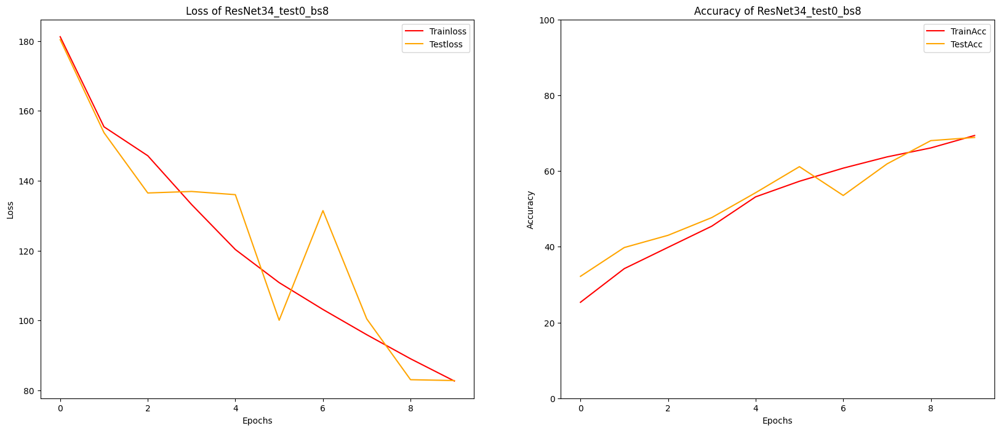

ResNet34_test0_bs16
Epoch1:[2000/38400(5%)]
	 Train Loss:176.867269, Test Loss:214.101286, Train Acc:30.339%, Test Acc:30.312%
Epoch2:[5840/38400(15%)]
	 Train Loss:147.488688, Test Loss:140.530924, Train Acc:40.391%, Test Acc:41.979%
	 Weight Saved
Epoch3:[9680/38400(25%)]
	 Train Loss:137.170036, Test Loss:187.377783, Train Acc:45.859%, Test Acc:29.375%
	 NOTICE: Early stopping counter 1 of 5
Epoch4:[13520/38400(35%)]
	 Train Loss:122.175977, Test Loss:118.928947, Train Acc:52.526%, Test Acc:53.646%
	 Weight Saved
Epoch5:[17360/38400(45%)]
	 Train Loss:112.303198, Test Loss:128.370768, Train Acc:56.693%, Test Acc:53.021%
	 NOTICE: Early stopping counter 1 of 5
Epoch6:[21200/38400(55%)]
	 Train Loss:104.087020, Test Loss:106.466520, Train Acc:60.000%, Test Acc:60.312%
	 Weight Saved
Epoch7:[25040/38400(65%)]
	 Train Loss:94.202148, Test Loss:86.260636, Train Acc:64.531%, Test Acc:67.188%
	 Weight Saved
Epoch8:[28880/38400(75%)]
	 Train Loss:89.736890, Test Loss:115.297624, Train Acc:6

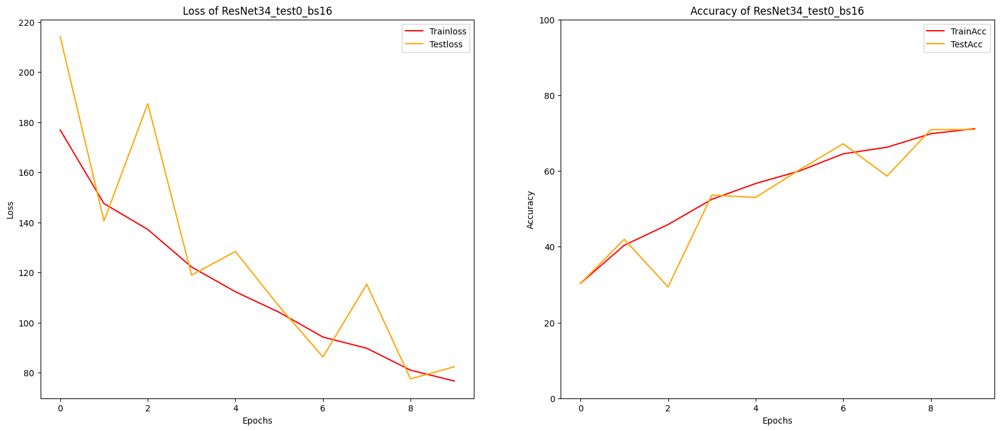

ResNet34_test0_bs32
	 Train Loss:184.709277, Test Loss:184.675195, Train Acc:29.323%, Test Acc:24.375%
	 Train Loss:147.762061, Test Loss:127.939429, Train Acc:41.536%, Test Acc:52.292%
	 Weight Saved
	 Train Loss:133.170215, Test Loss:148.659098, Train Acc:48.073%, Test Acc:55.208%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 5
	 Train Loss:118.352572, Test Loss:152.144173, Train Acc:53.646%, Test Acc:58.750%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 5
	 Train Loss:105.800358, Test Loss:134.870467, Train Acc:59.583%, Test Acc:55.104%
	 NOTICE: Early stopping counter 3 of 5
	 Train Loss:94.295003, Test Loss:108.492814, Train Acc:64.922%, Test Acc:67.083%
	 Weight Saved
	 Train Loss:86.950317, Test Loss:102.933732, Train Acc:68.203%, Test Acc:66.146%
	 Train Loss:82.090934, Test Loss:95.557772, Train Acc:69.401%, Test Acc:66.875%
	 Train Loss:77.966878, Test Loss:72.493351, Train Acc:70.286%, Test Acc:73.542%
	 Weight Saved
	 Train Loss:71.969417, Test Loss:80.461190,

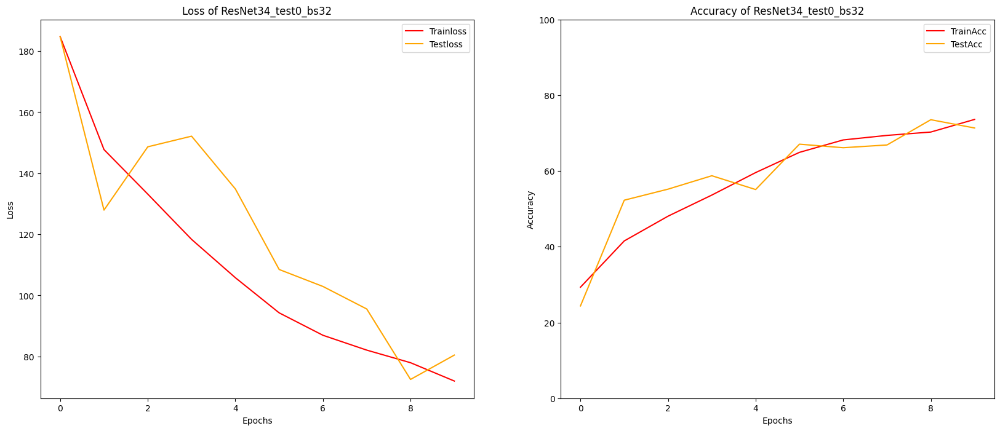

ResNet34_test0_bs64
	 Train Loss:192.109880, Test Loss:209.112126, Train Acc:25.964%, Test Acc:18.333%
	 Train Loss:152.379036, Test Loss:150.617546, Train Acc:37.578%, Test Acc:40.729%
	 Weight Saved
	 Train Loss:139.165755, Test Loss:172.979395, Train Acc:44.375%, Test Acc:33.958%
	 NOTICE: Early stopping counter 1 of 5
	 Train Loss:130.687012, Test Loss:123.618709, Train Acc:48.021%, Test Acc:53.333%
	 Weight Saved
	 Train Loss:122.878491, Test Loss:149.621305, Train Acc:52.995%, Test Acc:44.062%
	 NOTICE: Early stopping counter 1 of 5
	 Train Loss:116.038411, Test Loss:209.723861, Train Acc:55.312%, Test Acc:36.667%
	 NOTICE: Early stopping counter 2 of 5
	 Train Loss:114.722428, Test Loss:109.979150, Train Acc:56.120%, Test Acc:56.042%
	 Weight Saved
	 Train Loss:105.172746, Test Loss:146.334538, Train Acc:59.531%, Test Acc:47.917%
	 NOTICE: Early stopping counter 1 of 5
	 Train Loss:96.631600, Test Loss:163.086263, Train Acc:62.708%, Test Acc:49.792%
	 NOTICE: Early stopping coun

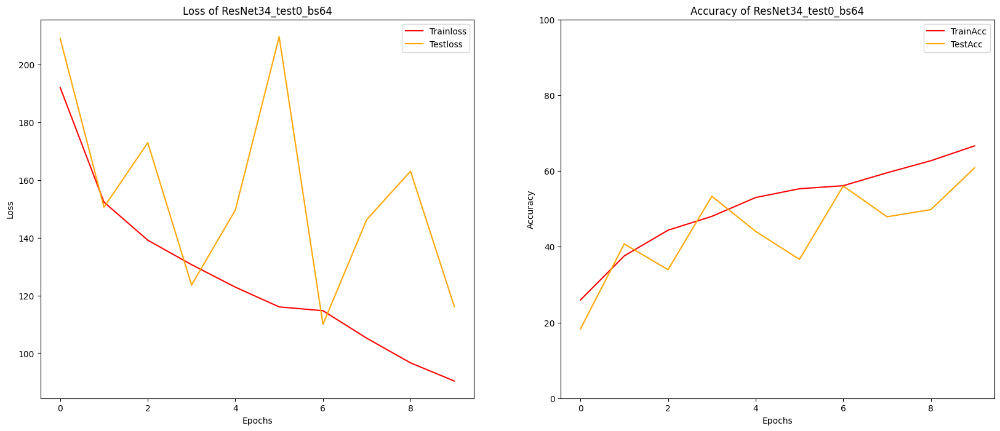

In [80]:
# 使用不同batch_size, 先訓練10個epochs看看效果
for bs in [8, 16, 32, 64]:
    epochs = 10
    PATH = r"D:\TGI102_AI_BootCamp\AIA_Interview\weights"
    modelname = "ResNet34_test0_bs{}".format(bs)
    firsttitle = "Loss of " + modelname
    secondtitle = "Accuracy of " + modelname

    print(modelname)
    torch.manual_seed(1412)
    net = m.resnet34()
    net.fc = torch.nn.Linear(512, 6, bias=True)
    net = net.to(device,non_blocking=True)
    start = time()
    trainloss, testloss, trainacc, testacc = full_procedure(net, epochs=epochs, bs=bs
                                              ,modelname=modelname
                                              ,PATH=PATH
                                              ,optimizer="RMSprop"
                                              ,patience=10)
    
    print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
    print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
    print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
    print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
    total_time = time()-start
    print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
    plotgraph(trainloss, testloss, trainacc, testacc, epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle)

**ResNet34_test0_bs16 10 Epochs** <br>
Total trained epochs: 10 <br>
Max trainacc:  71.171875 	Epoch: 10 <br>
Max testacc:  70.9375 	Epoch: 9 <br>
Mean trainacc:  55.763020833333336 <br>
Mean testacc:  53.63541666666667 <br>
5.0 minutes, 58 seconds. <br>
<br>
**ResNet34_test0_bs32 10 Epochs** <br>
Total trained epochs: 10 <br>
Max trainacc:  73.61979166666667 	Epoch: 10 <br>
Max testacc:  73.54166666666667 	Epoch: 9 <br>
Mean trainacc:  57.859375 <br>
Mean testacc:  59.072916666666664 <br>
5.0 minutes, 29 seconds. <br>
<br>
10個Epochs的條件下，不論是哪一個batch size，trainloss/testloss都持續下降。 <br>
batchsize = 32的testacc表現最好，batchsize =16提早停止次數出現最少（未來發展性較好），選擇這兩個batchsize再進行訓練。 <br>

ResNet34_test1_bs16
Epoch1:[2000/76800(3%)]
	 Train Loss:98.268026, Test Loss:94.785693, Train Acc:63.151%, Test Acc:68.021%
Epoch2:[5840/76800(8%)]
	 Train Loss:75.380461, Test Loss:77.696688, Train Acc:72.240%, Test Acc:71.771%
	 Weight Saved
Epoch3:[9680/76800(13%)]
	 Train Loss:71.636833, Test Loss:65.240682, Train Acc:73.385%, Test Acc:76.979%
	 Weight Saved
Epoch4:[13520/76800(18%)]
	 Train Loss:64.394556, Test Loss:78.366447, Train Acc:76.432%, Test Acc:71.667%
	 NOTICE: Early stopping counter 1 of 10
Epoch5:[17360/76800(23%)]
	 Train Loss:62.204773, Test Loss:69.936898, Train Acc:76.875%, Test Acc:75.104%
	 NOTICE: Early stopping counter 2 of 10
Epoch6:[21200/76800(28%)]
	 Train Loss:60.236117, Test Loss:68.104281, Train Acc:78.151%, Test Acc:75.208%
	 NOTICE: Early stopping counter 3 of 10
Epoch7:[25040/76800(33%)]
	 Train Loss:56.893766, Test Loss:66.156075, Train Acc:79.870%, Test Acc:76.250%
	 NOTICE: Early stopping counter 4 of 10
Epoch8:[28880/76800(38%)]
	 Train Loss:53.

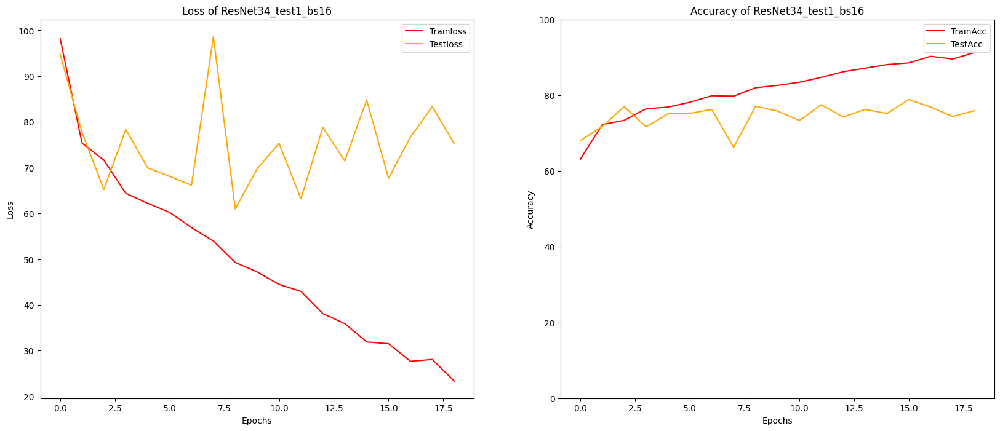

ResNet34_test1_bs32
	 Train Loss:142.916683, Test Loss:121.076481, Train Acc:45.208%, Test Acc:53.542%
	 Train Loss:104.343107, Test Loss:115.066398, Train Acc:59.661%, Test Acc:59.896%
	 Weight Saved
	 Train Loss:87.542847, Test Loss:83.326139, Train Acc:65.807%, Test Acc:68.854%
	 Weight Saved
	 Train Loss:77.553044, Test Loss:116.874618, Train Acc:71.615%, Test Acc:58.125%
	 NOTICE: Early stopping counter 1 of 10
	 Train Loss:72.045378, Test Loss:76.592765, Train Acc:73.047%, Test Acc:72.708%
	 Weight Saved
	 Train Loss:66.653434, Test Loss:90.740104, Train Acc:74.557%, Test Acc:71.458%
	 NOTICE: Early stopping counter 1 of 10
	 Train Loss:61.998022, Test Loss:79.519173, Train Acc:77.057%, Test Acc:71.250%
	 NOTICE: Early stopping counter 2 of 10
	 Train Loss:59.274679, Test Loss:100.770597, Train Acc:77.552%, Test Acc:66.458%
	 NOTICE: Early stopping counter 3 of 10
	 Train Loss:53.527608, Test Loss:64.317346, Train Acc:80.156%, Test Acc:75.104%
	 Weight Saved
	 Train Loss:51.05577

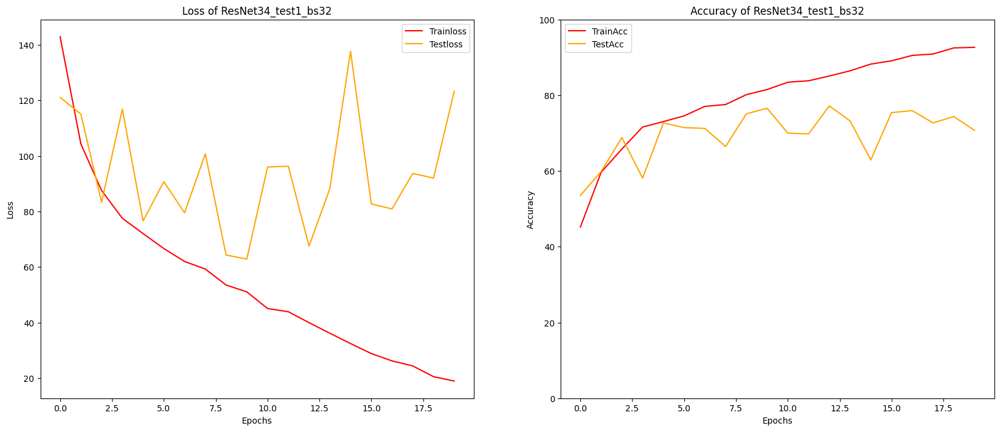

In [83]:
# 用16, 32 這兩個bs已訓練過10個Epochs的權重檔再訓練20個Epochs
for bs in [16, 32]:
    epochs = 20
    optimizer = "RMSprop"
    PATH = r"D:\TGI102_AI_BootCamp\AIA_Interview\weights"
    modelname = "ResNet34_test1_bs{}".format(bs)
    firsttitle = "Loss of " + modelname
    secondtitle = "Accuracy of " + modelname

    print(modelname)
    torch.manual_seed(1412)
    net = m.resnet34()
    net.fc = torch.nn.Linear(512, 6, bias=True)
    net = net.to(device,non_blocking=True)
    net.load_state_dict(torch.load(r"D:\TGI102_AI_BootCamp\AIA_Interview\weights\ResNet34_test0_bs{}.pt".format(bs)))
    
    start = time()
    trainloss, testloss, trainacc, testacc = full_procedure(net, epochs=epochs, bs=bs
                                              ,modelname=modelname
                                              ,PATH=PATH
                                              ,optimizer=optimizer
                                              ,patience=10)

    print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
    print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
    print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
    print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
    total_time = time()-start
    print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
    plotgraph(trainloss, testloss, trainacc, testacc, epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle)


**ResNet34_test1_bs16_lr=0.001** <br>
Total trained epochs: 29 <br>
Max trainacc: 91.276% 	Epoch: 19 <br>
Max testacc: 78.854% 	Epoch: 16 <br>
Mean trainacc: 81.774% <br>
Mean testacc: 74.567% <br>
Running time: 11.0 minutes, 30 seconds. <br>
<br>
**ResNet34_test1_bs32_lr=0.001** <br>
Total trained epochs: 30 <br>
Max trainacc: 92.656% 	Epoch: 20 <br>
Max testacc: 77.188% 	Epoch: 13 <br>
Mean trainacc: 79.443% <br>
Mean testacc: 69.812% <br>
Running time: 10.0 minutes, 52 seconds. <br>
<br>
兩個batchsize的trainloss都持續下降，但testloss表現很不穩定，隱隱有上升趨勢。 <br>
調整lr來穩定疊代，選擇testloss表現較穩定的batchsize=16，已訓練10個epochs的權重檔為基礎來進行lr調整實驗並訓練30個epochs。 <br>

ResNet34_test1_bs16_lr0.0075
Epoch1:[2000/115200(2%)]
	 Train Loss:192.684896, Test Loss:169.540999, Train Acc:25.964%, Test Acc:20.833%
Epoch2:[5840/115200(5%)]
	 Train Loss:151.767057, Test Loss:166.193815, Train Acc:36.068%, Test Acc:43.646%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:141.184521, Test Loss:126.505754, Train Acc:42.708%, Test Acc:48.750%
	 Weight Saved
Epoch4:[13520/115200(12%)]
	 Train Loss:124.396745, Test Loss:105.832454, Train Acc:51.484%, Test Acc:61.042%
	 Weight Saved
Epoch5:[17360/115200(15%)]
	 Train Loss:111.202873, Test Loss:110.049284, Train Acc:56.589%, Test Acc:54.792%
	 NOTICE: Early stopping counter 1 of 15
Epoch6:[21200/115200(18%)]
	 Train Loss:102.815023, Test Loss:100.423543, Train Acc:60.938%, Test Acc:59.896%
Epoch7:[25040/115200(22%)]
	 Train Loss:91.630762, Test Loss:113.376595, Train Acc:65.651%, Test Acc:57.188%
	 NOTICE: Early stopping counter 1 of 15
Epoch8:[28880/115200(25%)]
	 Train Loss:87.035262, Test Loss:100.642969, Train Ac

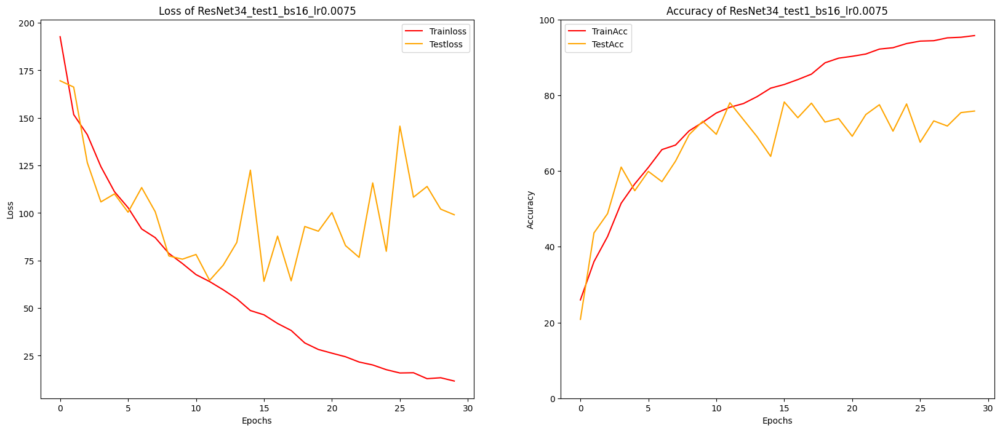

ResNet34_test1_bs16_lr0.0005
Epoch1:[2000/115200(2%)]
	 Train Loss:73.777620, Test Loss:69.348885, Train Acc:73.750%, Test Acc:75.312%
Epoch2:[5840/115200(5%)]
	 Train Loss:64.089897, Test Loss:72.503499, Train Acc:76.641%, Test Acc:74.062%
	 NOTICE: Early stopping counter 1 of 15
Epoch3:[9680/115200(8%)]
	 Train Loss:61.416842, Test Loss:60.361031, Train Acc:77.135%, Test Acc:77.083%
	 Weight Saved
Epoch4:[13520/115200(12%)]
	 Train Loss:55.633329, Test Loss:78.724178, Train Acc:79.453%, Test Acc:71.771%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[17360/115200(15%)]
	 Train Loss:54.056205, Test Loss:64.433313, Train Acc:79.740%, Test Acc:76.771%
	 NOTICE: Early stopping counter 2 of 15
Epoch6:[21200/115200(18%)]
	 Train Loss:52.818575, Test Loss:63.046537, Train Acc:80.781%, Test Acc:75.938%
	 NOTICE: Early stopping counter 3 of 15
Epoch7:[25040/115200(22%)]
	 Train Loss:48.996285, Test Loss:64.083289, Train Acc:82.161%, Test Acc:76.979%
	 NOTICE: Early stopping counter 4 of 15
E

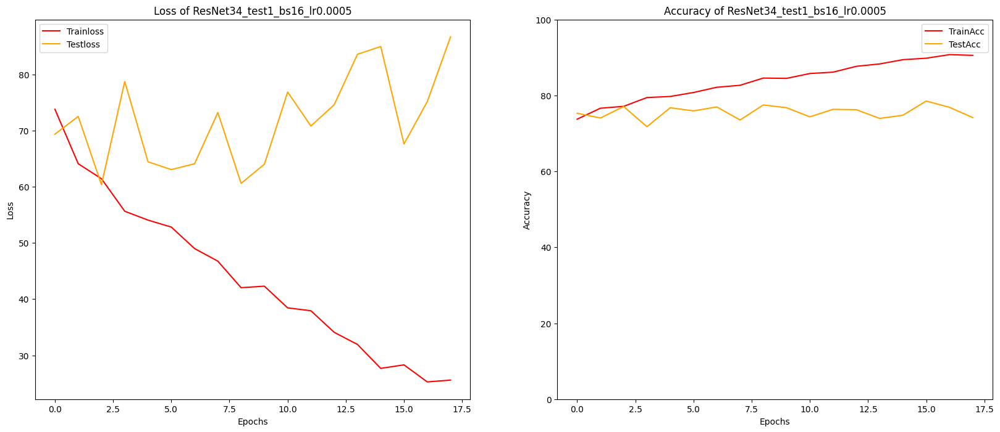

ResNet34_test1_bs16_lr0.00025
Epoch1:[2000/115200(2%)]
	 Train Loss:66.059749, Test Loss:61.531291, Train Acc:76.276%, Test Acc:77.708%
Epoch2:[5840/115200(5%)]
	 Train Loss:59.504565, Test Loss:61.781840, Train Acc:78.151%, Test Acc:76.250%
	 NOTICE: Early stopping counter 1 of 15
Epoch3:[9680/115200(8%)]
	 Train Loss:57.102942, Test Loss:56.307031, Train Acc:78.776%, Test Acc:78.333%
	 Weight Saved
Epoch4:[13520/115200(12%)]
	 Train Loss:52.738139, Test Loss:64.222957, Train Acc:80.990%, Test Acc:77.083%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[17360/115200(15%)]
	 Train Loss:51.288611, Test Loss:56.910140, Train Acc:81.172%, Test Acc:79.062%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 15
Epoch6:[21200/115200(18%)]
	 Train Loss:50.450122, Test Loss:67.120622, Train Acc:81.797%, Test Acc:74.583%
	 NOTICE: Early stopping counter 3 of 15
Epoch7:[25040/115200(22%)]
	 Train Loss:47.427637, Test Loss:59.947375, Train Acc:82.760%, Test Acc:78.229%
	 NOTICE: Early stopping c

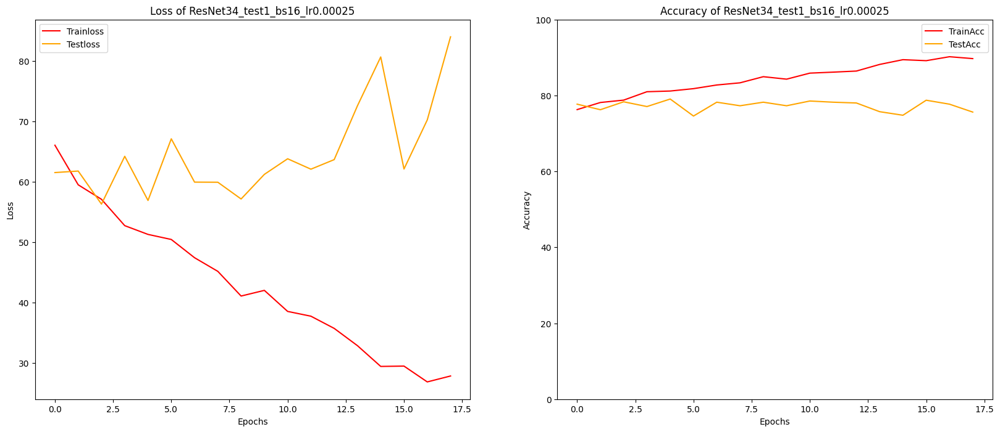

ResNet34_test1_bs16_lr0.0002
Epoch1:[2000/115200(2%)]
	 Train Loss:64.823641, Test Loss:59.499772, Train Acc:76.667%, Test Acc:78.125%
Epoch2:[5840/115200(5%)]
	 Train Loss:58.855929, Test Loss:60.126217, Train Acc:78.776%, Test Acc:77.188%
	 NOTICE: Early stopping counter 1 of 15
Epoch3:[9680/115200(8%)]
	 Train Loss:56.651770, Test Loss:55.766447, Train Acc:78.984%, Test Acc:77.917%
Epoch4:[13520/115200(12%)]
	 Train Loss:52.678052, Test Loss:62.202441, Train Acc:80.938%, Test Acc:77.708%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[17360/115200(15%)]
	 Train Loss:51.296436, Test Loss:55.551961, Train Acc:81.068%, Test Acc:78.438%
	 Weight Saved
Epoch6:[21200/115200(18%)]
	 Train Loss:50.751742, Test Loss:62.657812, Train Acc:81.224%, Test Acc:76.042%
	 NOTICE: Early stopping counter 1 of 15
Epoch7:[25040/115200(22%)]
	 Train Loss:47.768172, Test Loss:58.236560, Train Acc:82.839%, Test Acc:78.333%
	 NOTICE: Early stopping counter 2 of 15
Epoch8:[28880/115200(25%)]
	 Train Loss:45

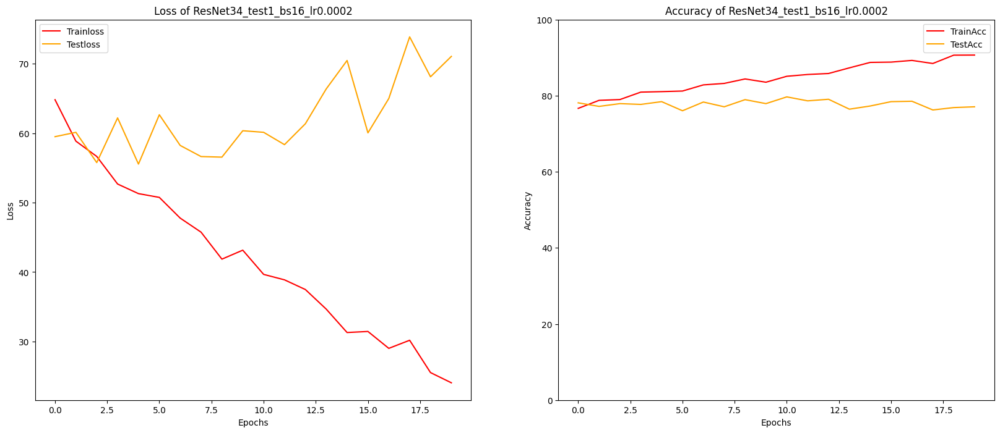

ResNet34_test1_bs16_lr0.0001
Epoch1:[2000/115200(2%)]
	 Train Loss:63.018722, Test Loss:57.015039, Train Acc:77.578%, Test Acc:78.438%
Epoch2:[5840/115200(5%)]
	 Train Loss:58.707345, Test Loss:55.811031, Train Acc:78.802%, Test Acc:78.958%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:56.962292, Test Loss:55.916838, Train Acc:78.932%, Test Acc:77.604%
	 NOTICE: Early stopping counter 1 of 15
Epoch4:[13520/115200(12%)]
	 Train Loss:53.934664, Test Loss:56.007727, Train Acc:80.964%, Test Acc:79.375%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 15
Epoch5:[17360/115200(15%)]
	 Train Loss:52.694727, Test Loss:54.370353, Train Acc:80.469%, Test Acc:78.542%
Epoch6:[21200/115200(18%)]
	 Train Loss:52.899947, Test Loss:56.019104, Train Acc:80.417%, Test Acc:78.333%
	 NOTICE: Early stopping counter 1 of 15
Epoch7:[25040/115200(22%)]
	 Train Loss:50.411804, Test Loss:54.177022, Train Acc:81.641%, Test Acc:79.375%
Epoch8:[28880/115200(25%)]
	 Train Loss:49.103703, Test Loss:53.4925

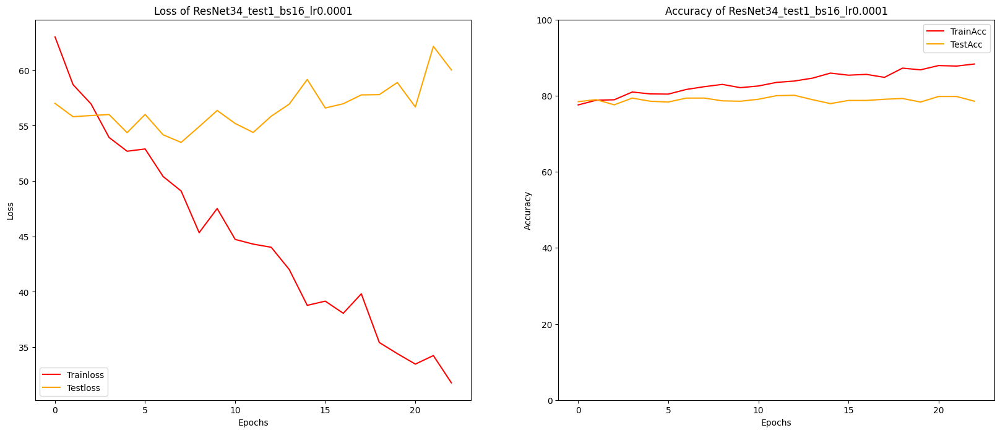

ResNet34_test1_bs16_lr5e-05
Epoch1:[2000/115200(2%)]
	 Train Loss:63.127100, Test Loss:57.534383, Train Acc:77.786%, Test Acc:78.229%
Epoch2:[5840/115200(5%)]
	 Train Loss:59.973360, Test Loss:56.293490, Train Acc:78.438%, Test Acc:79.062%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:58.431681, Test Loss:57.397673, Train Acc:78.594%, Test Acc:78.438%
	 NOTICE: Early stopping counter 1 of 15
Epoch4:[13520/115200(12%)]
	 Train Loss:55.809029, Test Loss:55.127279, Train Acc:80.573%, Test Acc:79.583%
	 Weight Saved
Epoch5:[17360/115200(15%)]
	 Train Loss:54.906946, Test Loss:54.999878, Train Acc:79.740%, Test Acc:78.438%
Epoch6:[21200/115200(18%)]
	 Train Loss:55.341606, Test Loss:54.987598, Train Acc:79.609%, Test Acc:78.229%
Epoch7:[25040/115200(22%)]
	 Train Loss:53.312219, Test Loss:54.430461, Train Acc:80.573%, Test Acc:78.646%
Epoch8:[28880/115200(25%)]
	 Train Loss:52.660238, Test Loss:53.294523, Train Acc:81.042%, Test Acc:79.271%
Epoch9:[32720/115200(28%)]
	 Train Loss:48.

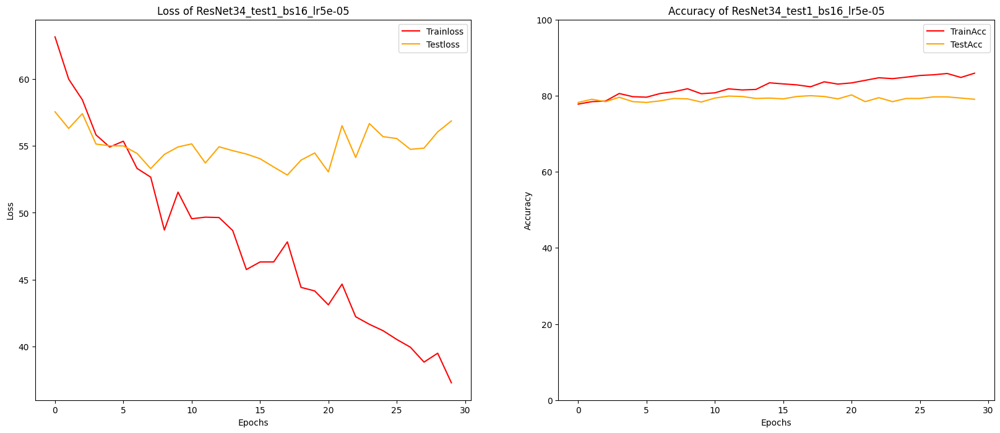

In [85]:
# batch size = 16 test acc表現較穩定
# 之前預設的 lr=0.001
# 用這個bs以已訓練10個Epochs的權重檔案為基礎, 調整lr再訓練30個Epochs
for lr in [0.0075, 0.0005, 0.00025, 0.0002, 0.0001, 0.00005]:
    epochs = 30
    bs = 16
    PATH = r"D:\TGI102_AI_BootCamp\AIA_Interview\weights"
    modelname = "ResNet34_test1_bs16_lr{}".format(lr)
    firsttitle = "Loss of " + modelname
    secondtitle = "Accuracy of " + modelname

    print(modelname)
    torch.manual_seed(1412)
    net = m.resnet34()
    net.fc = torch.nn.Linear(512, 6, bias=True)
    net = net.to(device,non_blocking=True)
    net.load_state_dict(torch.load(r"D:\TGI102_AI_BootCamp\AIA_Interview\weights\ResNet34_test0_bs16.pt"))
    
    start = time()
    trainloss, testloss, trainacc, testacc = full_procedure(net,epochs=epochs, bs=bs
                                             ,modelname=modelname
                                             ,PATH = PATH
                                             ,lr=lr
                                             ,tol = 10**(-10)
                                             ,patience=15)

    print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
    print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
    print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
    print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
    total_time = time()-start
    print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
    plotgraph(trainloss, testloss, trainacc, testacc, epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle)


**ResNet34_test1_bs16_lr0.0002** <br>
Total trained epochs: 30 <br>
Max trainacc: 90.677% 	Epoch: 20 <br>
Max testacc: 79.688% 	Epoch: 11 <br>
Mean trainacc: 84.607% <br>
Mean testacc: 77.802% <br>
Running time: 12.0 minutes, 26 seconds. <br>
<br>
**ResNet34_test1_bs16_lr0.0001** <br>
Max trainacc: 88.333% 	Epoch: 23 <br>
Max testacc: 80.104% 	Epoch: 13 <br>
Mean trainacc: 83.503% <br>
Mean testacc: 78.936% <br>
Running time: 14.0 minutes, 15 seconds. <br>
<br>
**ResNet34_test1_bs16_lr0.00005** <br>
Max trainacc: 85.911% 	Epoch: 30 <br>
Max testacc: **80.208%** 	Epoch: 21 <br>
Mean trainacc: 82.385% <br>
Mean testacc: 79.198% <br>
Running time: 18.0 minutes, 18 seconds. <br>
<br>
batchsize固定為16，調整lr。　<br>
隨著學習率調小，trainloss持續下降，testacc變化漸趨平穩，testloss變動變小，但緩緩上升，不論是哪個lr皆是如此。 <br>
模型有過擬合發生，調整weight_decay(wd)來改善過擬合。 <br>
用已訓練10個epochs的權重檔為基礎，lr=0.0002，加上wd並訓練30個epochs。 <br>

ResNet34_test1_bs16_lr0.0002_wd0.001
Epoch1:[2000/115200(2%)]
	 Train Loss:65.169523, Test Loss:60.405603, Train Acc:76.458%, Test Acc:77.812%
Epoch2:[5840/115200(5%)]
	 Train Loss:59.497445, Test Loss:60.808297, Train Acc:78.099%, Test Acc:77.292%
	 NOTICE: Early stopping counter 1 of 15
Epoch3:[9680/115200(8%)]
	 Train Loss:57.567468, Test Loss:57.836369, Train Acc:78.438%, Test Acc:77.396%
Epoch4:[13520/115200(12%)]
	 Train Loss:53.532153, Test Loss:65.216020, Train Acc:80.547%, Test Acc:75.729%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[17360/115200(15%)]
	 Train Loss:52.325863, Test Loss:57.164486, Train Acc:80.885%, Test Acc:78.854%
	 Weight Saved
Epoch6:[21200/115200(18%)]
	 Train Loss:51.733663, Test Loss:67.203007, Train Acc:81.172%, Test Acc:75.000%
	 NOTICE: Early stopping counter 1 of 15
Epoch7:[25040/115200(22%)]
	 Train Loss:48.952808, Test Loss:59.554480, Train Acc:82.266%, Test Acc:78.854%
	 NOTICE: Early stopping counter 2 of 15
Epoch8:[28880/115200(25%)]
	 Train

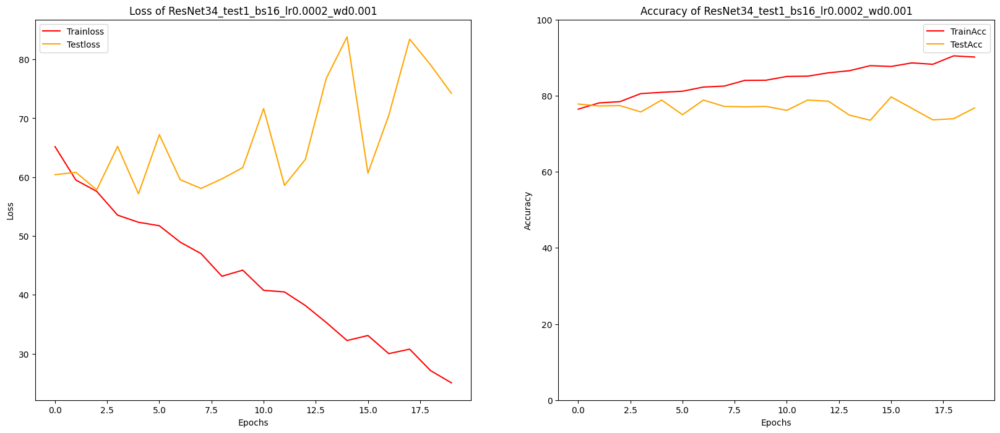

ResNet34_test1_bs16_lr0.0002_wd0.0005
Epoch1:[2000/115200(2%)]
	 Train Loss:65.018433, Test Loss:60.027942, Train Acc:76.536%, Test Acc:78.125%
Epoch2:[5840/115200(5%)]
	 Train Loss:59.176660, Test Loss:60.524939, Train Acc:78.490%, Test Acc:76.979%
	 NOTICE: Early stopping counter 1 of 15
Epoch3:[9680/115200(8%)]
	 Train Loss:57.107186, Test Loss:56.972091, Train Acc:78.854%, Test Acc:77.917%
Epoch4:[13520/115200(12%)]
	 Train Loss:53.054097, Test Loss:64.151713, Train Acc:80.781%, Test Acc:76.354%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[17360/115200(15%)]
	 Train Loss:51.738761, Test Loss:56.381034, Train Acc:81.016%, Test Acc:78.750%
	 Weight Saved
Epoch6:[21200/115200(18%)]
	 Train Loss:51.180021, Test Loss:65.217952, Train Acc:81.172%, Test Acc:75.000%
	 NOTICE: Early stopping counter 1 of 15
Epoch7:[25040/115200(22%)]
	 Train Loss:48.230029, Test Loss:59.553186, Train Acc:82.266%, Test Acc:78.958%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 15
Epoch8:[28880/1152

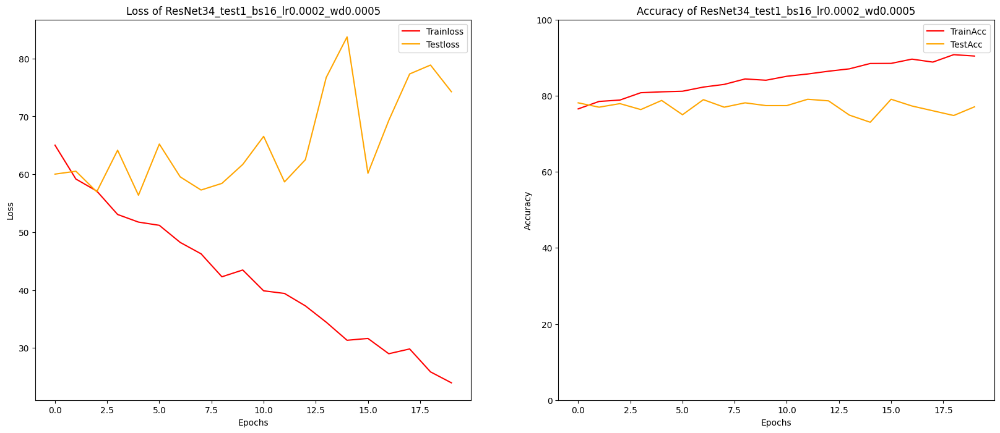

ResNet34_test1_bs16_lr0.0002_wd0.00025
Epoch1:[2000/115200(2%)]
	 Train Loss:64.937606, Test Loss:59.761353, Train Acc:76.562%, Test Acc:78.125%
Epoch2:[5840/115200(5%)]
	 Train Loss:59.007182, Test Loss:60.371045, Train Acc:78.646%, Test Acc:76.875%
	 NOTICE: Early stopping counter 1 of 15
Epoch3:[9680/115200(8%)]
	 Train Loss:56.876534, Test Loss:56.326624, Train Acc:78.854%, Test Acc:77.917%
Epoch4:[13520/115200(12%)]
	 Train Loss:52.846387, Test Loss:63.120500, Train Acc:80.885%, Test Acc:77.396%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[17360/115200(15%)]
	 Train Loss:51.467362, Test Loss:55.960095, Train Acc:81.068%, Test Acc:78.333%
	 Weight Saved
Epoch6:[21200/115200(18%)]
	 Train Loss:50.897579, Test Loss:64.443351, Train Acc:81.224%, Test Acc:75.312%
	 NOTICE: Early stopping counter 1 of 15
Epoch7:[25040/115200(22%)]
	 Train Loss:47.928560, Test Loss:58.841239, Train Acc:82.500%, Test Acc:78.229%
	 NOTICE: Early stopping counter 2 of 15
Epoch8:[28880/115200(25%)]
	 Tra

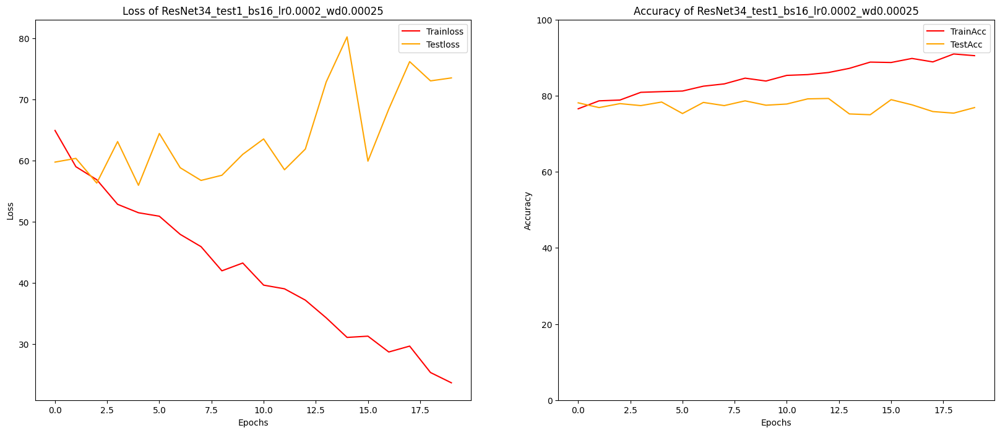

ResNet34_test1_bs16_lr0.0002_wd0.0002
Epoch1:[2000/115200(2%)]
	 Train Loss:64.914994, Test Loss:59.695943, Train Acc:76.589%, Test Acc:78.125%
Epoch2:[5840/115200(5%)]
	 Train Loss:58.984847, Test Loss:60.403784, Train Acc:78.698%, Test Acc:76.771%
	 NOTICE: Early stopping counter 1 of 15
Epoch3:[9680/115200(8%)]
	 Train Loss:56.833000, Test Loss:56.197827, Train Acc:78.854%, Test Acc:78.125%
Epoch4:[13520/115200(12%)]
	 Train Loss:52.799601, Test Loss:63.250110, Train Acc:80.990%, Test Acc:77.604%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[17360/115200(15%)]
	 Train Loss:51.427714, Test Loss:55.881946, Train Acc:80.990%, Test Acc:78.438%
	 Weight Saved
Epoch6:[21200/115200(18%)]
	 Train Loss:50.852071, Test Loss:63.844999, Train Acc:81.354%, Test Acc:75.521%
	 NOTICE: Early stopping counter 1 of 15
Epoch7:[25040/115200(22%)]
	 Train Loss:47.879834, Test Loss:59.041101, Train Acc:82.318%, Test Acc:78.021%
	 NOTICE: Early stopping counter 2 of 15
Epoch8:[28880/115200(25%)]
	 Trai

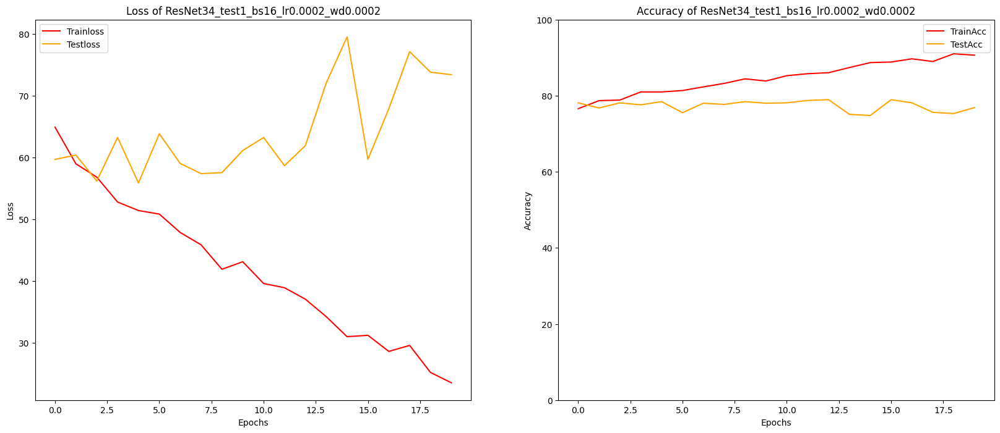

ResNet34_test1_bs16_lr0.0002_wd0.0001
Epoch1:[2000/115200(2%)]
	 Train Loss:64.873206, Test Loss:59.480806, Train Acc:76.615%, Test Acc:78.333%
Epoch2:[5840/115200(5%)]
	 Train Loss:58.908846, Test Loss:60.201766, Train Acc:78.776%, Test Acc:76.771%
	 NOTICE: Early stopping counter 1 of 15
Epoch3:[9680/115200(8%)]
	 Train Loss:56.733748, Test Loss:55.931506, Train Acc:78.932%, Test Acc:77.917%
Epoch4:[13520/115200(12%)]
	 Train Loss:52.745841, Test Loss:62.465393, Train Acc:80.964%, Test Acc:77.812%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[17360/115200(15%)]
	 Train Loss:51.345789, Test Loss:55.705705, Train Acc:81.068%, Test Acc:78.125%
Epoch6:[21200/115200(18%)]
	 Train Loss:50.794486, Test Loss:63.418038, Train Acc:81.354%, Test Acc:75.833%
	 NOTICE: Early stopping counter 1 of 15
Epoch7:[25040/115200(22%)]
	 Train Loss:47.813708, Test Loss:58.636902, Train Acc:82.500%, Test Acc:78.125%
	 NOTICE: Early stopping counter 2 of 15
Epoch8:[28880/115200(25%)]
	 Train Loss:45.79147

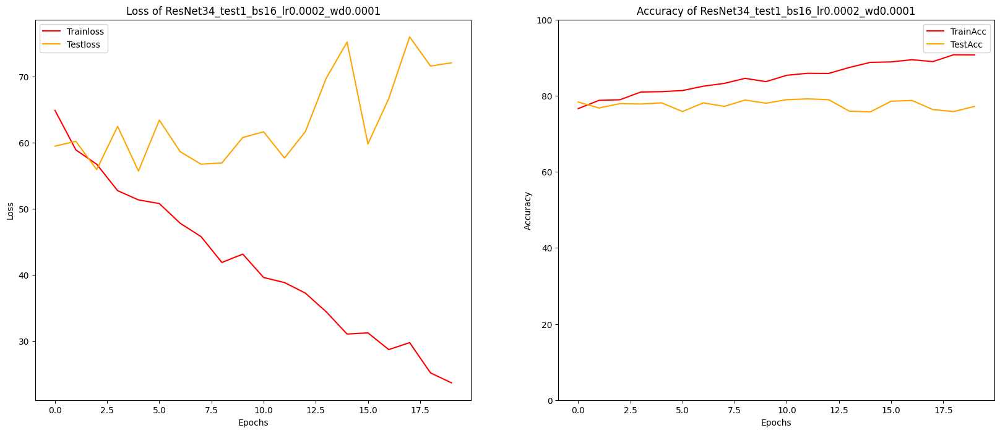

ResNet34_test1_bs16_lr0.0002_wd5e-05
Epoch1:[2000/115200(2%)]
	 Train Loss:64.844600, Test Loss:59.406852, Train Acc:76.615%, Test Acc:78.021%
Epoch2:[5840/115200(5%)]
	 Train Loss:58.880680, Test Loss:60.545719, Train Acc:78.854%, Test Acc:76.667%
	 NOTICE: Early stopping counter 1 of 15
Epoch3:[9680/115200(8%)]
	 Train Loss:56.691500, Test Loss:55.846895, Train Acc:78.984%, Test Acc:78.125%
	 Weight Saved
Epoch4:[13520/115200(12%)]
	 Train Loss:52.721240, Test Loss:62.578158, Train Acc:80.859%, Test Acc:77.812%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[17360/115200(15%)]
	 Train Loss:51.325456, Test Loss:55.710994, Train Acc:81.094%, Test Acc:78.333%
	 Weight Saved
Epoch6:[21200/115200(18%)]
	 Train Loss:50.777246, Test Loss:63.041768, Train Acc:81.354%, Test Acc:75.729%
	 NOTICE: Early stopping counter 1 of 15
Epoch7:[25040/115200(22%)]
	 Train Loss:47.799211, Test Loss:58.276750, Train Acc:82.630%, Test Acc:78.438%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 15
Epoc

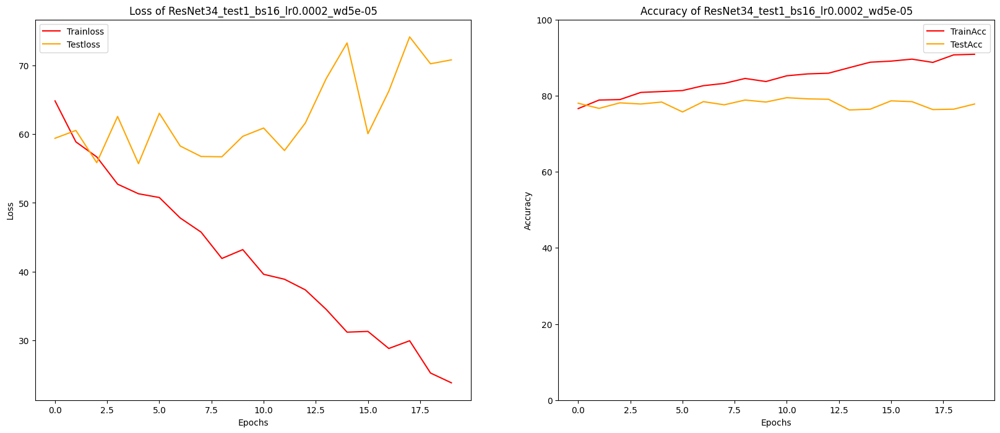

In [86]:
# 調小學習率, testloss都呈現上升趨勢, 模型已偏向過擬合
# 選擇train/test疊代都較平穩的 lr=0.0002, 加上weight_decay來改善過擬合
# 以已訓練10個Epochs的權重檔案為基礎, 調整wd再訓練30個Epochs
for wd in [0.001, 0.0005, 0.00025, 0.0002, 0.0001, 0.00005]:
    epochs = 30
    bs = 16
    lr = 0.0002
    PATH = r"D:\TGI102_AI_BootCamp\AIA_Interview\weights"
    modelname = "ResNet34_test1_bs16_lr0.0002_wd{}".format(wd)
    firsttitle = "Loss of " + modelname
    secondtitle = "Accuracy of " + modelname

    print(modelname)
    torch.manual_seed(1412)
    net = m.resnet34()
    net.fc = torch.nn.Linear(512, 6, bias=True)
    net = net.to(device,non_blocking=True)
    net.load_state_dict(torch.load(r"D:\TGI102_AI_BootCamp\AIA_Interview\weights\ResNet34_test0_bs16.pt"))
    
    start = time()
    trainloss, testloss, trainacc, testacc = full_procedure(net,epochs=epochs, bs=bs
                                             ,modelname=modelname
                                             ,PATH = PATH
                                             ,lr=lr
                                             ,wd=wd
                                             ,tol = 10**(-10)
                                             ,patience=15)

    print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
    print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
    print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
    print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
    total_time = time()-start
    print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
    plotgraph(trainloss, testloss, trainacc, testacc, epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle)

**ResNet34_test1_bs16_lr0.0002_wd0.001** <br>
Total trained epochs: 30 <br>
Max trainacc: 90.469% 	Epoch: 19 <br>
Max testacc: 79.688% 	Epoch: 16 <br>
Mean trainacc: 84.216% <br>
Mean testacc: 76.755% <br>
Running time: 12.0 minutes, 28 seconds. <br>
<br>
不論使用哪一個Wd，testloss仍持續上升，顯然調整Wd沒有太大幫助。 <br>
試試看dropout。

#### 重新訓練一個加入dropout層的網路

ResNet34_test1_bs16_lr0.001_dp0
Epoch1:[2000/38400(5%)]
	 Train Loss:179.946875, Test Loss:240.782064, Train Acc:27.995%, Test Acc:18.750%
Epoch2:[5840/38400(15%)]
	 Train Loss:158.244775, Test Loss:145.924398, Train Acc:34.922%, Test Acc:43.333%
	 Weight Saved
Epoch3:[9680/38400(25%)]
	 Train Loss:151.842415, Test Loss:133.451400, Train Acc:38.802%, Test Acc:49.583%
	 Weight Saved
Epoch4:[13520/38400(35%)]
	 Train Loss:140.951449, Test Loss:255.791195, Train Acc:43.568%, Test Acc:26.771%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[17360/38400(45%)]
	 Train Loss:134.533789, Test Loss:141.736540, Train Acc:46.875%, Test Acc:45.625%
	 NOTICE: Early stopping counter 2 of 15
Epoch6:[21200/38400(55%)]
	 Train Loss:123.579899, Test Loss:122.619491, Train Acc:51.927%, Test Acc:48.750%
Epoch7:[25040/38400(65%)]
	 Train Loss:116.338680, Test Loss:107.524919, Train Acc:54.714%, Test Acc:57.292%
	 Weight Saved
Epoch8:[28880/38400(75%)]
	 Train Loss:107.352425, Test Loss:103.486613, Train Acc

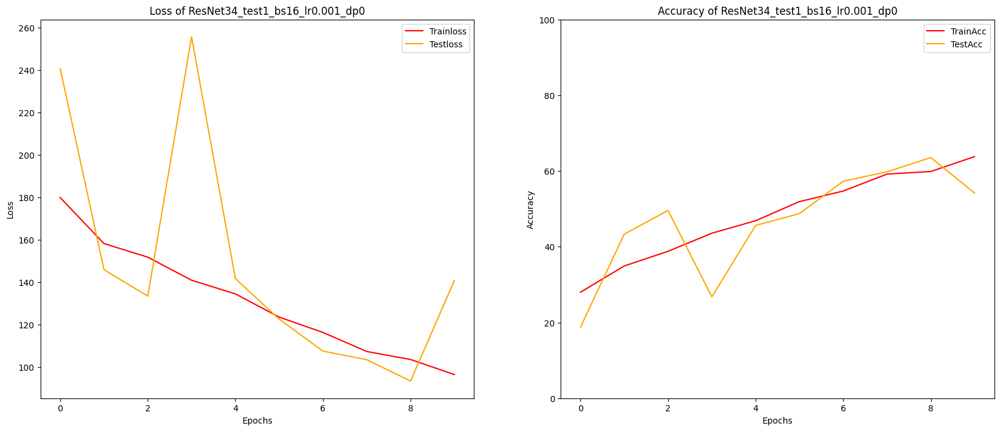

In [26]:
trained_epochs = 0
epochs = 10
bs = 16
lr = 0.001
optimizer="RMSprop"
PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/weights"
fig_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/CurveImages"
csv_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/csv/model_data_csv"
modelname = "ResNet34_test1_bs16_lr0.001_dp0"
firsttitle = "Loss of " + modelname
secondtitle = "Accuracy of " + modelname

print(modelname)
torch.manual_seed(1412)
net = m.resnet34()
net.fc = torch.nn.Sequential(nn.Dropout(p=0),
                             nn.Linear(512, 6, bias=True))
net = net.to(device,non_blocking=True)
    
    
start = time()
trainloss, testloss, trainacc, testacc = full_procedure(net,epochs=epochs, bs=bs
                                             ,modelname=modelname
                                             ,PATH = PATH
                                             ,lr=lr
                                             ,tol = 10**(-10)
                                             ,patience=15)

print(modelname)
print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
total_time = time()-start
print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
save_data_csv(save_PATH=csv_PATH, filename=modelname, modelname=modelname, trainloss=trainloss, testloss=testloss, 
              trainacc=trainacc, testacc=testacc, total_time=total_time, trained_epochs=trained_epochs)
plotgraph(trainloss, testloss, trainacc, testacc, 
          epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle, save=True, PATH=fig_PATH, filename=modelname)

ResNet34_test1_bs16_lr0.0002_dp0.1
Epoch1:[2000/115200(2%)]
	 Train Loss:87.834627, Test Loss:66.374023, Train Acc:67.161%, Test Acc:75.938%
Epoch2:[5840/115200(5%)]
	 Train Loss:82.028011, Test Loss:65.213489, Train Acc:69.375%, Test Acc:75.729%
Epoch3:[9680/115200(8%)]
	 Train Loss:79.761719, Test Loss:64.649068, Train Acc:69.896%, Test Acc:75.729%
Epoch4:[13520/115200(12%)]
	 Train Loss:75.845264, Test Loss:62.454989, Train Acc:72.109%, Test Acc:76.875%
	 Weight Saved
Epoch5:[17360/115200(15%)]
	 Train Loss:76.010514, Test Loss:62.688013, Train Acc:71.979%, Test Acc:76.875%
	 NOTICE: Early stopping counter 1 of 20
Epoch6:[21200/115200(18%)]
	 Train Loss:75.132617, Test Loss:59.545732, Train Acc:71.302%, Test Acc:77.917%
	 Weight Saved
Epoch7:[25040/115200(22%)]
	 Train Loss:74.585352, Test Loss:66.040751, Train Acc:72.578%, Test Acc:75.208%
	 NOTICE: Early stopping counter 1 of 20
Epoch8:[28880/115200(25%)]
	 Train Loss:73.031315, Test Loss:61.861230, Train Acc:72.630%, Test Acc:77.

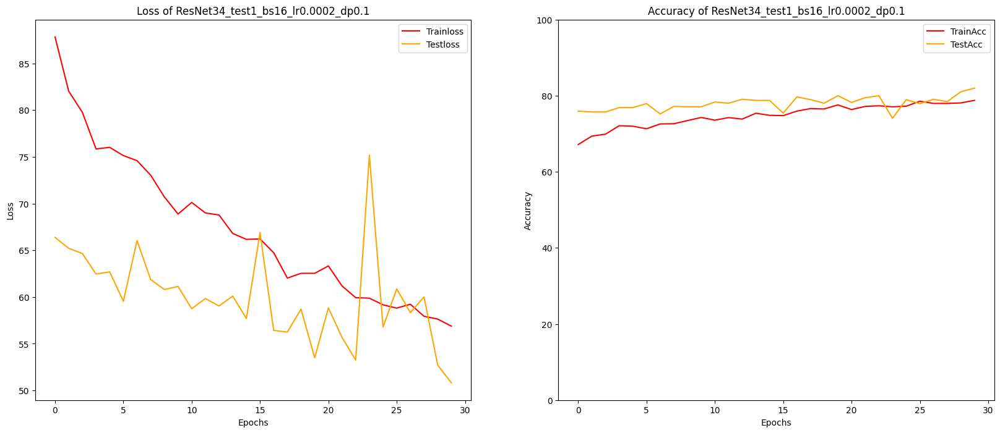

ResNet34_test1_bs16_lr0.0002_dp0.2
Epoch1:[2000/115200(2%)]
	 Train Loss:86.655168, Test Loss:65.512423, Train Acc:67.396%, Test Acc:75.521%
Epoch2:[5840/115200(5%)]
	 Train Loss:80.253597, Test Loss:63.665299, Train Acc:69.844%, Test Acc:76.979%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:78.857129, Test Loss:69.769482, Train Acc:70.833%, Test Acc:74.792%
	 NOTICE: Early stopping counter 1 of 20
Epoch4:[13520/115200(12%)]
	 Train Loss:79.357080, Test Loss:61.210986, Train Acc:70.339%, Test Acc:77.188%
	 Weight Saved
Epoch5:[17360/115200(15%)]
	 Train Loss:77.175423, Test Loss:64.921798, Train Acc:71.120%, Test Acc:75.521%
	 NOTICE: Early stopping counter 1 of 20
Epoch6:[21200/115200(18%)]
	 Train Loss:75.136279, Test Loss:61.425484, Train Acc:72.292%, Test Acc:77.500%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 20
Epoch7:[25040/115200(22%)]
	 Train Loss:74.637858, Test Loss:61.977266, Train Acc:72.161%, Test Acc:77.188%
	 NOTICE: Early stopping counter 3 of 20
Epoch8

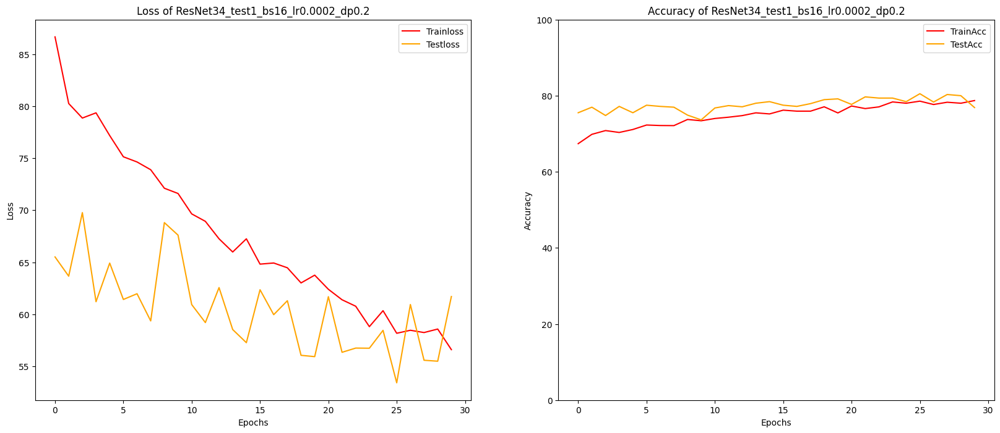

ResNet34_test1_bs16_lr0.0002_dp0.3
Epoch1:[2000/115200(2%)]
	 Train Loss:87.993237, Test Loss:68.166528, Train Acc:66.797%, Test Acc:75.417%
Epoch2:[5840/115200(5%)]
	 Train Loss:81.681592, Test Loss:64.285852, Train Acc:69.766%, Test Acc:76.146%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:78.776701, Test Loss:61.502767, Train Acc:70.625%, Test Acc:77.604%
	 Weight Saved
Epoch4:[13520/115200(12%)]
	 Train Loss:78.508765, Test Loss:61.631885, Train Acc:70.703%, Test Acc:77.396%
	 NOTICE: Early stopping counter 1 of 20
Epoch5:[17360/115200(15%)]
	 Train Loss:77.082471, Test Loss:63.668001, Train Acc:71.354%, Test Acc:75.833%
	 NOTICE: Early stopping counter 2 of 20
Epoch6:[21200/115200(18%)]
	 Train Loss:75.765747, Test Loss:62.360331, Train Acc:72.188%, Test Acc:76.667%
	 NOTICE: Early stopping counter 3 of 20
Epoch7:[25040/115200(22%)]
	 Train Loss:74.604305, Test Loss:62.577173, Train Acc:72.188%, Test Acc:76.771%
	 NOTICE: Early stopping counter 4 of 20
Epoch8:[28880/115200(

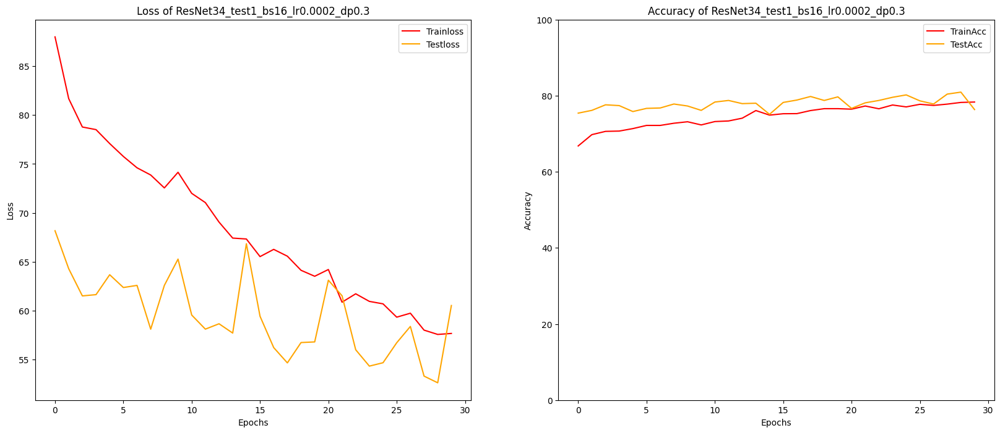

ResNet34_test1_bs16_lr0.0002_dp0.4
Epoch1:[2000/115200(2%)]
	 Train Loss:89.821411, Test Loss:67.494385, Train Acc:66.536%, Test Acc:75.729%
Epoch2:[5840/115200(5%)]
	 Train Loss:83.655005, Test Loss:63.156287, Train Acc:68.594%, Test Acc:76.979%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:79.572062, Test Loss:62.154260, Train Acc:70.182%, Test Acc:76.562%
Epoch4:[13520/115200(12%)]
	 Train Loss:79.312459, Test Loss:69.391593, Train Acc:70.182%, Test Acc:73.021%
	 NOTICE: Early stopping counter 1 of 20
Epoch5:[17360/115200(15%)]
	 Train Loss:77.078760, Test Loss:60.460722, Train Acc:71.250%, Test Acc:77.396%
	 Weight Saved
Epoch6:[21200/115200(18%)]
	 Train Loss:74.359985, Test Loss:58.866500, Train Acc:72.240%, Test Acc:77.812%
	 Weight Saved
Epoch7:[25040/115200(22%)]
	 Train Loss:76.406624, Test Loss:62.896301, Train Acc:71.120%, Test Acc:77.604%
	 NOTICE: Early stopping counter 1 of 20
Epoch8:[28880/115200(25%)]
	 Train Loss:75.533333, Test Loss:63.271358, Train Acc:72.734

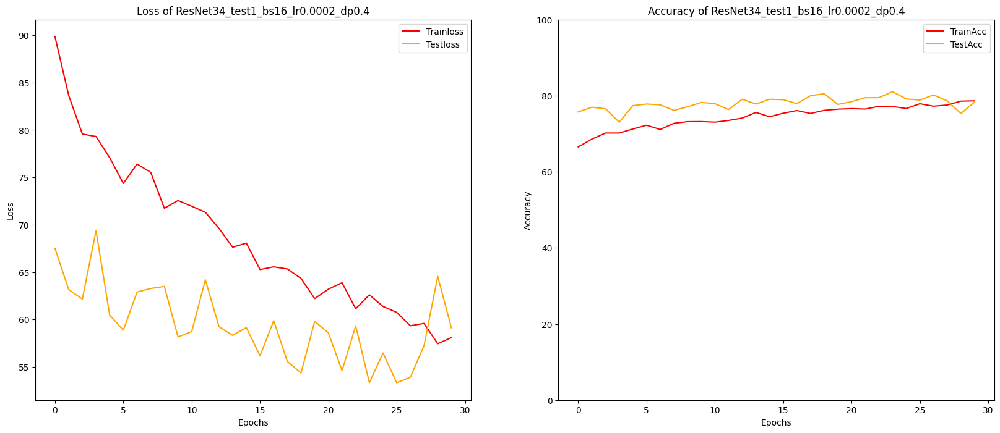

ResNet34_test1_bs16_lr0.0002_dp0.5
Epoch1:[2000/115200(2%)]
	 Train Loss:90.700106, Test Loss:65.513826, Train Acc:65.547%, Test Acc:77.083%
Epoch2:[5840/115200(5%)]
	 Train Loss:85.674520, Test Loss:65.582072, Train Acc:68.776%, Test Acc:77.083%
	 NOTICE: Early stopping counter 1 of 20
Epoch3:[9680/115200(8%)]
	 Train Loss:84.769808, Test Loss:61.848055, Train Acc:68.438%, Test Acc:77.188%
	 Weight Saved
Epoch4:[13520/115200(12%)]
	 Train Loss:80.425537, Test Loss:61.611466, Train Acc:70.208%, Test Acc:77.500%
	 Weight Saved
Epoch5:[17360/115200(15%)]
	 Train Loss:79.427205, Test Loss:62.080497, Train Acc:70.469%, Test Acc:77.292%
	 NOTICE: Early stopping counter 1 of 20
Epoch6:[21200/115200(18%)]
	 Train Loss:76.337061, Test Loss:60.905404, Train Acc:72.083%, Test Acc:77.396%
Epoch7:[25040/115200(22%)]
	 Train Loss:77.110693, Test Loss:61.215527, Train Acc:71.120%, Test Acc:78.021%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
Epoch8:[28880/115200(25%)]
	 Train Loss:74.9823

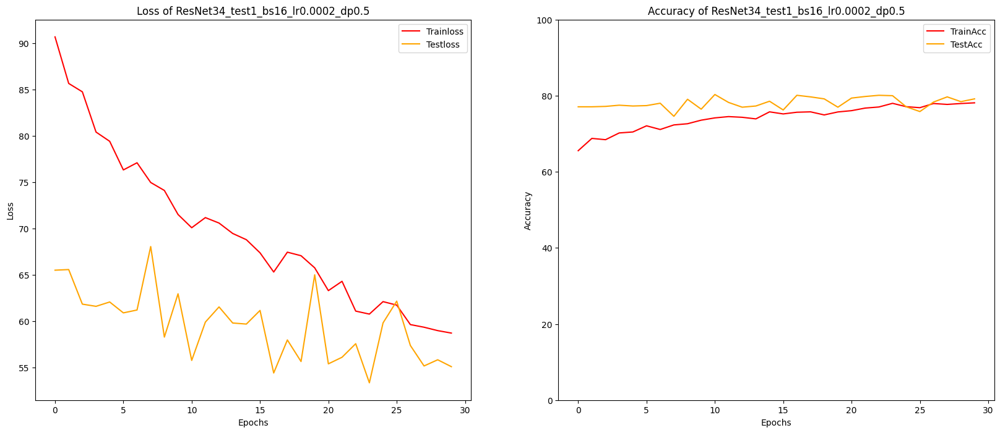

In [25]:
# 選擇train/test疊代都較平穩的 lr=0.0002, 加上dropout來改善過擬合
# 以已訓練10個Epochs的權重檔案為基礎, 加上dropout再訓練30個Epochs
for dp in [0.1, 0.2, 0.3, 0.4, 0.5]:
    trained_epochs = 10
    epochs = 30
    bs = 16
    lr = 0.0002
    optimizer="RMSprop"
    PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/weights"
    fig_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/CurveImages"
    csv_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/csv/model_data_csv"
    modelname = "ResNet34_test1_bs16_lr0.0002_dp{}".format(dp)
    firsttitle = "Loss of " + modelname
    secondtitle = "Accuracy of " + modelname

    print(modelname)
    torch.manual_seed(1412)
    net = m.resnet34()
    net.fc = torch.nn.Sequential(nn.Dropout(p=dp),
                                 nn.Linear(512, 6, bias=True))
    net = net.to(device,non_blocking=True)
    net.load_state_dict(torch.load(os.path.join(PATH, "ResNet34_test1_bs16_lr0.001_dp0.pt")))
    
    start = time()
    trainloss, testloss, trainacc, testacc = full_procedure(net,epochs=epochs, bs=bs
                                             ,modelname=modelname
                                             ,PATH = PATH
                                             ,lr=lr
                                             ,tol = 10**(-10)
                                             ,patience=20)

    print(modelname)
    print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
    print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
    print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
    print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
    print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
    total_time = time()-start
    print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
    save_data_csv(save_PATH=csv_PATH, filename=modelname, modelname=modelname, trainloss=trainloss, testloss=testloss, 
                  trainacc=trainacc, testacc=testacc, total_time=total_time, trained_epochs=trained_epochs)
    plotgraph(trainloss, testloss, trainacc, testacc, 
              epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle, save=True, PATH=fig_PATH, filename=modelname)

加入dropout層後，訓練時間增加，trainacc上升緩慢。 <br>
不論是哪一個dropout機率，trainloss/testloss的走向都持續下降，但變化很小且不穩定。 <br>
dropout機率越大，testloss下降走勢越平緩。 <br>
選擇dropout=0.1，加大lr來提升收斂速度，訓練更多個epoch看testloss會不會持續下降。

ResNet34_test2_bs16_lr0.001_dp0.1
Epoch1:[2000/115200(2%)]
	 Train Loss:116.151099, Test Loss:106.235156, Train Acc:55.495%, Test Acc:60.312%
Epoch2:[5840/115200(5%)]
	 Train Loss:83.149780, Test Loss:78.762630, Train Acc:69.036%, Test Acc:68.958%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:78.636092, Test Loss:99.680884, Train Acc:70.208%, Test Acc:65.833%
	 NOTICE: Early stopping counter 1 of 30
Epoch4:[13520/115200(12%)]
	 Train Loss:78.260433, Test Loss:78.752816, Train Acc:70.911%, Test Acc:71.146%
	 Weight Saved
Epoch5:[17360/115200(15%)]
	 Train Loss:72.532536, Test Loss:70.498991, Train Acc:73.802%, Test Acc:74.167%
	 Weight Saved
Epoch6:[21200/115200(18%)]
	 Train Loss:74.810295, Test Loss:82.665275, Train Acc:72.318%, Test Acc:69.583%
	 NOTICE: Early stopping counter 1 of 30
Epoch7:[25040/115200(22%)]
	 Train Loss:72.222827, Test Loss:60.939172, Train Acc:72.083%, Test Acc:78.438%
	 Weight Saved
Epoch8:[28880/115200(25%)]
	 Train Loss:69.983577, Test Loss:109.874601,

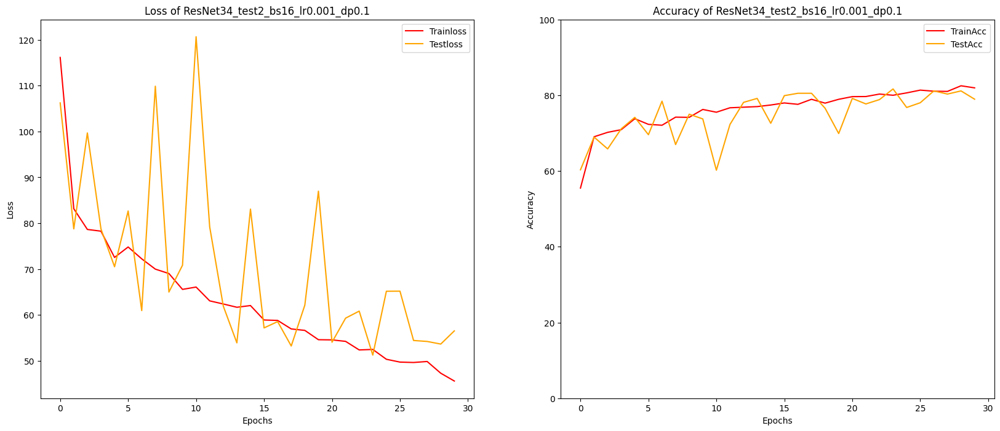

In [27]:
# 以已訓練40個Epochs的權重檔案為基礎, dropout=0.1, lr=0.001再訓練30個Epochs
trained_epochs = 40
epochs = 30
bs = 16
lr = 0.001
optimizer="RMSprop"
PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/weights"
fig_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/CurveImages"
csv_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/csv/model_data_csv"
modelname = "ResNet34_test2_bs16_lr0.001_dp0.1"
firsttitle = "Loss of " + modelname
secondtitle = "Accuracy of " + modelname

print(modelname)
torch.manual_seed(1412)
net = m.resnet34()
net.fc = torch.nn.Sequential(nn.Dropout(p=0.1),
                             nn.Linear(512, 6, bias=True))
net = net.to(device,non_blocking=True)
net.load_state_dict(torch.load(os.path.join(PATH, "ResNet34_test1_bs16_lr0.0002_dp0.1.pt")))
    
start = time()
trainloss, testloss, trainacc, testacc = full_procedure(net,epochs=epochs, bs=bs
                                             ,modelname=modelname
                                             ,PATH = PATH
                                             ,lr=lr
                                             ,tol = 10**(-10)
                                             ,patience=30)

print(modelname)
print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
total_time = time()-start
print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
save_data_csv(save_PATH=csv_PATH, filename=modelname, modelname=modelname, trainloss=trainloss, testloss=testloss, 
              trainacc=trainacc, testacc=testacc, total_time=total_time, trained_epochs=trained_epochs)
plotgraph(trainloss, testloss, trainacc, testacc, 
          epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle, save=True, PATH=fig_PATH, filename=modelname)

調大lr讓testloss變化更不平穩，但從趨勢來看testloss仍持續下降，嘗試再疊代更多個epoch觀察。

ResNet34_test3_bs16_lr0.005_dp0.1
Epoch1:[2000/115200(2%)]
	 Train Loss:183.159749, Test Loss:171.481038, Train Acc:24.297%, Test Acc:20.729%
Epoch2:[5840/115200(5%)]
	 Train Loss:154.738265, Test Loss:142.355990, Train Acc:36.745%, Test Acc:41.771%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:143.922493, Test Loss:146.631738, Train Acc:42.969%, Test Acc:46.875%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 30
Epoch4:[13520/115200(12%)]
	 Train Loss:132.638688, Test Loss:140.034961, Train Acc:47.552%, Test Acc:46.667%
Epoch5:[17360/115200(15%)]
	 Train Loss:117.160832, Test Loss:158.726416, Train Acc:54.583%, Test Acc:48.125%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 30
Epoch6:[21200/115200(18%)]
	 Train Loss:103.303825, Test Loss:99.230151, Train Acc:59.766%, Test Acc:62.812%
	 Weight Saved
Epoch7:[25040/115200(22%)]
	 Train Loss:93.670288, Test Loss:80.335547, Train Acc:64.479%, Test Acc:70.208%
	 Weight Saved
Epoch8:[28880/115200(25%)]
	 Train Loss:89.42248

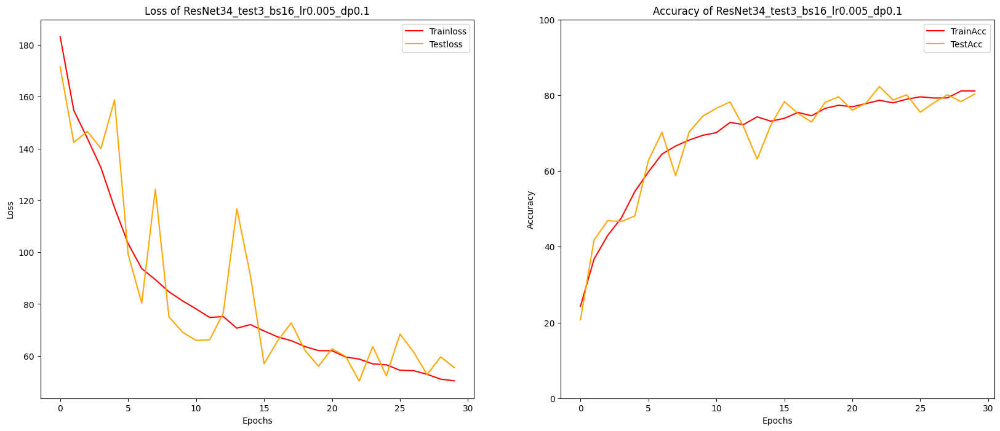

In [36]:
# 以已訓練40個Epochs的權重檔案為基礎, dropout=0.1, lr=0.005再訓練30個Epochs
trained_epochs = 70
epochs = 30
bs = 16
lr = 0.005
optimizer="RMSprop"
PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/weights"
fig_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/CurveImages"
csv_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/csv/model_data_csv"
modelname = "ResNet34_test3_bs16_lr0.005_dp0.1"
firsttitle = "Loss of " + modelname
secondtitle = "Accuracy of " + modelname

print(modelname)
torch.manual_seed(1412)
net = m.resnet34()
net.fc = torch.nn.Sequential(nn.Dropout(p=0.1),
                             nn.Linear(512, 6, bias=True))
net = net.to(device,non_blocking=True)
net.load_state_dict(torch.load(os.path.join(PATH, "ResNet34_test2_bs16_lr0.001_dp0.1.pt")))
    
start = time()
trainloss, testloss, trainacc, testacc = full_procedure(net,epochs=epochs, bs=bs
                                             ,modelname=modelname
                                             ,PATH = PATH
                                             ,lr=lr
                                             ,tol = 10**(-10)
                                             ,patience=30)

print(modelname)
print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
total_time = time()-start
print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
save_data_csv(save_PATH=csv_PATH, filename=modelname, modelname=modelname, trainloss=trainloss, testloss=testloss, 
              trainacc=trainacc, testacc=testacc, total_time=total_time, trained_epochs=trained_epochs)
plotgraph(trainloss, testloss, trainacc, testacc, 
          epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle, save=True, PATH=fig_PATH, filename=modelname)

**ResNet34_test1_bs16_lr0.0002** <br>
Total trained epochs: 30 <br>
Max trainacc: 90.677% Epoch: 20 <br>
Max testacc: **79.688%** Epoch: 11 <br>
Mean trainacc: 84.607% <br>
Mean testacc: 77.802% <br>
Running time: 12.0 minutes, 26 seconds. <br>
<br>
**ResNet34_test1_bs16_lr0.0002_dp0.1** <br>
Total trained epochs: 40 <br>
Max trainacc: 78.776% 	Epoch: 30 <br>
Max testacc: **81.979%** 	Epoch: 30 <br>
Mean trainacc: 74.821% <br>
Mean testacc: 77.993% <br>
Running time: 21.0 minutes, 26 seconds. <br>
<br>
**ResNet34_test3_bs16_lr0.005_dp0.1** <br>
Total trained epochs: 100 <br>
Max trainacc: 81.146% 	Epoch: 29 <br>
Max testacc: **82.292%** 	Epoch: 23 <br>
Mean trainacc: 68.864% <br>
Mean testacc: 69.132% <br>
Running time: 21.0 minutes, 17 seconds. <br>

加入dropout層確實提升了testacc的表現，但再訓練到90個epochs後testloss變化看起來趨近平穩。

Summary: 
1. 在訓練30個epochs後，trainloss穩定下降，testloss逐漸上升，模型走向過擬合。
2. 調整初始lr=0.00005，Max testacc 最高為80.208%，EarlyStop觸發超過10次，顯然testloss無法持續下降。
2. 調小初始lr讓testloss變化較穩定，但走勢仍是逐漸上升；調大lr也無法協助找到更好的minima。
3. 使用weight_decay無法有效抑制過擬合。
4. 加入Dropout層後再疊代更多個epoch能將testacc提升至82.292%
5. 其他較小模型的testacc更低，AlexNet訓練將近100個epochs，testacc仍在60%左右徘徊，CustomResnet的testacc在70-75%徘徊（波動很大），ResNet18的testacc在73-75%徘徊。

下一步：
1. 加深模型，或換個更大的模型架構試試看。
2. 改用pretrained weights（用別人訓練好的初始權重）試試看。

-------------------------------------

#### Resnet34(With pretrained weights)
使用pre-trained weights, 搭配不同batch size, 訓練20個epochs

ResNet34_pretrained_test0_bs8


C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to C:\Users\USER/.cache\torch\hub\checkpoints\resnet34-b627a593.pth
100.0%


Epoch1:[1000/76800(1%)]
Epoch1:[2000/76800(3%)]
Epoch1:[3000/76800(4%)]
	 Train Loss:184.447493, Test Loss:661.437760, Train Acc:20.885%, Test Acc:24.167%
Epoch2:[4840/76800(6%)]
Epoch2:[5840/76800(8%)]
Epoch2:[6840/76800(9%)]
	 Train Loss:158.560303, Test Loss:184.654867, Train Acc:33.854%, Test Acc:29.062%
	 Weight Saved
Epoch3:[8680/76800(11%)]
Epoch3:[9680/76800(13%)]
Epoch3:[10680/76800(14%)]
	 Train Loss:138.391553, Test Loss:111.769767, Train Acc:44.375%, Test Acc:59.062%
	 Weight Saved
Epoch4:[12520/76800(16%)]
Epoch4:[13520/76800(18%)]
Epoch4:[14520/76800(19%)]
	 Train Loss:110.699821, Test Loss:125.883545, Train Acc:58.099%, Test Acc:52.188%
	 NOTICE: Early stopping counter 1 of 10
Epoch5:[16360/76800(21%)]
Epoch5:[17360/76800(23%)]
Epoch5:[18360/76800(24%)]
	 Train Loss:99.164681, Test Loss:102.270443, Train Acc:62.422%, Test Acc:62.396%
	 Weight Saved
Epoch6:[20200/76800(26%)]
Epoch6:[21200/76800(28%)]
Epoch6:[22200/76800(29%)]
	 Train Loss:89.889282, Test Loss:110.979614, 

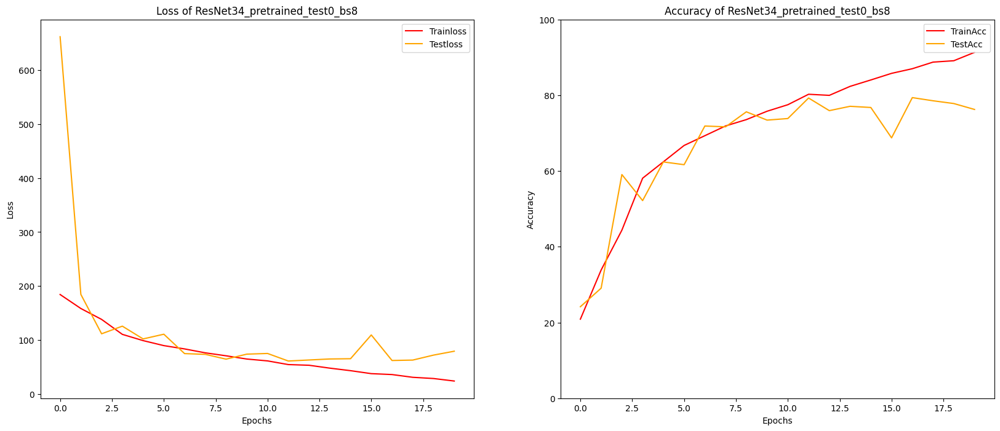

ResNet34_pretrained_test0_bs16
Epoch1:[2000/76800(3%)]
	 Train Loss:177.759229, Test Loss:271.090120, Train Acc:27.656%, Test Acc:32.083%
Epoch2:[5840/76800(8%)]
	 Train Loss:133.192749, Test Loss:252.477897, Train Acc:48.516%, Test Acc:38.333%
	 Weight Saved
Epoch3:[9680/76800(13%)]
	 Train Loss:108.435352, Test Loss:146.499593, Train Acc:59.141%, Test Acc:42.500%
	 Weight Saved
Epoch4:[13520/76800(18%)]
	 Train Loss:89.957113, Test Loss:111.310441, Train Acc:66.797%, Test Acc:66.042%
	 Weight Saved
Epoch5:[17360/76800(23%)]
	 Train Loss:82.737557, Test Loss:95.516919, Train Acc:69.766%, Test Acc:65.312%
Epoch6:[21200/76800(28%)]
	 Train Loss:75.485807, Test Loss:116.560872, Train Acc:72.474%, Test Acc:63.438%
	 NOTICE: Early stopping counter 1 of 10
Epoch7:[25040/76800(33%)]
	 Train Loss:70.058366, Test Loss:107.998608, Train Acc:74.245%, Test Acc:60.833%
	 NOTICE: Early stopping counter 2 of 10
Epoch8:[28880/76800(38%)]
	 Train Loss:66.602572, Test Loss:76.239461, Train Acc:75.339%,

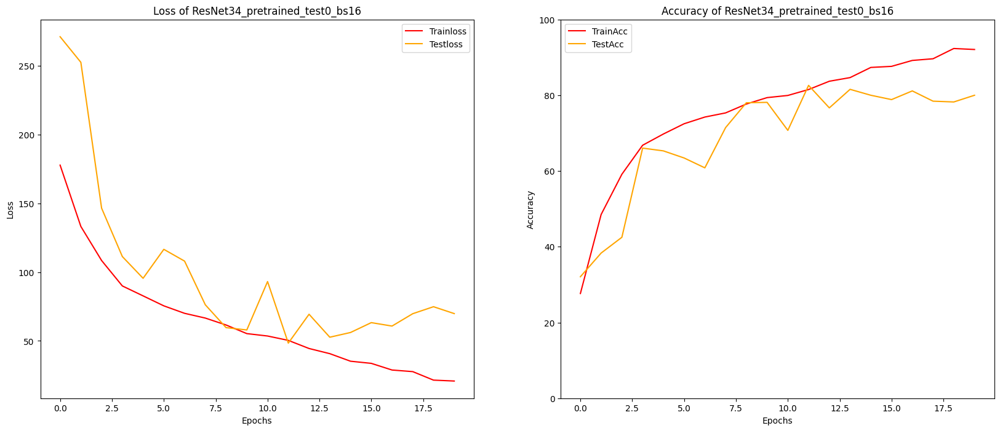

ResNet34_pretrained_test0_bs32
	 Train Loss:184.194596, Test Loss:145.307617, Train Acc:23.958%, Test Acc:36.979%
	 Train Loss:138.114111, Test Loss:155.719189, Train Acc:45.391%, Test Acc:38.229%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 10
	 Train Loss:110.925195, Test Loss:128.786694, Train Acc:57.448%, Test Acc:56.146%
	 Weight Saved
	 Train Loss:87.918148, Test Loss:70.785303, Train Acc:67.422%, Test Acc:74.896%
	 Weight Saved
	 Train Loss:78.231649, Test Loss:81.367350, Train Acc:71.615%, Test Acc:70.000%
	 NOTICE: Early stopping counter 1 of 10
	 Train Loss:71.201579, Test Loss:84.131453, Train Acc:74.115%, Test Acc:68.229%
	 NOTICE: Early stopping counter 2 of 10
	 Train Loss:66.087895, Test Loss:127.632218, Train Acc:75.521%, Test Acc:63.542%
	 NOTICE: Early stopping counter 3 of 10
	 Train Loss:60.471517, Test Loss:86.133000, Train Acc:77.812%, Test Acc:68.854%
	 NOTICE: Early stopping counter 4 of 10
	 Train Loss:57.041414, Test Loss:61.654313, Train Acc:79.089%, 

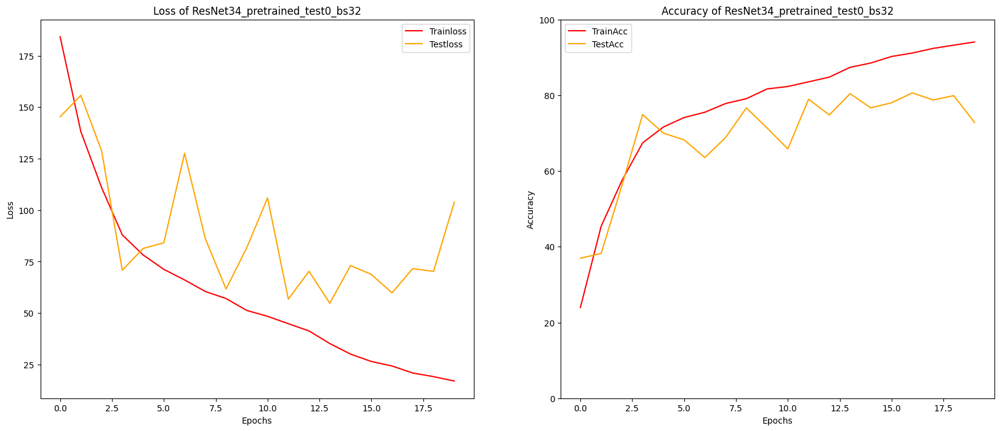

ResNet34_pretrained_test0_bs64
	 Train Loss:194.487240, Test Loss:229.548568, Train Acc:20.859%, Test Acc:25.104%
	 Train Loss:150.988574, Test Loss:228.193506, Train Acc:38.333%, Test Acc:25.208%
	 Weight Saved
	 Train Loss:127.746541, Test Loss:110.022974, Train Acc:50.156%, Test Acc:58.958%
	 Weight Saved
	 Train Loss:100.178857, Test Loss:97.152987, Train Acc:63.047%, Test Acc:62.708%
	 Weight Saved
	 Train Loss:81.965373, Test Loss:90.066715, Train Acc:70.234%, Test Acc:67.604%
	 Weight Saved
	 Train Loss:75.616504, Test Loss:90.926619, Train Acc:72.708%, Test Acc:67.292%
	 NOTICE: Early stopping counter 1 of 10
	 Train Loss:68.339551, Test Loss:91.028809, Train Acc:75.625%, Test Acc:67.917%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 10
	 Train Loss:63.289408, Test Loss:97.238379, Train Acc:76.354%, Test Acc:64.792%
	 NOTICE: Early stopping counter 3 of 10
	 Train Loss:59.905192, Test Loss:69.912541, Train Acc:78.073%, Test Acc:76.458%
	 Weight Saved
	 Train Loss:55.8274

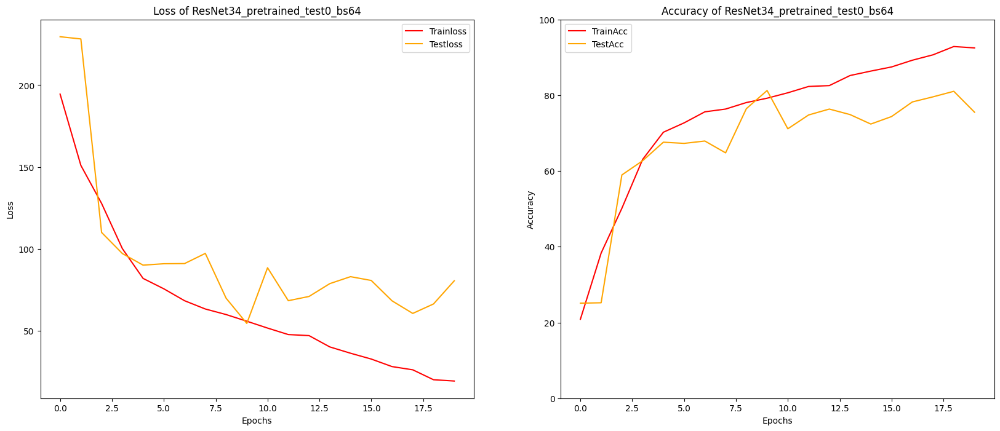

ResNet34_pretrained_test0_bs128
	 Train Loss:210.167464, Test Loss:251.788818, Train Acc:17.474%, Test Acc:17.917%
	 Train Loss:174.638118, Test Loss:175.359456, Train Acc:27.604%, Test Acc:29.583%
	 Weight Saved
	 Train Loss:148.963411, Test Loss:172.897786, Train Acc:40.365%, Test Acc:35.312%
	 Weight Saved
	 Train Loss:126.301611, Test Loss:125.946208, Train Acc:52.005%, Test Acc:51.354%
	 Weight Saved
	 Train Loss:98.794613, Test Loss:108.644727, Train Acc:63.021%, Test Acc:59.375%
	 Weight Saved
	 Train Loss:85.671468, Test Loss:151.541341, Train Acc:68.750%, Test Acc:48.646%
	 NOTICE: Early stopping counter 1 of 10
	 Train Loss:78.568148, Test Loss:91.289364, Train Acc:70.599%, Test Acc:67.500%
	 Weight Saved
	 Train Loss:70.781934, Test Loss:99.518604, Train Acc:74.427%, Test Acc:62.708%
	 NOTICE: Early stopping counter 1 of 10
	 Train Loss:64.096297, Test Loss:80.101652, Train Acc:75.833%, Test Acc:69.792%
	 Weight Saved
	 Train Loss:61.876831, Test Loss:78.580314, Train Acc:77

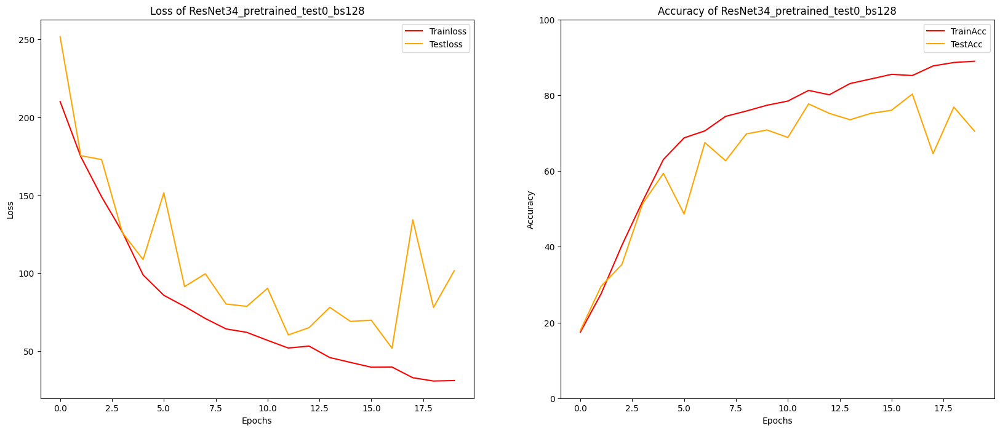

ResNet34_pretrained_test0_bs256


RuntimeError: CUDA out of memory. Tried to allocate 98.00 MiB (GPU 0; 6.00 GiB total capacity; 5.18 GiB already allocated; 0 bytes free; 5.31 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [87]:
# 使用pre-trained weights
# 使用不同batch_size, 先訓練20個epochs看看效果
# lr=0.001
for bs in [8, 16, 32, 64, 128, 256]:
    epochs = 20
    PATH = r"D:\TGI102_AI_BootCamp\AIA_Interview\weights"
    modelname = "ResNet34_pretrained_test0_bs{}".format(bs)
    firsttitle = "Loss of " + modelname
    secondtitle = "Accuracy of " + modelname

    print(modelname)
    torch.manual_seed(1412)
    net = m.resnet34(pretrained=True)
    net.fc = torch.nn.Linear(512, 6, bias=True)
    net = net.to(device,non_blocking=True)
    start = time()
    trainloss, testloss, trainacc, testacc = full_procedure(net, epochs=epochs, bs=bs
                                              ,modelname=modelname
                                              ,PATH=PATH
                                              ,optimizer="RMSprop"
                                              ,patience=10)
    
    print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
    print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
    print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
    print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
    total_time = time()-start
    print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
    plotgraph(trainloss, testloss, trainacc, testacc, epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle)

**ResNet34_split82_pretrained_test0_bs8** <br>
Total trained epochs: 20 <br>
Max trainacc: 91.328% 	Epoch: 20 <br>
Max testacc: 79.375% 	Epoch: 17 <br>
Mean trainacc: 71.152% <br>
Mean testacc: 67.240% <br>
Running time: 15.0 minutes, 6 seconds. <br>
<br>
**ResNet34_split82_pretrained_test0_bs16** <br>
Total trained epochs: 20 <br>
Max trainacc: 92.344% 	Epoch: 19 <br>
Max testacc: 82.604% 	Epoch: 12 <br>
Mean trainacc: 75.952% <br>
Mean testacc: 69.219% <br>
Running time: 12.0 minutes, 24 seconds. <br>
<br>
**ResNet34_split82_pretrained_test0_bs32** <br>
Total trained epochs: 20 <br>
Max trainacc: 94.062% 	Epoch: 20 <br>
Max testacc: 80.625% 	Epoch: 17 <br>
Mean trainacc: 77.081% <br>
Mean testacc: 69.583% <br>
Running time: 11.0 minutes, 22 seconds. <br>
<br>
**ResNet34_split82_pretrained_test0_bs64** <br>
Total trained epochs: 20 <br>
Max trainacc: 92.865% 	Epoch: 19 <br>
Max testacc: 81.250% 	Epoch: 10 <br>
Mean trainacc: 74.724% <br>
Mean testacc: 67.781% <br>
Running time: 11.0 minutes, 14 seconds. <br>
<br>
**ResNet34_split82_pretrained_test0_bs128** <br>
Total trained epochs: 20 <br>
Max trainacc: 88.984% 	Epoch: 20 <br>
Max testacc: 80.312% 	Epoch: 17 <br>
Mean trainacc: 70.540% <br>
Mean testacc: 62.594% <br>
Running time: 12.0 minutes, 6 seconds. <br>
<br>
**ResNet34_split82_pretrained_test0_bs256** <br>
Cuda out of memory. <br>
<br>
<br>
使用pre-trained weights，batchsize=16, 32在訓練20個epochs後，testacc都比未使用pre-trained weights訓練30個epochs高。<br>
testloss在15個epochs後都微微上升，調整batchsize和lr進行網格搜索試試看能不能找出最好的條件。

使用pre-trained weights, 搭配不同batch size和初始lr, 訓練20個epochs

ResNet34_pretrained_test0_bs8_lr0.005
Epoch1:[1000/76800(1%)]
Epoch1:[2000/76800(3%)]
Epoch1:[3000/76800(4%)]
	 Train Loss:185.308789, Test Loss:333.744141, Train Acc:24.323%, Test Acc:26.875%
Epoch2:[4840/76800(6%)]
Epoch2:[5840/76800(8%)]
Epoch2:[6840/76800(9%)]
	 Train Loss:156.319906, Test Loss:153.512109, Train Acc:33.906%, Test Acc:34.688%
	 Weight Saved
Epoch3:[8680/76800(11%)]
Epoch3:[9680/76800(13%)]
Epoch3:[10680/76800(14%)]
	 Train Loss:145.576497, Test Loss:140.601449, Train Acc:39.766%, Test Acc:44.896%
	 Weight Saved
Epoch4:[12520/76800(16%)]
Epoch4:[13520/76800(18%)]
Epoch4:[14520/76800(19%)]
	 Train Loss:124.486922, Test Loss:143.602458, Train Acc:50.755%, Test Acc:41.979%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[16360/76800(21%)]
Epoch5:[17360/76800(23%)]
Epoch5:[18360/76800(24%)]
	 Train Loss:105.825724, Test Loss:108.809562, Train Acc:58.984%, Test Acc:59.583%
	 Weight Saved
Epoch6:[20200/76800(26%)]
Epoch6:[21200/76800(28%)]
Epoch6:[22200/76800(29%)]
	 Train

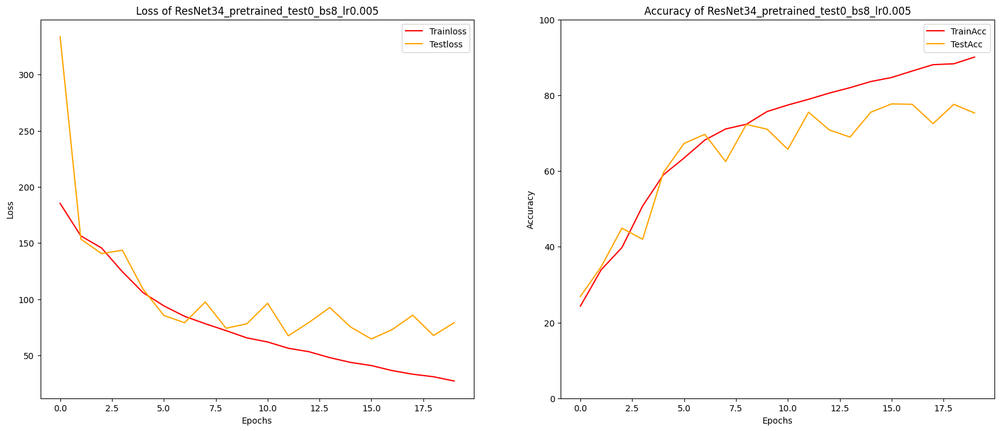

ResNet34_pretrained_test0_bs8_lr0.002
Epoch1:[1000/76800(1%)]
Epoch1:[2000/76800(3%)]
Epoch1:[3000/76800(4%)]
	 Train Loss:183.580062, Test Loss:199.166846, Train Acc:23.594%, Test Acc:25.104%
Epoch2:[4840/76800(6%)]
Epoch2:[5840/76800(8%)]
Epoch2:[6840/76800(9%)]
	 Train Loss:157.202799, Test Loss:156.636995, Train Acc:33.594%, Test Acc:35.312%
	 Weight Saved
Epoch3:[8680/76800(11%)]
Epoch3:[9680/76800(13%)]
Epoch3:[10680/76800(14%)]
	 Train Loss:150.106592, Test Loss:196.406657, Train Acc:37.396%, Test Acc:37.604%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
Epoch4:[12520/76800(16%)]
Epoch4:[13520/76800(18%)]
Epoch4:[14520/76800(19%)]
	 Train Loss:134.881340, Test Loss:115.207951, Train Acc:44.896%, Test Acc:54.896%
	 Weight Saved
Epoch5:[16360/76800(21%)]
Epoch5:[17360/76800(23%)]
Epoch5:[18360/76800(24%)]
	 Train Loss:116.267773, Test Loss:113.125863, Train Acc:54.635%, Test Acc:57.917%
	 Weight Saved
Epoch6:[20200/76800(26%)]
Epoch6:[21200/76800(28%)]
Epoch6:[22200/7680

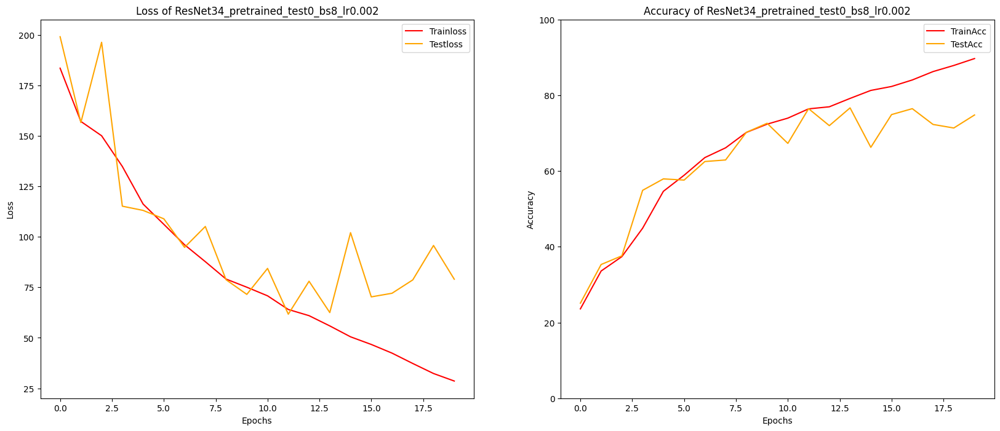

ResNet34_pretrained_test0_bs8_lr0.0005
Epoch1:[1000/76800(1%)]
Epoch1:[2000/76800(3%)]
Epoch1:[3000/76800(4%)]
	 Train Loss:151.761182, Test Loss:141.003499, Train Acc:38.854%, Test Acc:45.833%
Epoch2:[4840/76800(6%)]
Epoch2:[5840/76800(8%)]
Epoch2:[6840/76800(9%)]
	 Train Loss:109.036548, Test Loss:103.092244, Train Acc:59.323%, Test Acc:63.021%
	 Weight Saved
Epoch3:[8680/76800(11%)]
Epoch3:[9680/76800(13%)]
Epoch3:[10680/76800(14%)]
	 Train Loss:87.144458, Test Loss:62.543921, Train Acc:68.385%, Test Acc:77.708%
	 Weight Saved
Epoch4:[12520/76800(16%)]
Epoch4:[13520/76800(18%)]
Epoch4:[14520/76800(19%)]
	 Train Loss:74.043327, Test Loss:68.873885, Train Acc:74.167%, Test Acc:75.104%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[16360/76800(21%)]
Epoch5:[17360/76800(23%)]
Epoch5:[18360/76800(24%)]
	 Train Loss:65.846037, Test Loss:62.957715, Train Acc:75.391%, Test Acc:76.146%
	 NOTICE: Early stopping counter 2 of 15
Epoch6:[20200/76800(26%)]
Epoch6:[21200/76800(28%)]
Epoch6:[2220

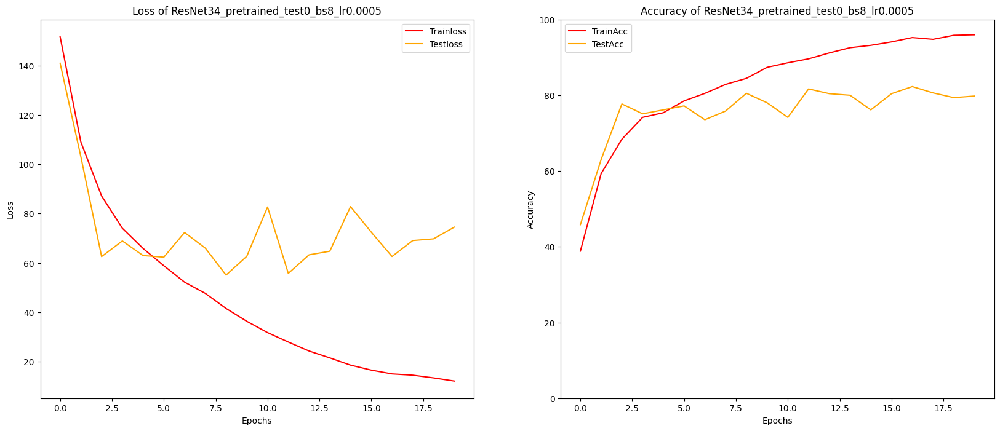

ResNet34_pretrained_test0_bs8_lr0.00025
Epoch1:[1000/76800(1%)]
Epoch1:[2000/76800(3%)]
Epoch1:[3000/76800(4%)]
	 Train Loss:108.107690, Test Loss:72.878760, Train Acc:59.896%, Test Acc:72.708%
Epoch2:[4840/76800(6%)]
Epoch2:[5840/76800(8%)]
Epoch2:[6840/76800(9%)]
	 Train Loss:74.443913, Test Loss:67.034180, Train Acc:72.552%, Test Acc:75.000%
	 Weight Saved
Epoch3:[8680/76800(11%)]
Epoch3:[9680/76800(13%)]
Epoch3:[10680/76800(14%)]
	 Train Loss:62.689433, Test Loss:59.385018, Train Acc:77.292%, Test Acc:80.208%
	 Weight Saved
Epoch4:[12520/76800(16%)]
Epoch4:[13520/76800(18%)]
Epoch4:[14520/76800(19%)]
	 Train Loss:52.073112, Test Loss:51.856608, Train Acc:81.849%, Test Acc:79.688%
Epoch5:[16360/76800(21%)]
Epoch5:[17360/76800(23%)]
Epoch5:[18360/76800(24%)]
	 Train Loss:44.648315, Test Loss:57.503389, Train Acc:83.854%, Test Acc:81.354%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
Epoch6:[20200/76800(26%)]
Epoch6:[21200/76800(28%)]
Epoch6:[22200/76800(29%)]
	 Train Loss:3

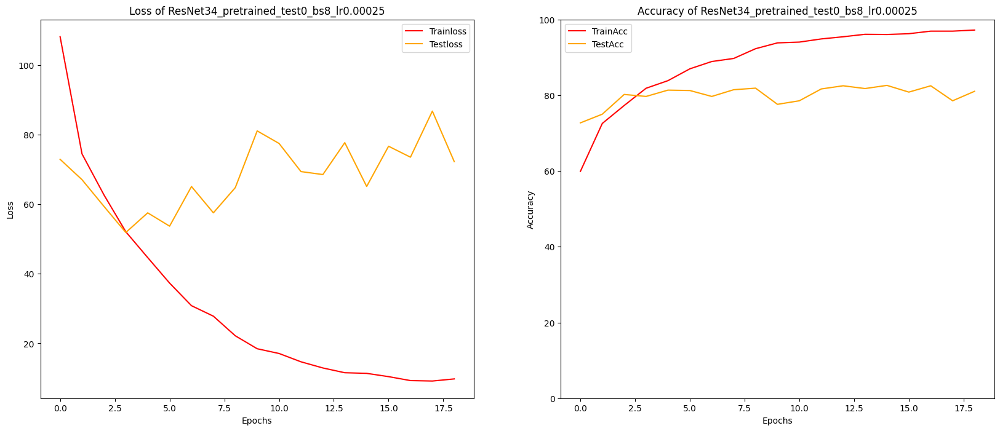

ResNet34_pretrained_test0_bs8_lr0.0001
Epoch1:[1000/76800(1%)]
Epoch1:[2000/76800(3%)]
Epoch1:[3000/76800(4%)]
	 Train Loss:82.987240, Test Loss:71.002466, Train Acc:69.297%, Test Acc:76.354%
Epoch2:[4840/76800(6%)]
Epoch2:[5840/76800(8%)]
Epoch2:[6840/76800(9%)]
	 Train Loss:57.908370, Test Loss:51.808350, Train Acc:79.635%, Test Acc:82.604%
	 Weight Saved
Epoch3:[8680/76800(11%)]
Epoch3:[9680/76800(13%)]
Epoch3:[10680/76800(14%)]
	 Train Loss:44.510384, Test Loss:48.430237, Train Acc:83.438%, Test Acc:83.229%
	 Weight Saved
Epoch4:[12520/76800(16%)]
Epoch4:[13520/76800(18%)]
Epoch4:[14520/76800(19%)]
	 Train Loss:32.750981, Test Loss:56.750456, Train Acc:88.646%, Test Acc:80.104%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[16360/76800(21%)]
Epoch5:[17360/76800(23%)]
Epoch5:[18360/76800(24%)]
	 Train Loss:25.576074, Test Loss:63.534424, Train Acc:90.781%, Test Acc:79.792%
	 NOTICE: Early stopping counter 2 of 15
Epoch6:[20200/76800(26%)]
Epoch6:[21200/76800(28%)]
Epoch6:[22200/76

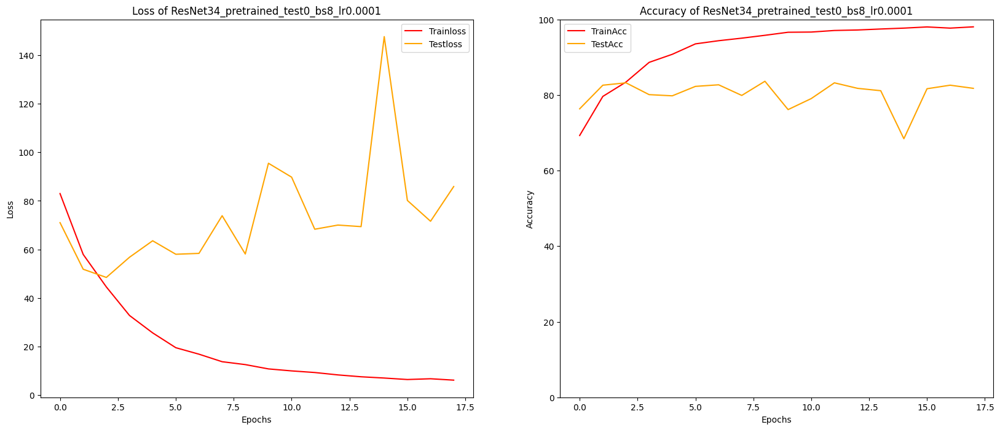

ResNet34_pretrained_test0_bs16_lr0.005
Epoch1:[2000/76800(3%)]
	 Train Loss:207.460693, Test Loss:249.251204, Train Acc:17.448%, Test Acc:18.125%
Epoch2:[5840/76800(8%)]
	 Train Loss:166.645687, Test Loss:1193.993359, Train Acc:28.672%, Test Acc:25.000%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
Epoch3:[9680/76800(13%)]
	 Train Loss:149.816878, Test Loss:86475.316667, Train Acc:38.646%, Test Acc:20.104%
	 NOTICE: Early stopping counter 2 of 15
Epoch4:[13520/76800(18%)]
	 Train Loss:138.680111, Test Loss:328.879818, Train Acc:44.688%, Test Acc:41.667%
	 Weight Saved
	 NOTICE: Early stopping counter 3 of 15
Epoch5:[17360/76800(23%)]
	 Train Loss:123.157284, Test Loss:199.552035, Train Acc:51.953%, Test Acc:49.375%
	 Weight Saved
Epoch6:[21200/76800(28%)]
	 Train Loss:112.013713, Test Loss:129.542424, Train Acc:56.927%, Test Acc:52.396%
	 Weight Saved
Epoch7:[25040/76800(33%)]
	 Train Loss:97.158480, Test Loss:88.003687, Train Acc:63.438%, Test Acc:65.208%
	 Weight Saved
Epoc

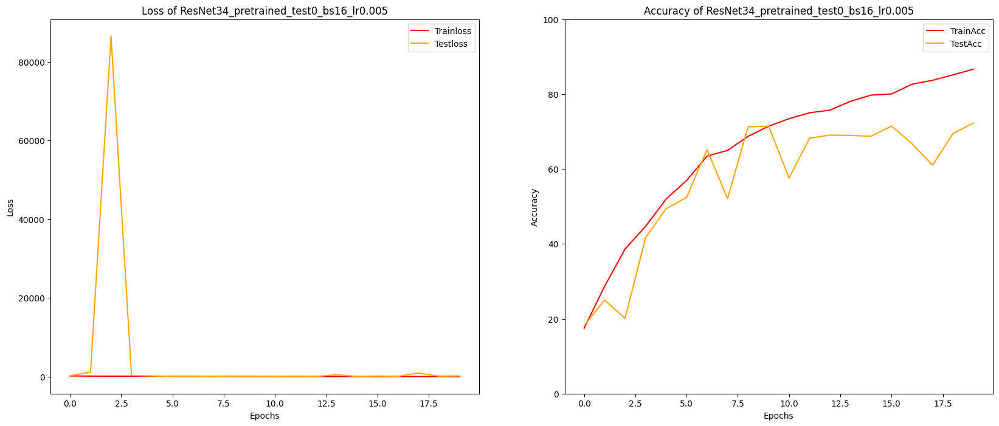

ResNet34_pretrained_test0_bs16_lr0.002
Epoch1:[2000/76800(3%)]
	 Train Loss:194.486947, Test Loss:180.535628, Train Acc:21.458%, Test Acc:22.812%
Epoch2:[5840/76800(8%)]
	 Train Loss:158.731966, Test Loss:471.355436, Train Acc:32.500%, Test Acc:28.333%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
Epoch3:[9680/76800(13%)]
	 Train Loss:143.572217, Test Loss:153.060954, Train Acc:42.057%, Test Acc:41.354%
	 Weight Saved
Epoch4:[13520/76800(18%)]
	 Train Loss:112.908049, Test Loss:130.820760, Train Acc:56.432%, Test Acc:53.125%
	 Weight Saved
Epoch5:[17360/76800(23%)]
	 Train Loss:98.549992, Test Loss:81.465096, Train Acc:63.229%, Test Acc:69.167%
	 Weight Saved
Epoch6:[21200/76800(28%)]
	 Train Loss:91.350618, Test Loss:137.587646, Train Acc:66.016%, Test Acc:50.208%
	 NOTICE: Early stopping counter 1 of 15
Epoch7:[25040/76800(33%)]
	 Train Loss:82.876017, Test Loss:78.094141, Train Acc:69.349%, Test Acc:71.771%
	 Weight Saved
Epoch8:[28880/76800(38%)]
	 Train Loss:76.667285, T

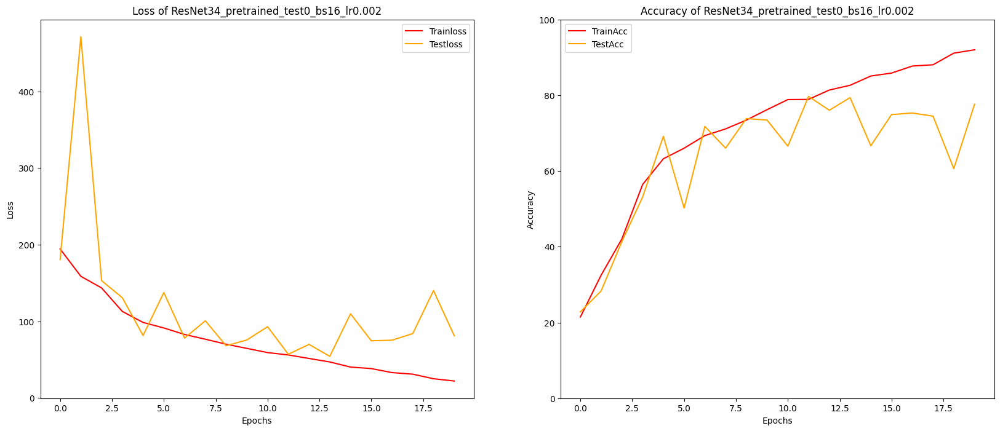

ResNet34_pretrained_test0_bs16_lr0.0005
Epoch1:[2000/76800(3%)]
	 Train Loss:141.541569, Test Loss:151.015544, Train Acc:44.948%, Test Acc:50.938%
Epoch2:[5840/76800(8%)]
	 Train Loss:88.843726, Test Loss:101.436377, Train Acc:66.797%, Test Acc:65.938%
	 Weight Saved
Epoch3:[9680/76800(13%)]
	 Train Loss:75.237907, Test Loss:68.782194, Train Acc:71.615%, Test Acc:75.625%
	 Weight Saved
Epoch4:[13520/76800(18%)]
	 Train Loss:62.429924, Test Loss:54.668962, Train Acc:78.359%, Test Acc:78.333%
	 Weight Saved
Epoch5:[17360/76800(23%)]
	 Train Loss:57.105204, Test Loss:61.873246, Train Acc:79.505%, Test Acc:77.396%
	 NOTICE: Early stopping counter 1 of 15
Epoch6:[21200/76800(28%)]
	 Train Loss:50.924573, Test Loss:59.593933, Train Acc:81.406%, Test Acc:78.542%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 15
Epoch7:[25040/76800(33%)]
	 Train Loss:46.584814, Test Loss:70.759635, Train Acc:83.255%, Test Acc:75.938%
	 NOTICE: Early stopping counter 3 of 15
Epoch8:[28880/76800(38%)]
	 Tr

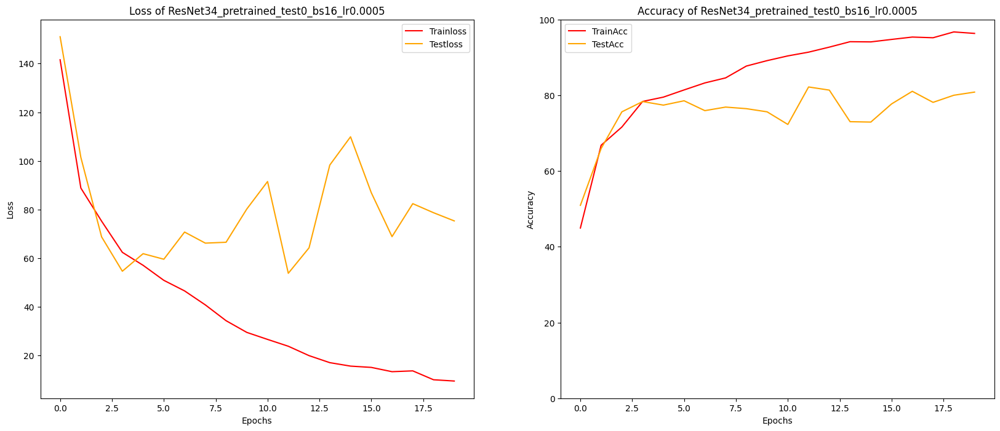

ResNet34_pretrained_test0_bs16_lr0.00025
Epoch1:[2000/76800(3%)]
	 Train Loss:95.861922, Test Loss:94.988428, Train Acc:64.792%, Test Acc:65.625%
Epoch2:[5840/76800(8%)]
	 Train Loss:60.959416, Test Loss:59.030509, Train Acc:78.438%, Test Acc:78.750%
	 Weight Saved
Epoch3:[9680/76800(13%)]
	 Train Loss:52.194775, Test Loss:56.717428, Train Acc:80.365%, Test Acc:79.271%
	 Weight Saved
Epoch4:[13520/76800(18%)]
	 Train Loss:41.163774, Test Loss:47.903487, Train Acc:85.260%, Test Acc:82.708%
	 Weight Saved
Epoch5:[17360/76800(23%)]
	 Train Loss:36.185494, Test Loss:53.660551, Train Acc:86.198%, Test Acc:81.458%
	 NOTICE: Early stopping counter 1 of 15
Epoch6:[21200/76800(28%)]
	 Train Loss:28.261837, Test Loss:63.895797, Train Acc:89.427%, Test Acc:79.271%
	 NOTICE: Early stopping counter 2 of 15
Epoch7:[25040/76800(33%)]
	 Train Loss:25.788273, Test Loss:52.082926, Train Acc:90.547%, Test Acc:82.188%
	 NOTICE: Early stopping counter 3 of 15
Epoch8:[28880/76800(38%)]
	 Train Loss:19.76622

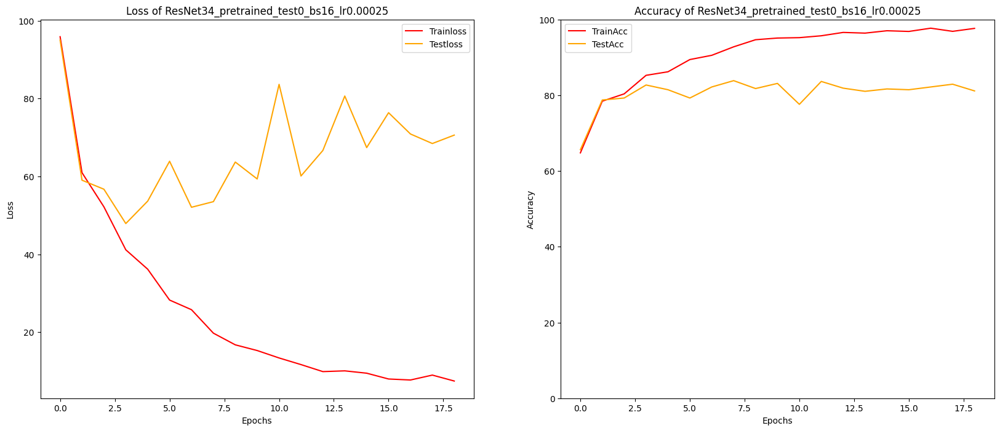

ResNet34_pretrained_test0_bs16_lr0.0001
Epoch1:[2000/76800(3%)]
	 Train Loss:74.904451, Test Loss:75.295133, Train Acc:72.292%, Test Acc:73.750%
Epoch2:[5840/76800(8%)]
	 Train Loss:46.488590, Test Loss:49.835128, Train Acc:82.344%, Test Acc:82.292%
	 Weight Saved
Epoch3:[9680/76800(13%)]
	 Train Loss:33.692261, Test Loss:44.380033, Train Acc:87.943%, Test Acc:84.167%
	 Weight Saved
Epoch4:[13520/76800(18%)]
	 Train Loss:22.993801, Test Loss:50.195321, Train Acc:92.448%, Test Acc:81.562%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[17360/76800(23%)]
	 Train Loss:19.001099, Test Loss:74.530615, Train Acc:93.490%, Test Acc:80.625%
	 NOTICE: Early stopping counter 2 of 15
Epoch6:[21200/76800(28%)]
	 Train Loss:13.821674, Test Loss:64.168372, Train Acc:95.365%, Test Acc:82.604%
	 NOTICE: Early stopping counter 3 of 15
Epoch7:[25040/76800(33%)]
	 Train Loss:13.185122, Test Loss:54.818669, Train Acc:95.625%, Test Acc:83.646%
	 NOTICE: Early stopping counter 4 of 15
Epoch8:[28880/76800(38

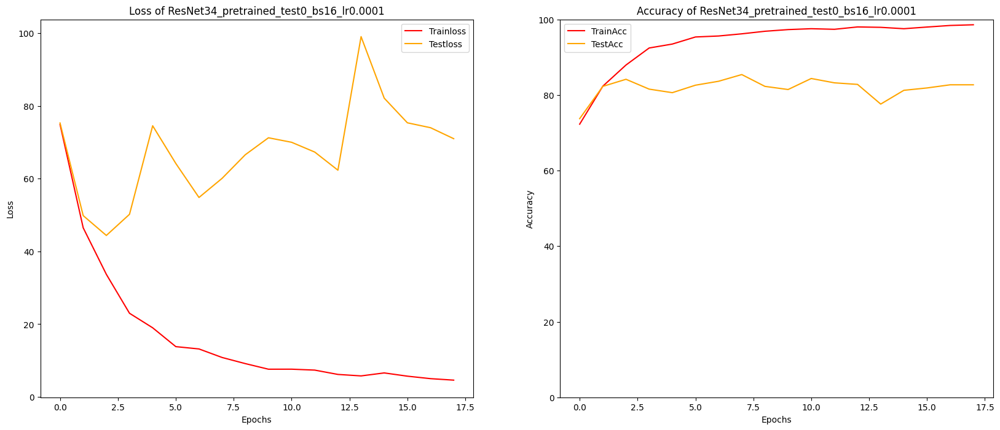

ResNet34_pretrained_test0_bs32_lr0.005
	 Train Loss:209.806836, Test Loss:170.236084, Train Acc:22.656%, Test Acc:29.167%
	 Train Loss:152.934342, Test Loss:190.666471, Train Acc:37.422%, Test Acc:34.375%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:137.119515, Test Loss:128.730192, Train Acc:44.688%, Test Acc:50.208%
	 Weight Saved
	 Train Loss:124.910205, Test Loss:172.466943, Train Acc:51.016%, Test Acc:51.354%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:115.933431, Test Loss:158.987191, Train Acc:55.547%, Test Acc:41.354%
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:105.160596, Test Loss:137.591406, Train Acc:59.635%, Test Acc:48.333%
	 NOTICE: Early stopping counter 3 of 15
	 Train Loss:99.348503, Test Loss:91.242204, Train Acc:62.266%, Test Acc:64.167%
	 Weight Saved
	 Train Loss:91.491903, Test Loss:164.670671, Train Acc:64.688%, Test Acc:52.396%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:86.982031, Test Loss:7

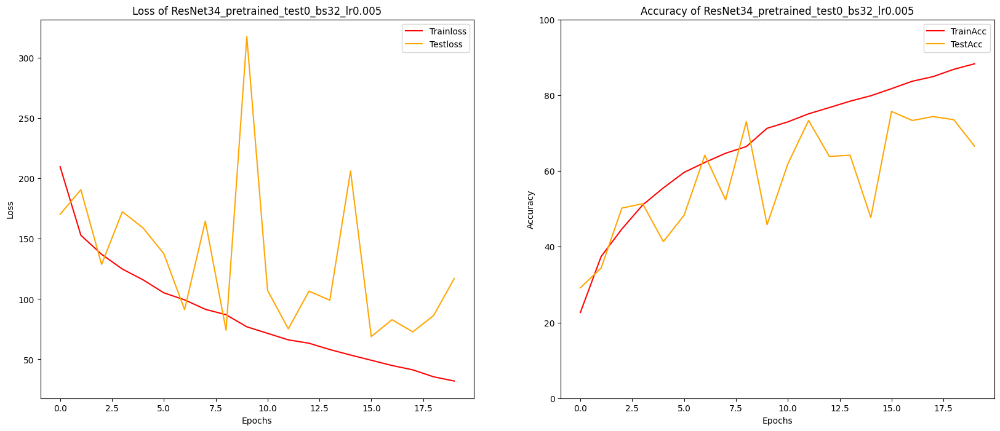

ResNet34_pretrained_test0_bs32_lr0.002
	 Train Loss:204.076335, Test Loss:169.109798, Train Acc:19.349%, Test Acc:24.792%
	 Train Loss:159.973763, Test Loss:150.195980, Train Acc:32.083%, Test Acc:35.417%
	 Weight Saved
	 Train Loss:145.098779, Test Loss:128.753849, Train Acc:39.948%, Test Acc:48.229%
	 Weight Saved
	 Train Loss:132.588363, Test Loss:127.872380, Train Acc:47.161%, Test Acc:50.625%
	 Weight Saved
	 Train Loss:118.623389, Test Loss:107.987671, Train Acc:54.583%, Test Acc:57.708%
	 Weight Saved
	 Train Loss:101.846615, Test Loss:109.842952, Train Acc:61.042%, Test Acc:58.750%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:92.644092, Test Loss:117.397388, Train Acc:65.026%, Test Acc:59.479%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:83.430729, Test Loss:121.308838, Train Acc:69.245%, Test Acc:60.833%
	 Weight Saved
	 NOTICE: Early stopping counter 3 of 15
	 Train Loss:80.573535, Test Loss:92.039925, Train Acc:70.000%, Test Ac

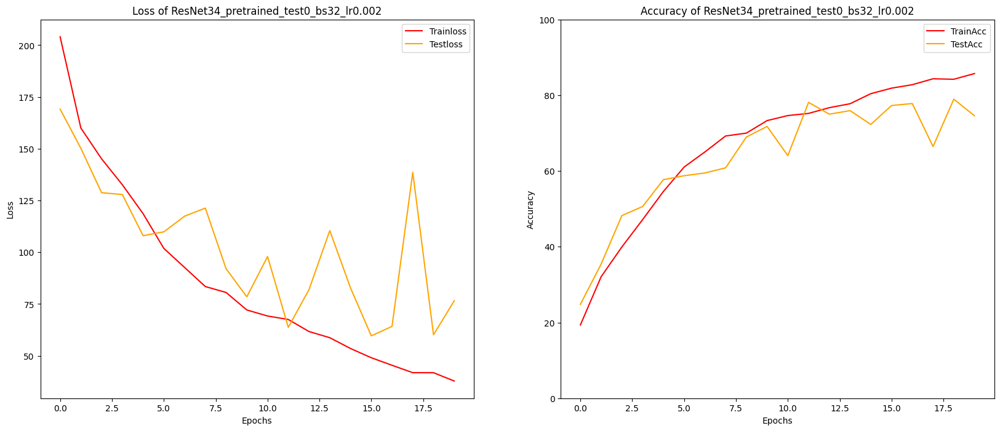

ResNet34_pretrained_test0_bs32_lr0.0005
	 Train Loss:151.312777, Test Loss:115.128361, Train Acc:41.276%, Test Acc:56.667%
	 Train Loss:92.065991, Test Loss:108.729818, Train Acc:65.339%, Test Acc:60.104%
	 Weight Saved
	 Train Loss:76.019897, Test Loss:79.380151, Train Acc:72.500%, Test Acc:70.208%
	 Weight Saved
	 Train Loss:64.500724, Test Loss:59.461271, Train Acc:75.599%, Test Acc:76.562%
	 Weight Saved
	 Train Loss:57.249972, Test Loss:61.539193, Train Acc:79.297%, Test Acc:78.438%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:50.425378, Test Loss:61.724365, Train Acc:81.797%, Test Acc:77.917%
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:46.019421, Test Loss:62.111873, Train Acc:82.865%, Test Acc:77.812%
	 NOTICE: Early stopping counter 3 of 15
	 Train Loss:41.601160, Test Loss:86.200081, Train Acc:84.896%, Test Acc:70.729%
	 NOTICE: Early stopping counter 4 of 15
	 Train Loss:36.409538, Test Loss:59.924613, Train Acc:86.589%, Test Acc:78.958%
	 We

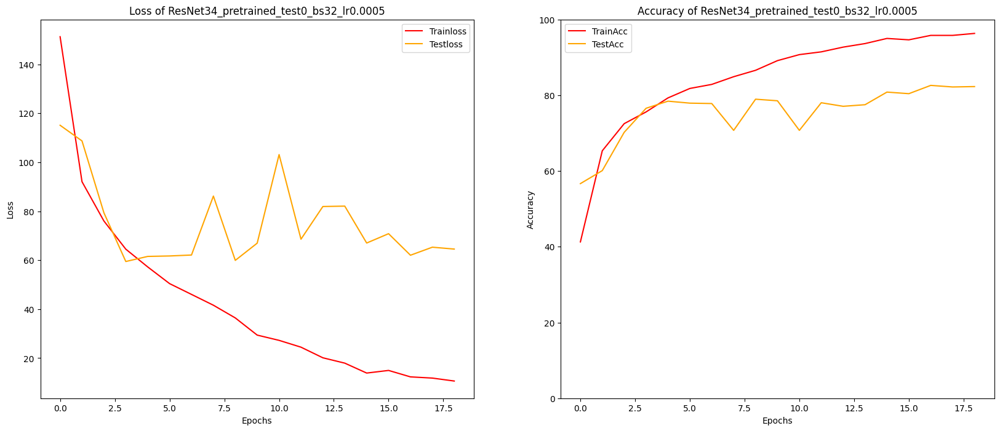

ResNet34_pretrained_test0_bs32_lr0.00025
	 Train Loss:94.771143, Test Loss:70.254191, Train Acc:66.823%, Test Acc:75.521%
	 Train Loss:57.682406, Test Loss:68.579647, Train Acc:78.698%, Test Acc:72.812%
	 Train Loss:46.428113, Test Loss:51.876485, Train Acc:82.812%, Test Acc:80.833%
	 Weight Saved
	 Train Loss:39.797689, Test Loss:68.201318, Train Acc:85.755%, Test Acc:76.458%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:32.710260, Test Loss:69.600415, Train Acc:88.047%, Test Acc:78.125%
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:26.255971, Test Loss:69.191585, Train Acc:90.807%, Test Acc:77.708%
	 NOTICE: Early stopping counter 3 of 15
	 Train Loss:21.170317, Test Loss:73.046403, Train Acc:92.057%, Test Acc:77.188%
	 NOTICE: Early stopping counter 4 of 15
	 Train Loss:15.919594, Test Loss:100.485050, Train Acc:94.453%, Test Acc:74.583%
	 NOTICE: Early stopping counter 5 of 15
	 Train Loss:14.909892, Test Loss:76.243262, Train Acc:94.870%, Test Acc:79.688%
	 NOTICE:

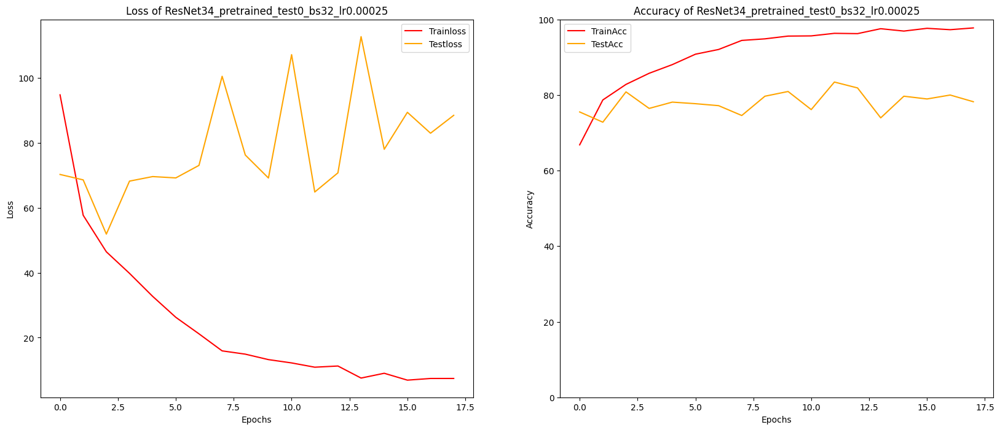

ResNet34_pretrained_test0_bs32_lr0.0001
	 Train Loss:71.129744, Test Loss:60.152258, Train Acc:73.594%, Test Acc:78.958%
	 Train Loss:37.658948, Test Loss:59.151489, Train Acc:86.354%, Test Acc:80.729%
	 Weight Saved
	 Train Loss:24.893365, Test Loss:57.631364, Train Acc:90.859%, Test Acc:80.000%
	 Train Loss:16.354230, Test Loss:64.103369, Train Acc:94.089%, Test Acc:81.979%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:12.793610, Test Loss:64.664701, Train Acc:95.651%, Test Acc:81.458%
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:9.263904, Test Loss:62.322192, Train Acc:96.719%, Test Acc:82.083%
	 Weight Saved
	 NOTICE: Early stopping counter 3 of 15
	 Train Loss:8.602064, Test Loss:71.983659, Train Acc:97.161%, Test Acc:81.354%
	 NOTICE: Early stopping counter 4 of 15
	 Train Loss:7.240061, Test Loss:70.738753, Train Acc:97.578%, Test Acc:82.604%
	 Weight Saved
	 NOTICE: Early stopping counter 5 of 15
	 Train Loss:7.879182, Test Loss:79.302409, Train 

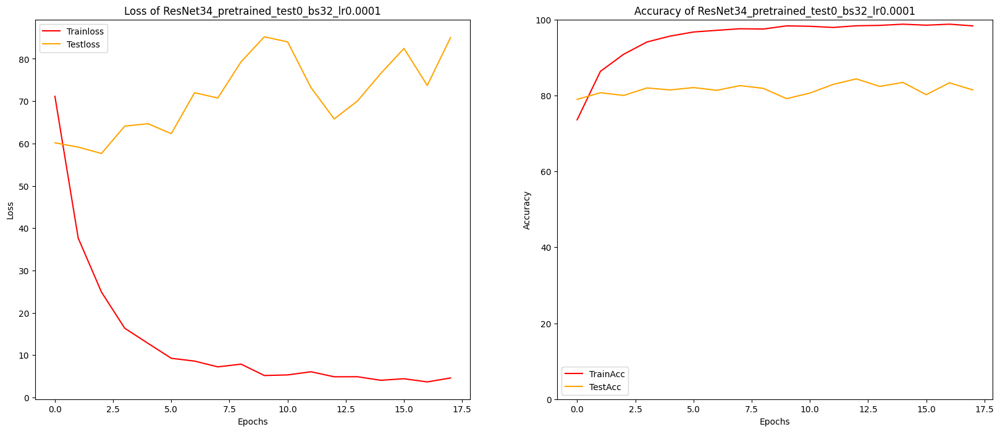

ResNet34_pretrained_test0_bs64_lr0.005
	 Train Loss:237.824398, Test Loss:190.303109, Train Acc:20.755%, Test Acc:26.458%
	 Train Loss:163.870980, Test Loss:146.204476, Train Acc:32.240%, Test Acc:37.604%
	 Weight Saved
	 Train Loss:144.664258, Test Loss:137.284668, Train Acc:42.161%, Test Acc:43.646%
	 Weight Saved
	 Train Loss:134.640047, Test Loss:187.770312, Train Acc:46.589%, Test Acc:38.333%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:124.837687, Test Loss:126.326522, Train Acc:50.938%, Test Acc:49.062%
	 Weight Saved
	 Train Loss:128.546940, Test Loss:138.775977, Train Acc:49.844%, Test Acc:48.438%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:113.856535, Test Loss:106.709814, Train Acc:56.406%, Test Acc:61.250%
	 Weight Saved
	 Train Loss:105.083781, Test Loss:237.684098, Train Acc:60.599%, Test Acc:44.062%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:97.606877, Test Loss:93.323527, Train Acc:62.474%, Test Acc:65.104%
	 Weight Saved
	 Train Loss:89.46

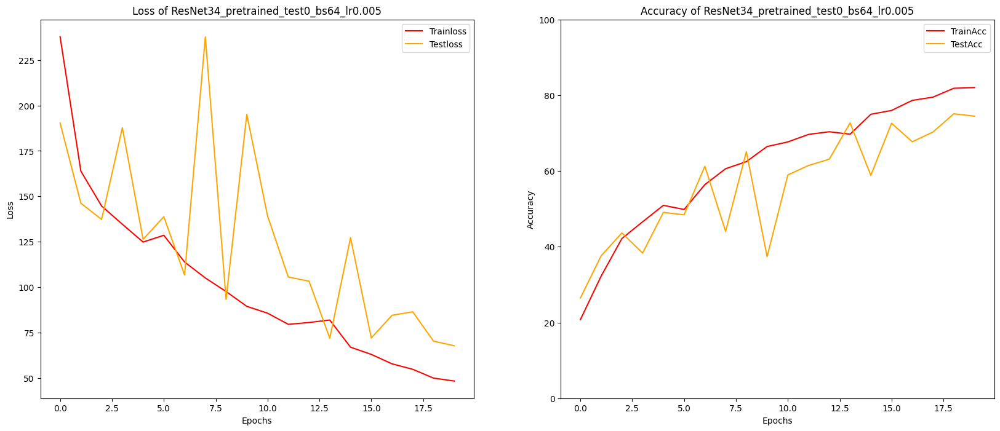

ResNet34_pretrained_test0_bs64_lr0.002
	 Train Loss:209.777181, Test Loss:178.158675, Train Acc:16.875%, Test Acc:24.792%
	 Train Loss:165.389242, Test Loss:158.313037, Train Acc:30.729%, Test Acc:34.167%
	 Weight Saved
	 Train Loss:151.610156, Test Loss:142.005371, Train Acc:36.068%, Test Acc:42.292%
	 Weight Saved
	 Train Loss:135.622534, Test Loss:138.982454, Train Acc:47.161%, Test Acc:49.792%
	 Weight Saved
	 Train Loss:115.805534, Test Loss:118.465511, Train Acc:56.120%, Test Acc:60.521%
	 Weight Saved
	 Train Loss:106.036011, Test Loss:188.975732, Train Acc:59.661%, Test Acc:45.104%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:96.021094, Test Loss:125.216105, Train Acc:63.776%, Test Acc:50.104%
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:86.908594, Test Loss:114.890560, Train Acc:67.708%, Test Acc:57.917%
	 Train Loss:79.646126, Test Loss:83.670011, Train Acc:69.714%, Test Acc:69.167%
	 Weight Saved
	 Train Loss:74.273519, Test Loss:74.170353, Train Acc:72.057

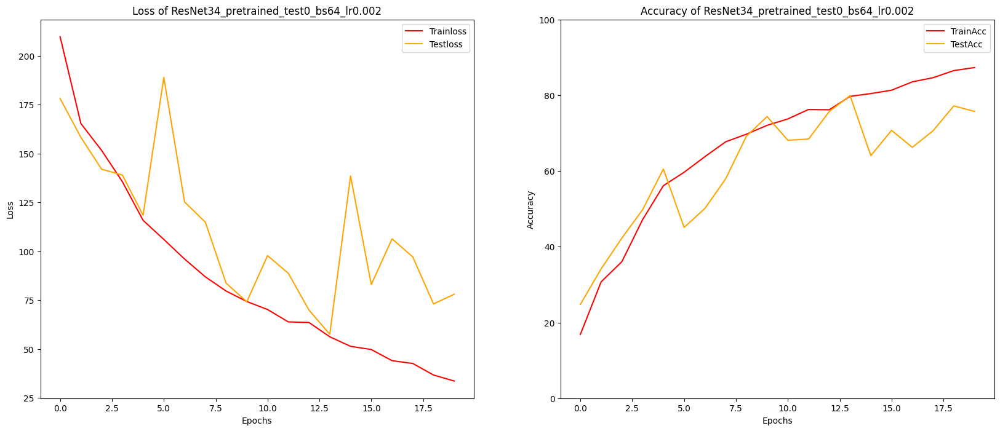

ResNet34_pretrained_test0_bs64_lr0.0005
	 Train Loss:148.804557, Test Loss:106.979118, Train Acc:44.010%, Test Acc:57.292%
	 Train Loss:79.840186, Test Loss:69.533545, Train Acc:70.859%, Test Acc:74.271%
	 Weight Saved
	 Train Loss:62.120011, Test Loss:79.509497, Train Acc:77.604%, Test Acc:71.875%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:51.787443, Test Loss:65.940031, Train Acc:81.458%, Test Acc:77.396%
	 Weight Saved
	 Train Loss:44.997913, Test Loss:68.047900, Train Acc:83.594%, Test Acc:76.354%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:38.698653, Test Loss:75.353532, Train Acc:85.807%, Test Acc:75.833%
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:35.545223, Test Loss:55.357520, Train Acc:87.292%, Test Acc:80.312%
	 Weight Saved
	 Train Loss:29.424864, Test Loss:107.826147, Train Acc:89.036%, Test Acc:68.542%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:24.253790, Test Loss:73.885514, Train Acc:91.094%, Test Acc:77.292%
	 NOTICE: Early sto

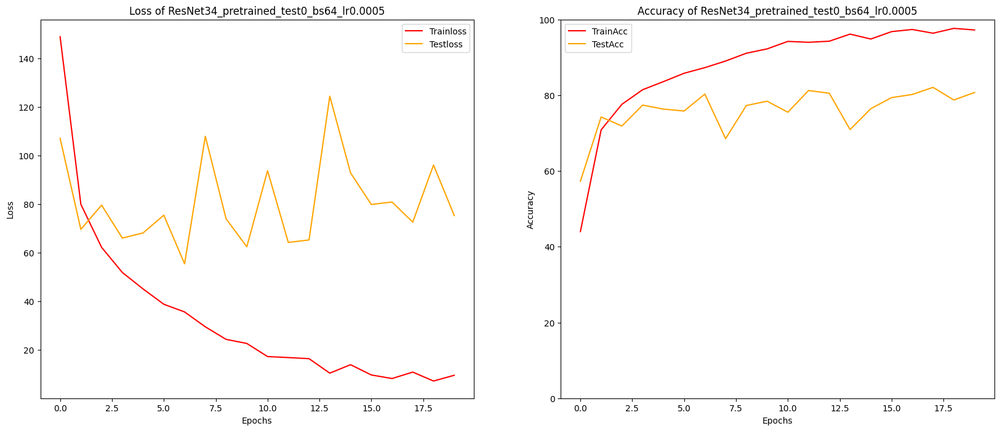

ResNet34_pretrained_test0_bs64_lr0.00025
	 Train Loss:100.609823, Test Loss:80.185433, Train Acc:63.177%, Test Acc:71.875%
	 Train Loss:50.082686, Test Loss:56.898490, Train Acc:81.979%, Test Acc:78.646%
	 Weight Saved
	 Train Loss:38.425008, Test Loss:106.956698, Train Acc:85.911%, Test Acc:63.958%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:30.842879, Test Loss:59.610750, Train Acc:88.750%, Test Acc:81.354%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:23.005387, Test Loss:92.809774, Train Acc:91.354%, Test Acc:73.854%
	 NOTICE: Early stopping counter 3 of 15
	 Train Loss:17.813725, Test Loss:78.133211, Train Acc:93.151%, Test Acc:78.229%
	 NOTICE: Early stopping counter 4 of 15
	 Train Loss:14.537223, Test Loss:66.922530, Train Acc:94.661%, Test Acc:80.312%
	 NOTICE: Early stopping counter 5 of 15
	 Train Loss:11.478261, Test Loss:86.341113, Train Acc:96.016%, Test Acc:76.979%
	 NOTICE: Early stopping counter 6 of 15
	 Train Loss:10.701489, Test Loss

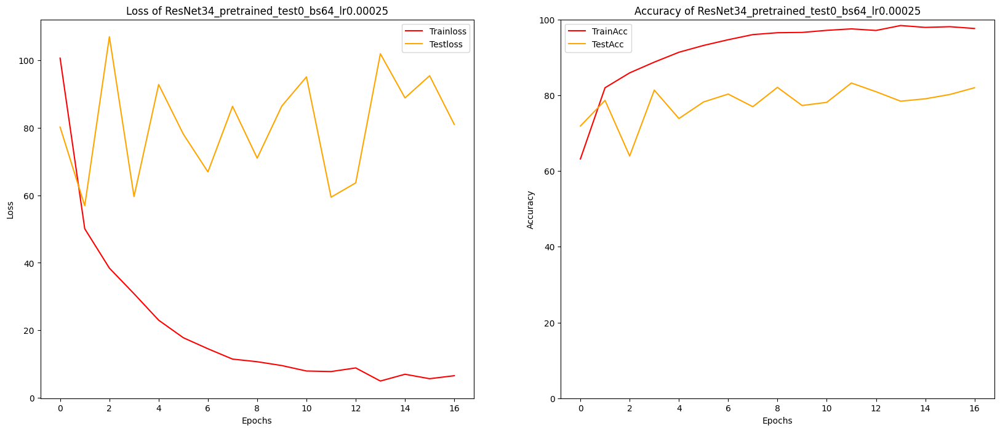

ResNet34_pretrained_test0_bs64_lr0.0001
	 Train Loss:71.045182, Test Loss:51.284839, Train Acc:73.646%, Test Acc:81.042%
	 Train Loss:31.887020, Test Loss:53.048743, Train Acc:88.698%, Test Acc:81.771%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:19.724845, Test Loss:47.880709, Train Acc:93.229%, Test Acc:83.333%
	 Weight Saved
	 Train Loss:11.261107, Test Loss:51.617688, Train Acc:95.938%, Test Acc:82.708%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:7.504503, Test Loss:68.211174, Train Acc:97.630%, Test Acc:80.208%
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:7.090897, Test Loss:67.535559, Train Acc:97.604%, Test Acc:82.500%
	 NOTICE: Early stopping counter 3 of 15
	 Train Loss:6.519634, Test Loss:70.147607, Train Acc:97.917%, Test Acc:80.729%
	 NOTICE: Early stopping counter 4 of 15
	 Train Loss:4.757985, Test Loss:63.908602, Train Acc:98.672%, Test Acc:82.708%
	 NOTICE: Early stopping counter 5 of 15
	 Train Loss:2.868504, Test Loss:60.9884

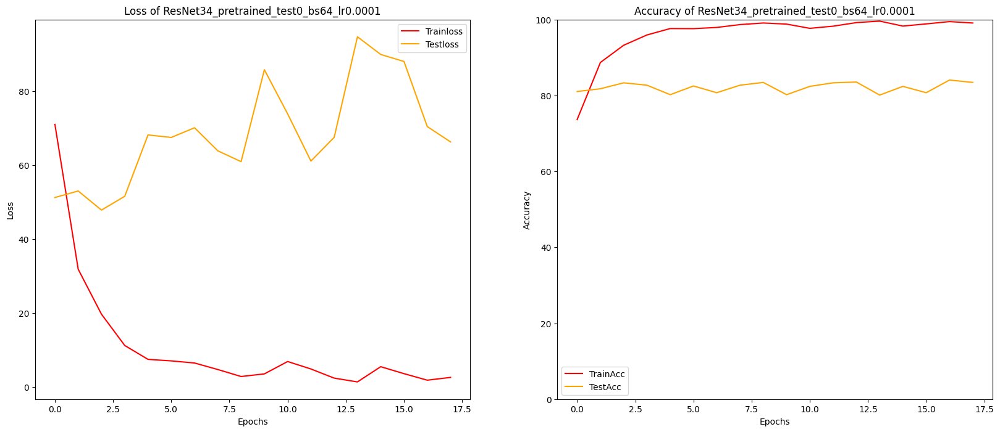

ResNet34_pretrained_test0_bs128_lr0.005
	 Train Loss:265.156055, Test Loss:252.566683, Train Acc:19.141%, Test Acc:16.667%
	 Train Loss:165.083757, Test Loss:158.879622, Train Acc:27.943%, Test Acc:31.979%
	 Weight Saved
	 Train Loss:152.946354, Test Loss:142.290674, Train Acc:35.755%, Test Acc:43.438%
	 Weight Saved
	 Train Loss:139.394873, Test Loss:137.208350, Train Acc:43.411%, Test Acc:42.812%
	 Train Loss:131.338322, Test Loss:135.814030, Train Acc:47.344%, Test Acc:47.188%
	 Weight Saved
	 Train Loss:126.939787, Test Loss:174.764860, Train Acc:50.078%, Test Acc:37.812%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:120.869645, Test Loss:134.113607, Train Acc:53.255%, Test Acc:46.562%
	 Train Loss:112.433773, Test Loss:206.194027, Train Acc:56.146%, Test Acc:40.000%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:106.655566, Test Loss:109.650651, Train Acc:57.760%, Test Acc:60.000%
	 Weight Saved
	 Train Loss:99.696655, Test Loss:153.317318, Train Acc:62.057%, Test A

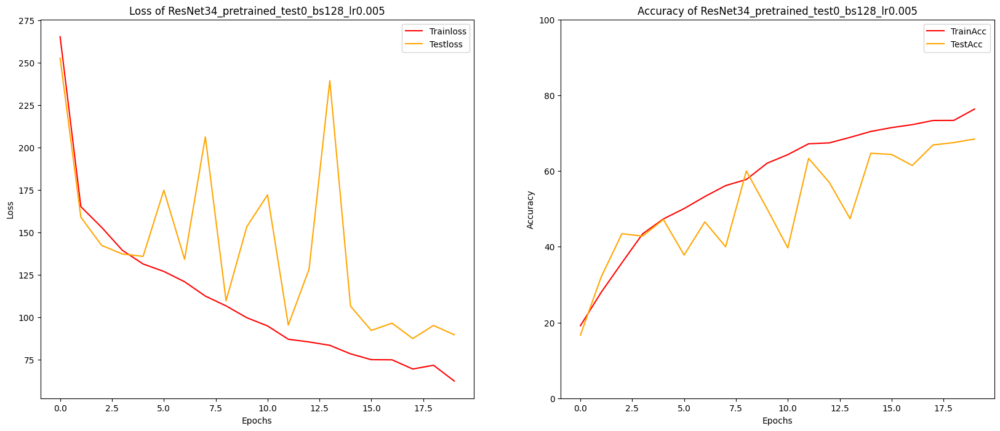

ResNet34_pretrained_test0_bs128_lr0.002
	 Train Loss:214.101123, Test Loss:180.305599, Train Acc:16.745%, Test Acc:16.667%
	 Train Loss:172.868604, Test Loss:176.111702, Train Acc:26.875%, Test Acc:20.000%
	 Weight Saved
	 Train Loss:157.698128, Test Loss:149.463444, Train Acc:32.656%, Test Acc:34.896%
	 Weight Saved
	 Train Loss:145.975016, Test Loss:328.447233, Train Acc:39.115%, Test Acc:30.104%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:135.555640, Test Loss:455.477767, Train Acc:45.651%, Test Acc:35.938%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:123.861043, Test Loss:182.173958, Train Acc:51.276%, Test Acc:35.521%
	 NOTICE: Early stopping counter 3 of 15
	 Train Loss:109.308089, Test Loss:107.589478, Train Acc:59.349%, Test Acc:61.042%
	 Weight Saved
	 Train Loss:97.881812, Test Loss:165.561670, Train Acc:63.906%, Test Acc:48.958%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:89.616496, Test Loss:93.829574, Train Acc:66.406%, Test Acc:

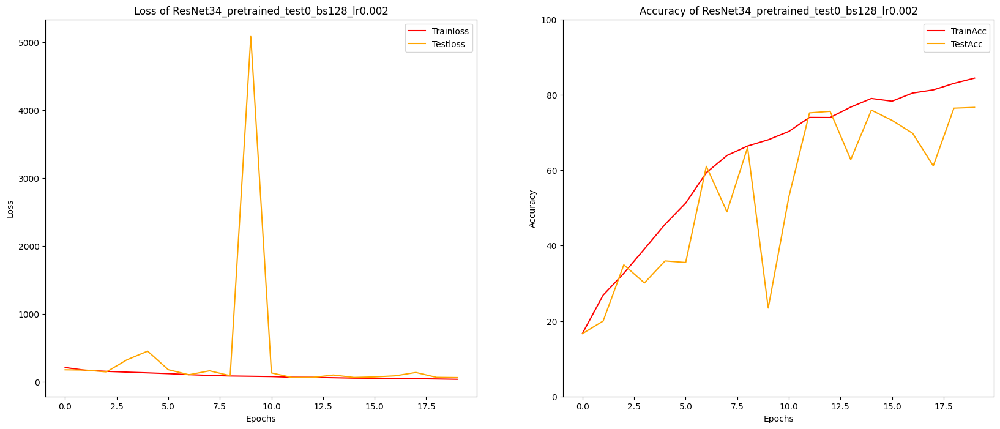

ResNet34_pretrained_test0_bs128_lr0.0005
	 Train Loss:163.547917, Test Loss:103.572770, Train Acc:40.391%, Test Acc:61.562%
	 Train Loss:90.461613, Test Loss:74.283081, Train Acc:66.432%, Test Acc:73.542%
	 Weight Saved
	 Train Loss:66.734587, Test Loss:68.996533, Train Acc:75.521%, Test Acc:73.750%
	 Weight Saved
	 Train Loss:55.704435, Test Loss:58.062268, Train Acc:79.531%, Test Acc:77.812%
	 Weight Saved
	 Train Loss:46.356901, Test Loss:71.018164, Train Acc:82.604%, Test Acc:73.542%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:41.325264, Test Loss:101.064608, Train Acc:84.661%, Test Acc:70.104%
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:33.591026, Test Loss:73.528247, Train Acc:88.125%, Test Acc:75.729%
	 NOTICE: Early stopping counter 3 of 15
	 Train Loss:29.690214, Test Loss:109.355086, Train Acc:89.323%, Test Acc:70.625%
	 NOTICE: Early stopping counter 4 of 15
	 Train Loss:25.517739, Test Loss:112.005322, Train Acc:90.052%, Test Acc:70.938%
	 NOTICE: Early 

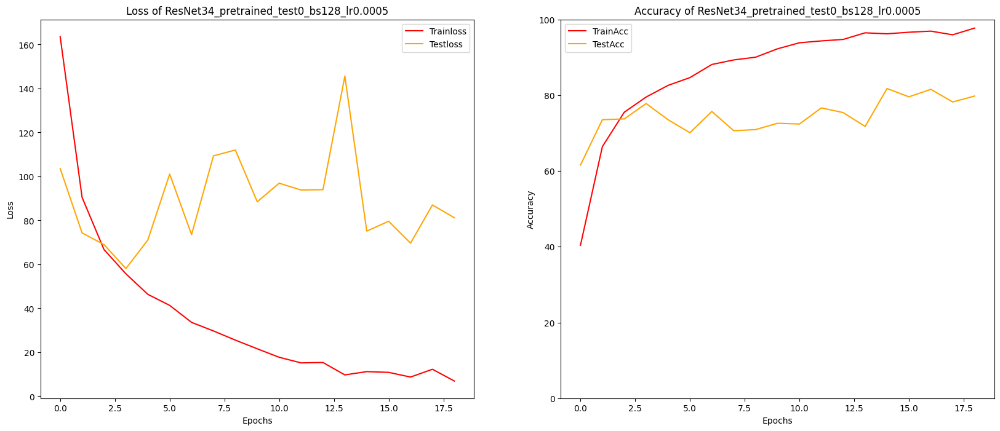

ResNet34_pretrained_test0_bs128_lr0.00025
	 Train Loss:109.231022, Test Loss:67.425321, Train Acc:60.651%, Test Acc:76.562%
	 Train Loss:49.428589, Test Loss:57.085360, Train Acc:82.318%, Test Acc:78.542%
	 Weight Saved
	 Train Loss:36.386015, Test Loss:75.640845, Train Acc:86.641%, Test Acc:72.188%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:27.924420, Test Loss:58.951957, Train Acc:89.557%, Test Acc:79.479%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:18.065944, Test Loss:202.236849, Train Acc:93.802%, Test Acc:60.208%
	 NOTICE: Early stopping counter 3 of 15
	 Train Loss:16.653039, Test Loss:61.886239, Train Acc:93.854%, Test Acc:81.042%
	 Weight Saved
	 NOTICE: Early stopping counter 4 of 15
	 Train Loss:9.809464, Test Loss:59.730770, Train Acc:96.797%, Test Acc:83.542%
	 Weight Saved
	 NOTICE: Early stopping counter 5 of 15
	 Train Loss:9.399554, Test Loss:115.243148, Train Acc:96.979%, Test Acc:72.083%
	 NOTICE: Early stopping counter 6 of 15
	 T

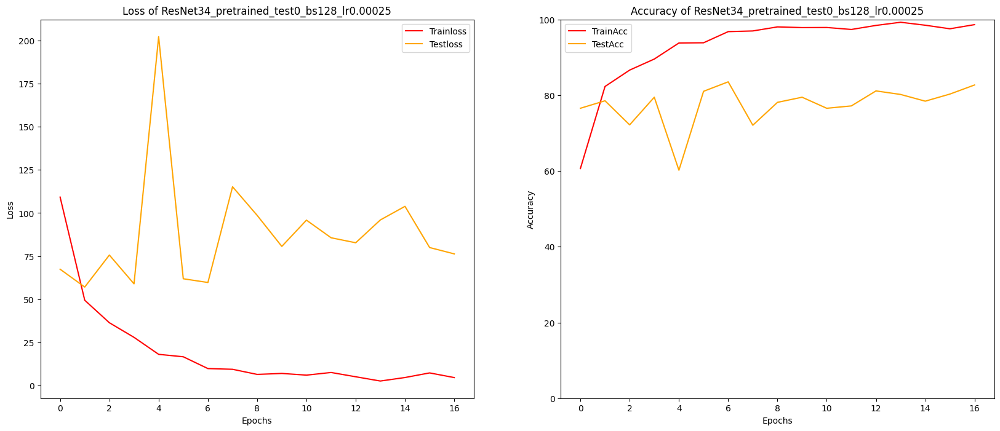

ResNet34_pretrained_test0_bs128_lr0.0001
	 Train Loss:72.684937, Test Loss:59.846362, Train Acc:72.240%, Test Acc:78.333%
	 Train Loss:32.586019, Test Loss:45.774508, Train Acc:88.620%, Test Acc:84.479%
	 Weight Saved
	 Train Loss:18.219906, Test Loss:54.554354, Train Acc:93.646%, Test Acc:81.562%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:8.172205, Test Loss:56.588273, Train Acc:97.500%, Test Acc:82.188%
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:5.159909, Test Loss:72.544629, Train Acc:98.516%, Test Acc:80.833%
	 NOTICE: Early stopping counter 3 of 15
	 Train Loss:5.246145, Test Loss:58.263371, Train Acc:98.203%, Test Acc:84.167%
	 NOTICE: Early stopping counter 4 of 15
	 Train Loss:3.515633, Test Loss:60.246155, Train Acc:98.984%, Test Acc:84.688%
	 Weight Saved
	 NOTICE: Early stopping counter 5 of 15
	 Train Loss:3.482296, Test Loss:87.021696, Train Acc:98.906%, Test Acc:78.021%
	 NOTICE: Early stopping counter 6 of 15
	 Train Loss:1.398550, Test Loss:63.0379

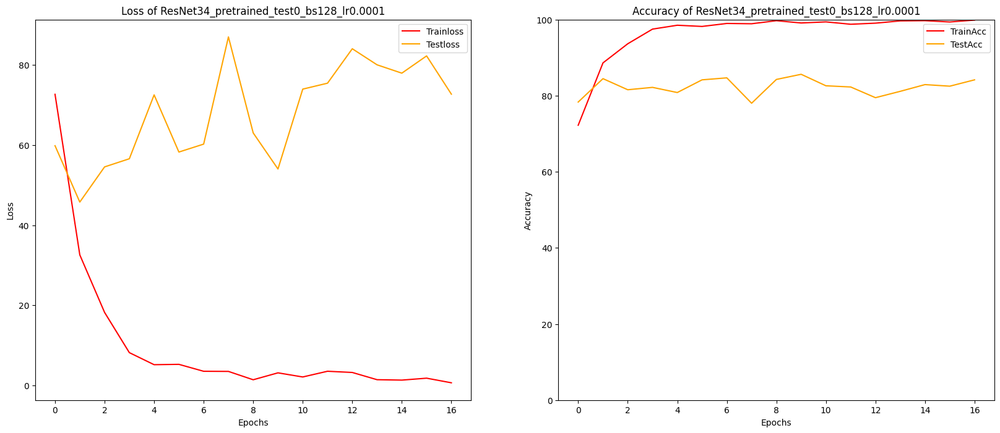

In [167]:
# 使用不同batch_size, 和不同的lr, 先訓練20個epochs看看效果
# 預設的lr是0.001, 以這個lr為中點, 提高或降低初始lr來看看效果
for bs in [8, 16, 32, 64, 128]:
    for lr in [0.005, 0.002, 0.0005, 0.00025, 0.0001]:
        trained_epochs = 0
        epochs = 20
        optimizer="RMSprop"
        PATH = r"D:\TGI102_AI_BootCamp\AIA_Interview\weights"
        modelname = "ResNet34_pretrained_test0_bs{}_lr{}".format(bs, lr)
        firsttitle = "Loss of " + modelname
        secondtitle = "Accuracy of " + modelname

        print(modelname)
        torch.manual_seed(1412)
        net = m.resnet34(pretrained=True)
        net.fc = torch.nn.Linear(512, 6, bias=True)
        net = net.to(device,non_blocking=True)
        start = time()
        trainloss, testloss, trainacc, testacc = full_procedure(net, epochs=epochs, bs=bs
                                                  ,modelname=modelname
                                                  ,PATH=PATH
                                                  ,optimizer=optimizer
                                                  ,lr=lr
                                                  ,patience=15)

        print(modelname)
        print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
        print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
        print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
        print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
        print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
        total_time = time()-start
        print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
        plotgraph(trainloss, testloss, trainacc, testacc, epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle)

Note: ResNet34_pretrained_test0_bs_lr.xlsx <br>
在ResNet34_pretrained_test0_bs128_lr0.0001這個條件出現最高testacc: 85.625%。<br>
<br>
Summary: 
1. 每個batchsize最高testacc都出現在lr=0.0001(本次實驗設定最小的lr)。
2. 每個batchsize在lr <= 0.002之後testloss都緩緩上升，變化穩定，但有過擬合的現象。
3. 調整lr對提升testacc有幫助，但太小的初始lr，testloss變化很小看起來跳不出該loss surface minima（也或許是這就是目前這個weights能找到最好的minima）。
4. 試過使用pre-trained weights的DenseNet121，經過batchsize和lr的搭配，最高的testacc達到84.583%，和ResNet34差不多，但運算時間較長且運算量較大。
<br>

下一步：<br>
試試看lr_scheduler動態改變lr，讓lr隨epoch上升而衰減，讓模型先快速收斂（先跳出loss surface minima尋找其他的minima），穩定後再用小的lr慢慢更新。

ResNet34_pretrained_test0_bs8_StepLR
Epoch1:[1000/76800(1%)]
Epoch1:[2000/76800(3%)]
Epoch1:[3000/76800(4%)]
	 Train Loss:182.455387, Test Loss:400.105176, Train Acc:22.969%, Test Acc:26.667%
Epoch2:[4840/76800(6%)]
Epoch2:[5840/76800(8%)]
Epoch2:[6840/76800(9%)]
	 Train Loss:161.116829, Test Loss:199.452637, Train Acc:32.370%, Test Acc:40.521%
	 Weight Saved
Epoch3:[8680/76800(11%)]
Epoch3:[9680/76800(13%)]
Epoch3:[10680/76800(14%)]
	 Train Loss:146.924870, Test Loss:133.490690, Train Acc:39.141%, Test Acc:44.896%
	 Weight Saved
Epoch4:[12520/76800(16%)]
Epoch4:[13520/76800(18%)]
Epoch4:[14520/76800(19%)]
	 Train Loss:119.980827, Test Loss:122.901270, Train Acc:53.255%, Test Acc:54.688%
	 Weight Saved
Epoch5:[16360/76800(21%)]
Epoch5:[17360/76800(23%)]
Epoch5:[18360/76800(24%)]
	 Train Loss:102.726644, Test Loss:94.523324, Train Acc:61.771%, Test Acc:65.000%
	 Weight Saved
Epoch6:[20200/76800(26%)]
Epoch6:[21200/76800(28%)]
Epoch6:[22200/76800(29%)]
	 Train Loss:83.563973, Test Loss:7

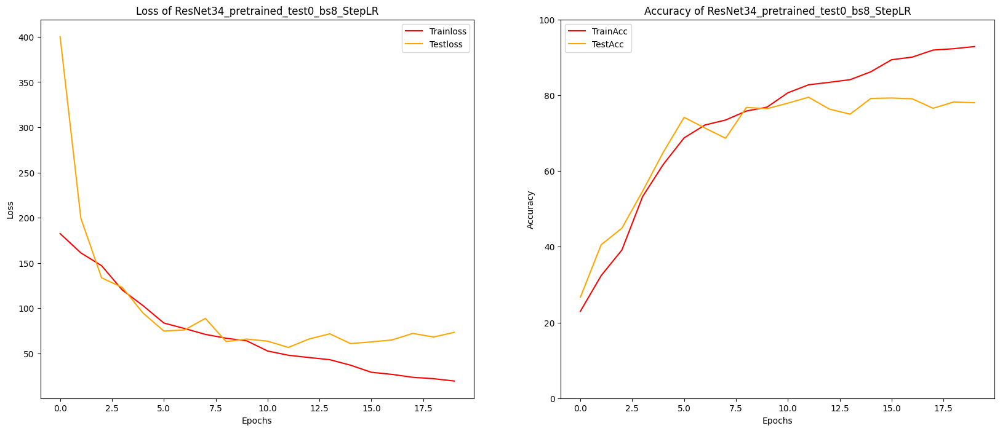

ResNet34_pretrained_test0_bs16_StepLR
Epoch1:[2000/76800(3%)]
	 Train Loss:174.378548, Test Loss:155.012679, Train Acc:30.234%, Test Acc:36.979%
Epoch2:[5840/76800(8%)]
	 Train Loss:128.997420, Test Loss:183.241341, Train Acc:49.948%, Test Acc:42.396%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
Epoch3:[9680/76800(13%)]
	 Train Loss:106.472526, Test Loss:92.601839, Train Acc:59.479%, Test Acc:68.542%
	 Weight Saved
Epoch4:[13520/76800(18%)]
	 Train Loss:88.211336, Test Loss:78.429272, Train Acc:66.745%, Test Acc:71.458%
	 Weight Saved
Epoch5:[17360/76800(23%)]
	 Train Loss:78.575146, Test Loss:87.871631, Train Acc:71.458%, Test Acc:67.917%
	 NOTICE: Early stopping counter 1 of 15
Epoch6:[21200/76800(28%)]
	 Train Loss:62.593815, Test Loss:69.986019, Train Acc:76.589%, Test Acc:76.250%
	 Weight Saved
Epoch7:[25040/76800(33%)]
	 Train Loss:57.960124, Test Loss:51.963778, Train Acc:79.219%, Test Acc:80.000%
	 Weight Saved
Epoch8:[28880/76800(38%)]
	 Train Loss:52.691805, Test L

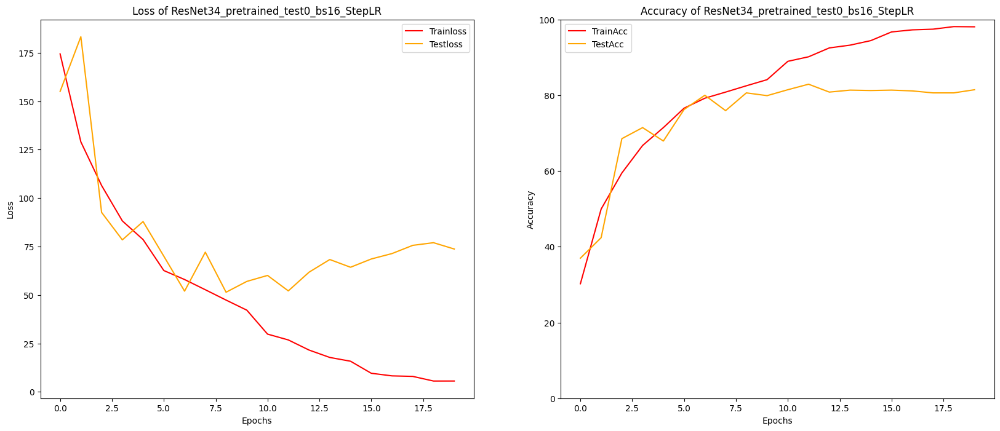

ResNet34_pretrained_test0_bs32_StepLR
	 Train Loss:185.803141, Test Loss:171.118213, Train Acc:23.828%, Test Acc:26.667%
	 Train Loss:142.834066, Test Loss:154.481999, Train Acc:42.969%, Test Acc:43.021%
	 Weight Saved
	 Train Loss:112.439185, Test Loss:275.383822, Train Acc:57.682%, Test Acc:42.604%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:91.752051, Test Loss:83.490861, Train Acc:66.172%, Test Acc:67.708%
	 Weight Saved
	 Train Loss:81.214307, Test Loss:84.656852, Train Acc:70.807%, Test Acc:69.583%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:63.732800, Test Loss:65.334465, Train Acc:76.068%, Test Acc:75.000%
	 Weight Saved
	 Train Loss:60.036621, Test Loss:60.836263, Train Acc:77.734%, Test Acc:78.021%
	 Weight Saved
	 Train Loss:55.755412, Test Loss:83.246126, Train Acc:79.844%, Test Acc:69.375%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:51.183940, Test Loss:86.038590, Train Acc:81.198%, Test Acc:71.979%
	 NOTICE: Early stopping coun

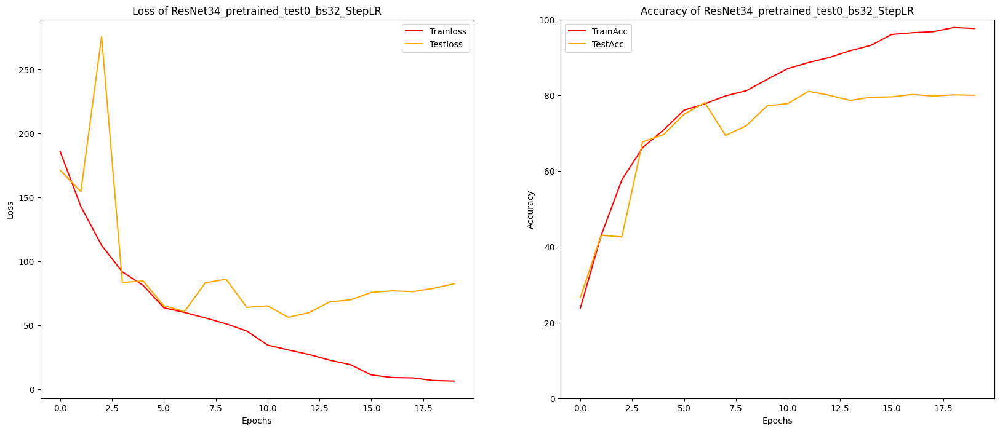

ResNet34_pretrained_test0_bs64_StepLR
	 Train Loss:198.399691, Test Loss:177.307080, Train Acc:19.062%, Test Acc:25.625%
	 Train Loss:159.853271, Test Loss:250.736410, Train Acc:35.495%, Test Acc:25.312%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:130.645890, Test Loss:103.036157, Train Acc:49.010%, Test Acc:64.375%
	 Weight Saved
	 Train Loss:104.493750, Test Loss:127.946387, Train Acc:60.807%, Test Acc:52.604%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:89.146021, Test Loss:96.443050, Train Acc:67.005%, Test Acc:65.521%
	 Weight Saved
	 Train Loss:70.038550, Test Loss:82.465837, Train Acc:74.714%, Test Acc:69.167%
	 Weight Saved
	 Train Loss:65.719771, Test Loss:80.511849, Train Acc:75.781%, Test Acc:69.792%
	 Weight Saved
	 Train Loss:61.347103, Test Loss:104.807756, Train Acc:77.839%, Test Acc:62.708%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:57.097270, Test Loss:57.041227, Train Acc:79.297%, Test Acc:80.312%
	 Weight Saved
	 Train Loss:53.453117, Te

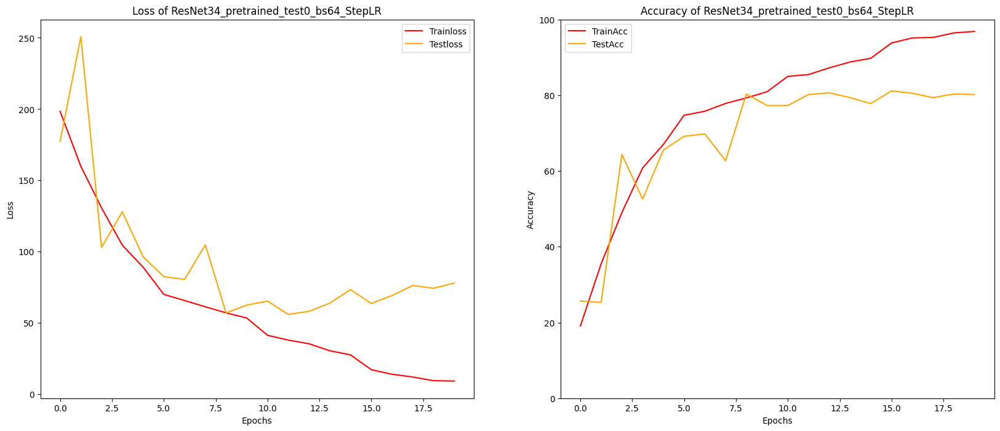

ResNet34_pretrained_test0_bs128_StepLR
	 Train Loss:208.553011, Test Loss:239.650977, Train Acc:17.057%, Test Acc:18.438%
	 Train Loss:174.925700, Test Loss:164.331348, Train Acc:25.495%, Test Acc:31.146%
	 Weight Saved
	 Train Loss:152.180078, Test Loss:322.384310, Train Acc:37.500%, Test Acc:21.250%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:138.080420, Test Loss:146.286361, Train Acc:46.484%, Test Acc:52.500%
	 Weight Saved
	 Train Loss:111.331331, Test Loss:125.231958, Train Acc:59.036%, Test Acc:55.417%
	 Weight Saved
	 Train Loss:80.410913, Test Loss:105.262207, Train Acc:70.677%, Test Acc:61.667%
	 Weight Saved
	 Train Loss:72.246077, Test Loss:62.738920, Train Acc:74.062%, Test Acc:78.125%
	 Weight Saved
	 Train Loss:64.941732, Test Loss:76.666382, Train Acc:76.615%, Test Acc:71.979%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:60.501270, Test Loss:62.855245, Train Acc:77.552%, Test Acc:77.708%
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:57.690861,

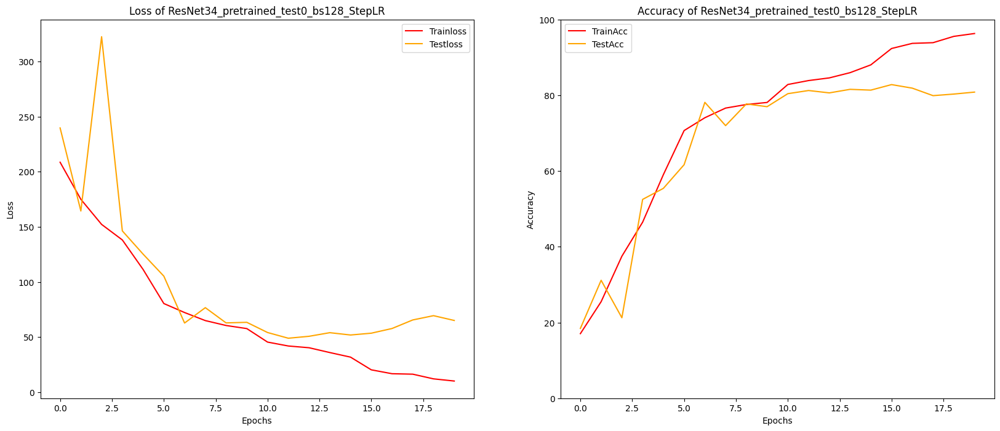

In [196]:
# 使用學習率調度器執行訓練
for bs in [8, 16, 32, 64, 128]:
    trained_epochs = 0
    epochs = 20
    lr=0.001
    step_size=5
    gamma=0.5
    optimizer="RMSprop"
    scheduler="StepLR"
    
    PATH = r"D:\TGI102_AI_BootCamp\AIA_Interview\weights"
    modelname = "ResNet34_pretrained_test0_bs{}_StepLR".format(bs)
    firsttitle = "Loss of " + modelname
    secondtitle = "Accuracy of " + modelname

    print(modelname)
    torch.manual_seed(1412)
    net = m.resnet34(pretrained=True)
    net.fc = torch.nn.Linear(512, 6, bias=True)
    net = net.to(device,non_blocking=True)
    start = time()
    trainloss, testloss, trainacc, testacc = full_procedure_lrscheduler(net, epochs=epochs, bs=bs
                                                                          ,modelname=modelname
                                                                          ,PATH=PATH
                                                                          ,optimizer=optimizer
                                                                          ,lr=lr
                                                                          ,scheduler=scheduler
                                                                          ,step_size=step_size
                                                                          ,gamma=gamma
                                                                          ,patience=15)

    print(modelname)
    print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
    print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
    print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
    print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
    print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
    total_time = time()-start
    print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
    plotgraph(trainloss, testloss, trainacc, testacc, epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle)

ResNet34_pretrained_test0_bs8_StepLR_ep30
Epoch1:[1000/115200(1%)]
Epoch1:[2000/115200(2%)]
Epoch1:[3000/115200(3%)]
	 Train Loss:181.027913, Test Loss:2553.565365, Train Acc:24.219%, Test Acc:24.375%
Epoch2:[4840/115200(4%)]
Epoch2:[5840/115200(5%)]
Epoch2:[6840/115200(6%)]
	 Train Loss:148.559896, Test Loss:4313.353646, Train Acc:39.974%, Test Acc:19.688%
	 NOTICE: Early stopping counter 1 of 15
Epoch3:[8680/115200(8%)]
Epoch3:[9680/115200(8%)]
Epoch3:[10680/115200(9%)]
	 Train Loss:116.358162, Test Loss:84.717985, Train Acc:55.156%, Test Acc:68.125%
	 Weight Saved
Epoch4:[12520/115200(11%)]
Epoch4:[13520/115200(12%)]
Epoch4:[14520/115200(13%)]
	 Train Loss:96.785083, Test Loss:108.952612, Train Acc:63.776%, Test Acc:59.375%
	 NOTICE: Early stopping counter 1 of 15
Epoch5:[16360/115200(14%)]
Epoch5:[17360/115200(15%)]
Epoch5:[18360/115200(16%)]
	 Train Loss:90.328385, Test Loss:87.991382, Train Acc:66.484%, Test Acc:67.500%
	 NOTICE: Early stopping counter 2 of 15
Epoch6:[20200/11520

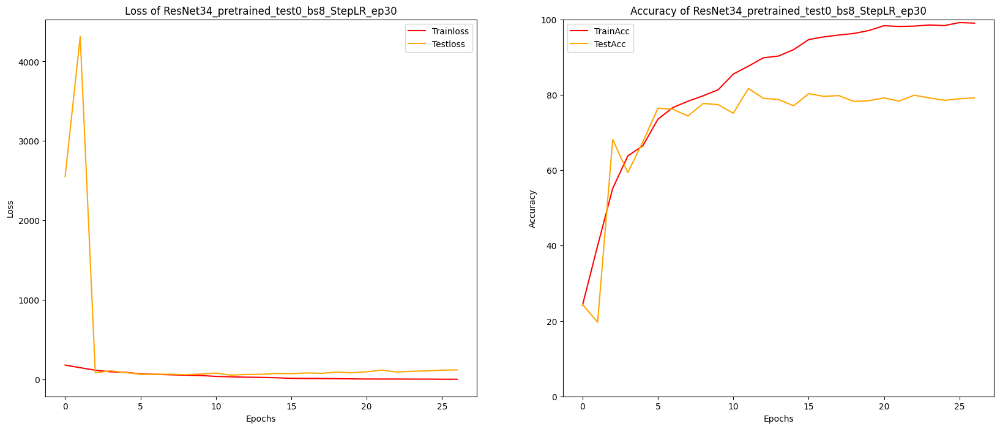

ResNet34_pretrained_test0_bs16_StepLR_ep30
Epoch1:[2000/115200(2%)]
	 Train Loss:175.702523, Test Loss:192.553353, Train Acc:29.349%, Test Acc:23.229%
Epoch2:[5840/115200(5%)]
	 Train Loss:121.873307, Test Loss:169.266276, Train Acc:52.422%, Test Acc:42.917%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:99.329761, Test Loss:100.329980, Train Acc:62.604%, Test Acc:61.771%
	 Weight Saved
Epoch4:[13520/115200(12%)]
	 Train Loss:83.589779, Test Loss:77.055794, Train Acc:69.010%, Test Acc:70.625%
	 Weight Saved
Epoch5:[17360/115200(15%)]
	 Train Loss:76.222445, Test Loss:71.286304, Train Acc:72.240%, Test Acc:72.917%
	 Weight Saved
Epoch6:[21200/115200(18%)]
	 Train Loss:60.321224, Test Loss:57.122009, Train Acc:77.188%, Test Acc:79.375%
	 Weight Saved
Epoch7:[25040/115200(22%)]
	 Train Loss:55.292379, Test Loss:50.502124, Train Acc:79.557%, Test Acc:81.875%
	 Weight Saved
Epoch8:[28880/115200(25%)]
	 Train Loss:50.396981, Test Loss:56.749402, Train Acc:81.458%, Test Acc:78.958%
	 NO

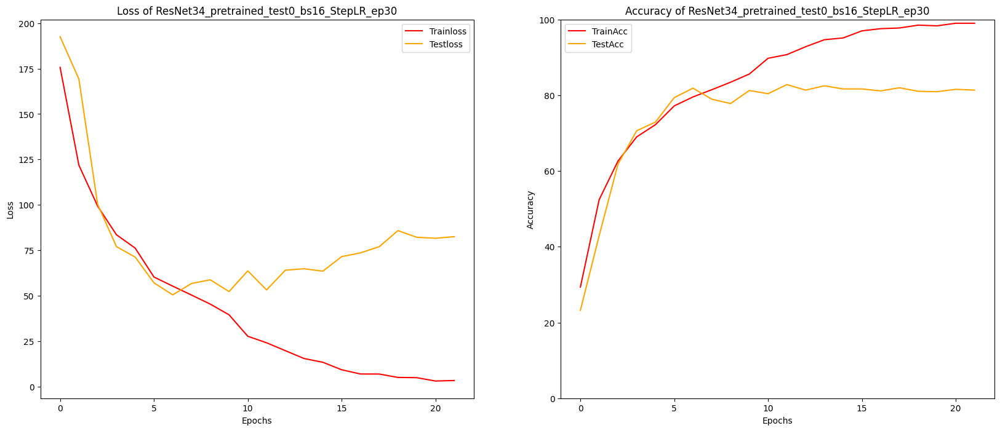

ResNet34_pretrained_test0_bs32_StepLR_ep30
	 Train Loss:188.109489, Test Loss:324.134635, Train Acc:22.422%, Test Acc:18.333%
	 Train Loss:140.282487, Test Loss:342.569336, Train Acc:44.922%, Test Acc:36.875%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:110.623763, Test Loss:120.806771, Train Acc:58.776%, Test Acc:57.917%
	 Weight Saved
	 Train Loss:88.471794, Test Loss:98.609049, Train Acc:67.604%, Test Acc:62.292%
	 Weight Saved
	 Train Loss:78.699373, Test Loss:78.441813, Train Acc:71.146%, Test Acc:70.625%
	 Weight Saved
	 Train Loss:62.162179, Test Loss:71.874609, Train Acc:77.109%, Test Acc:74.375%
	 Weight Saved
	 Train Loss:57.253992, Test Loss:57.242118, Train Acc:78.359%, Test Acc:78.854%
	 Weight Saved
	 Train Loss:52.948283, Test Loss:87.502181, Train Acc:81.328%, Test Acc:69.167%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:47.531868, Test Loss:70.142830, Train Acc:82.109%, Test Acc:76.562%
	 NOTICE: Early stopping counter 2 of 15
	 Train L

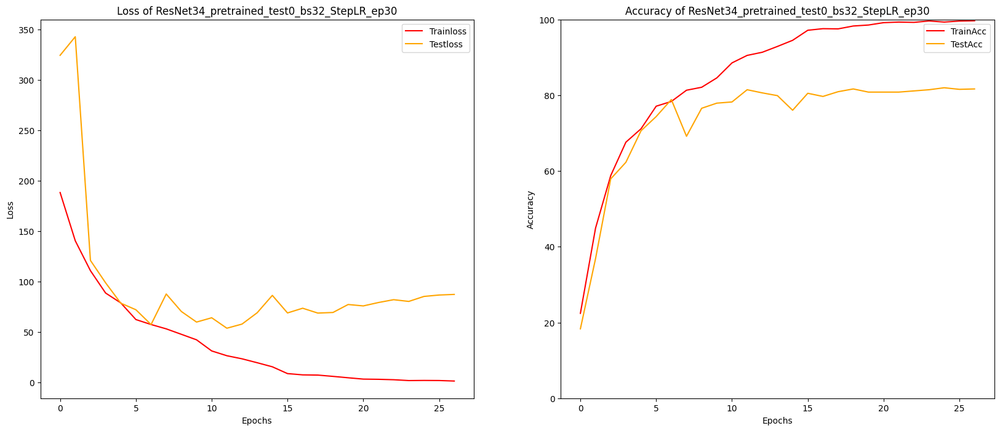

ResNet34_pretrained_test0_bs64_StepLR_ep30
	 Train Loss:192.659359, Test Loss:178.646208, Train Acc:22.865%, Test Acc:30.208%
	 Train Loss:144.593750, Test Loss:192.389469, Train Acc:42.448%, Test Acc:41.458%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:116.909546, Test Loss:164.455518, Train Acc:55.026%, Test Acc:45.104%
	 Weight Saved
	 Train Loss:95.804777, Test Loss:81.746387, Train Acc:65.260%, Test Acc:71.771%
	 Weight Saved
	 Train Loss:81.320931, Test Loss:87.084229, Train Acc:71.068%, Test Acc:70.833%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:63.555444, Test Loss:69.144824, Train Acc:77.057%, Test Acc:75.104%
	 Weight Saved
	 Train Loss:59.581160, Test Loss:57.410229, Train Acc:79.089%, Test Acc:78.333%
	 Weight Saved
	 Train Loss:55.698954, Test Loss:81.506478, Train Acc:79.349%, Test Acc:71.250%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:51.003239, Test Loss:62.087211, Train Acc:81.354%, Test Acc:76.979%
	 NOTICE: Early stopping

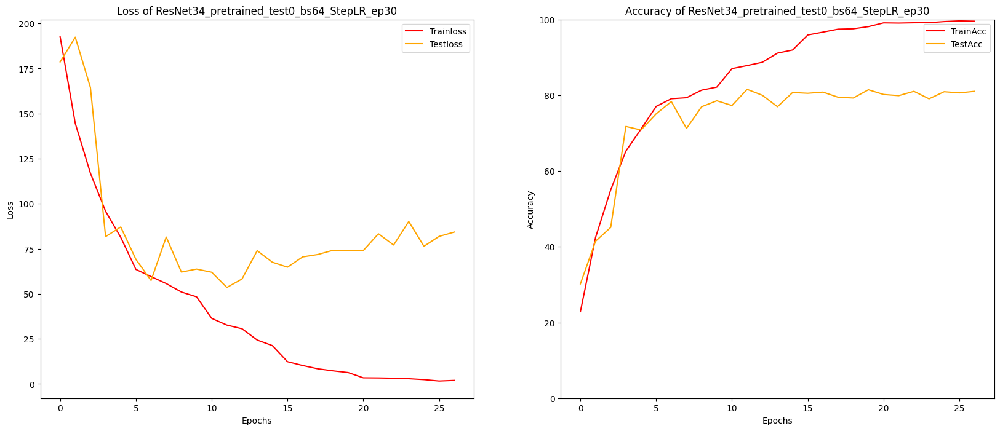

ResNet34_pretrained_test0_bs128_StepLR_ep30
	 Train Loss:208.385791, Test Loss:178.167562, Train Acc:18.932%, Test Acc:24.792%
	 Train Loss:169.836979, Test Loss:179.506982, Train Acc:32.031%, Test Acc:21.562%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:135.749308, Test Loss:469.199154, Train Acc:47.917%, Test Acc:24.375%
	 NOTICE: Early stopping counter 2 of 15
	 Train Loss:114.568050, Test Loss:127.746737, Train Acc:56.771%, Test Acc:54.062%
	 Weight Saved
	 Train Loss:91.988892, Test Loss:144.434033, Train Acc:65.495%, Test Acc:53.750%
	 NOTICE: Early stopping counter 1 of 15
	 Train Loss:72.043962, Test Loss:97.041276, Train Acc:73.073%, Test Acc:66.146%
	 Weight Saved
	 Train Loss:64.464054, Test Loss:82.702108, Train Acc:76.042%, Test Acc:71.458%
	 Weight Saved
	 Train Loss:60.828589, Test Loss:72.059017, Train Acc:77.370%, Test Acc:74.062%
	 Weight Saved
	 Train Loss:57.147998, Test Loss:56.495622, Train Acc:78.490%, Test Acc:78.750%
	 Weight Saved
	 Train Loss:54.2609

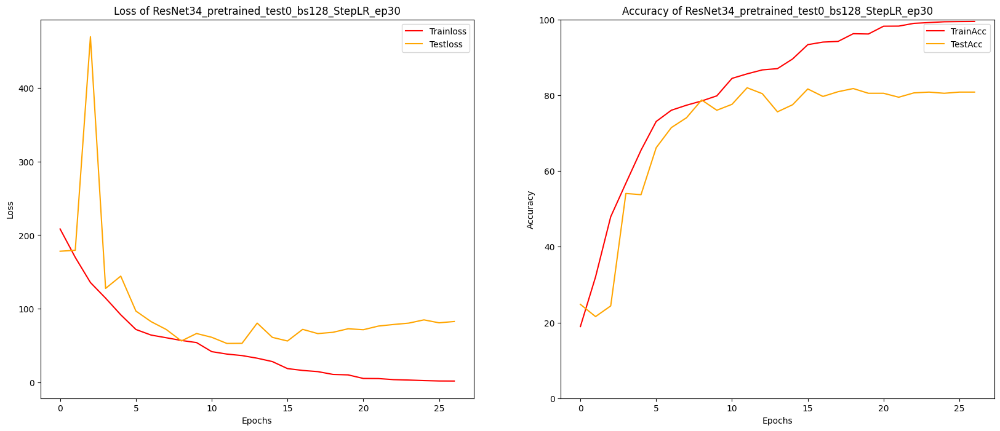

In [197]:
# 使用學習率調度器執行訓練
# 訓練30個epochs
for bs in [8, 16, 32, 64, 128]:
    trained_epochs = 0
    epochs = 30
    lr=0.001
    step_size=5
    gamma=0.5
    optimizer="RMSprop"
    scheduler="StepLR"
    
    PATH = r"D:\TGI102_AI_BootCamp\AIA_Interview\weights"
    modelname = "ResNet34_pretrained_test0_bs{}_StepLR_ep30".format(bs)
    firsttitle = "Loss of " + modelname
    secondtitle = "Accuracy of " + modelname

    print(modelname)
    torch.manual_seed(1412)
    net = m.resnet34(pretrained=True)
    net.fc = torch.nn.Linear(512, 6, bias=True)
    net = net.to(device,non_blocking=True)
    start = time()
    trainloss, testloss, trainacc, testacc = full_procedure_lrscheduler(net, epochs=epochs, bs=bs
                                                                          ,modelname=modelname
                                                                          ,PATH=PATH
                                                                          ,optimizer=optimizer
                                                                          ,lr=lr
                                                                          ,scheduler=scheduler
                                                                          ,step_size=step_size
                                                                          ,gamma=gamma
                                                                          ,patience=15)

    print(modelname)
    print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
    print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
    print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
    print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
    print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
    total_time = time()-start
    print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
    plotgraph(trainloss, testloss, trainacc, testacc, epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle)

使用lr_scheduler_StepLR在testloss方面仍無法改善過擬合。<br>
不論哪一個batchsize的testacc都落在80-82%之間。<br>
<br>
下一步：<br>
1. 更換其他種lr_scheduler
2. 試試看Warm up
3. 加入dropout層
4. 查看一下數據集的分類，看看哪個數據比較難分類，能不能透過數據增強處理，來提升testacc。

#### 重新訓練一個加入dropout層的網路

ResNet34_pretrained_test0_bs128_dp0


C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


	 Train Loss:202.406527, Test Loss:164.819759, Train Acc:23.828%, Test Acc:26.354%
	 Train Loss:163.350553, Test Loss:181.011702, Train Acc:32.474%, Test Acc:24.896%
	 NOTICE: Early stopping counter 1 of 10
	 Train Loss:145.831559, Test Loss:172.260075, Train Acc:41.224%, Test Acc:28.958%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 10
	 Train Loss:131.500464, Test Loss:126.956217, Train Acc:47.188%, Test Acc:48.958%
	 Weight Saved
	 Train Loss:110.494181, Test Loss:100.699032, Train Acc:57.448%, Test Acc:63.229%
	 Weight Saved
	 Train Loss:102.774268, Test Loss:274.577995, Train Acc:60.599%, Test Acc:23.021%
	 NOTICE: Early stopping counter 1 of 10
	 Train Loss:87.811100, Test Loss:83.765145, Train Acc:67.318%, Test Acc:68.750%
	 Weight Saved
	 Train Loss:81.731803, Test Loss:118.781038, Train Acc:68.750%, Test Acc:59.375%
	 NOTICE: Early stopping counter 1 of 10
	 Train Loss:79.093506, Test Loss:81.744808, Train Acc:69.948%, Test Acc:73.646%
	 Weight Saved
	 Train Loss:75.409

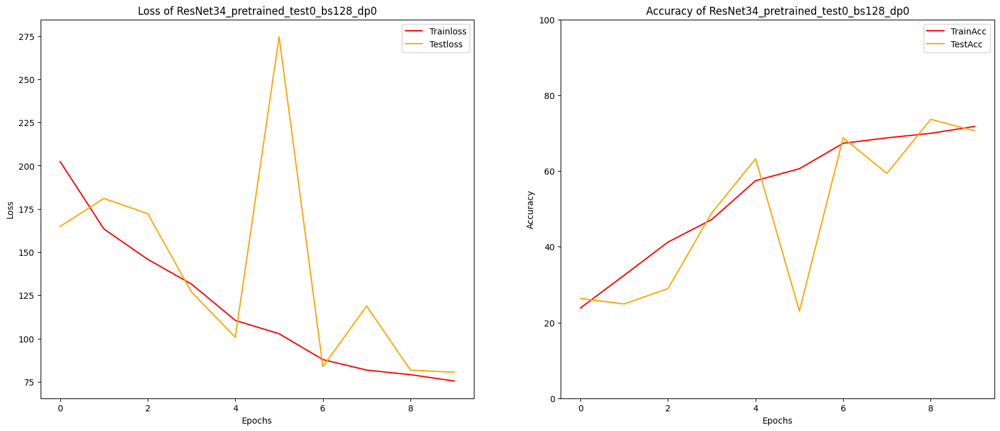

In [38]:
trained_epochs = 0
epochs = 10
bs = 128
lr = 0.001
optimizer="RMSprop"
PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/weights"
fig_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/CurveImages"
csv_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/csv/model_data_csv"
modelname = "ResNet34_pretrained_test0_bs128_dp0"
firsttitle = "Loss of " + modelname
secondtitle = "Accuracy of " + modelname

print(modelname)
torch.manual_seed(1412)
net = m.resnet34(pretrained=True)
net.fc = torch.nn.Sequential(nn.Dropout(p=0),
                             nn.Linear(512, 6, bias=True))
net = net.to(device,non_blocking=True)
    
    
start = time()
trainloss, testloss, trainacc, testacc = full_procedure(net,epochs=epochs, bs=bs
                                             ,modelname=modelname
                                             ,PATH = PATH
                                             ,lr=lr
                                             ,tol = 10**(-10)
                                             ,patience=10)

print(modelname)
print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
total_time = time()-start
print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
save_data_csv(save_PATH=csv_PATH, filename=modelname, modelname=modelname, trainloss=trainloss, testloss=testloss, 
              trainacc=trainacc, testacc=testacc, total_time=total_time, trained_epochs=trained_epochs)
plotgraph(trainloss, testloss, trainacc, testacc, 
          epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle, save=True, PATH=fig_PATH, filename=modelname)

ResNet34_pretrained_test1_bs128_dp0.1
	 Train Loss:62.764465, Test Loss:51.148112, Train Acc:76.276%, Test Acc:81.979%
	 Train Loss:55.195707, Test Loss:49.294291, Train Acc:79.870%, Test Acc:81.458%
	 Train Loss:52.846493, Test Loss:47.221912, Train Acc:79.661%, Test Acc:81.979%
	 Train Loss:50.467513, Test Loss:49.017566, Train Acc:80.755%, Test Acc:81.667%
	 NOTICE: Early stopping counter 1 of 30
	 Train Loss:49.756421, Test Loss:46.795081, Train Acc:81.849%, Test Acc:83.229%
	 Weight Saved
	 Train Loss:48.810649, Test Loss:45.807914, Train Acc:81.458%, Test Acc:83.021%
	 Train Loss:46.528630, Test Loss:47.008175, Train Acc:82.526%, Test Acc:82.083%
	 NOTICE: Early stopping counter 1 of 30
	 Train Loss:44.977140, Test Loss:45.225793, Train Acc:83.151%, Test Acc:82.188%
	 Train Loss:44.405701, Test Loss:43.823515, Train Acc:82.760%, Test Acc:83.438%
	 Weight Saved
	 Train Loss:43.666720, Test Loss:47.596493, Train Acc:82.969%, Test Acc:82.604%
	 NOTICE: Early stopping counter 1 of 30

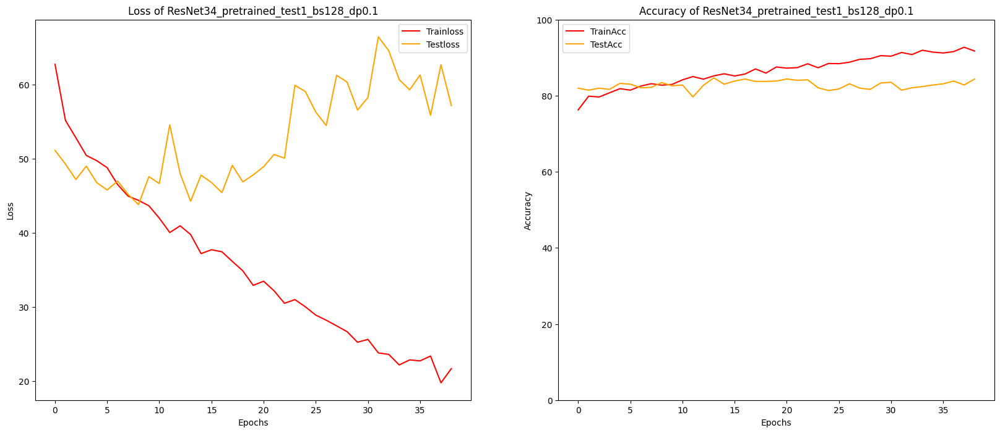

In [40]:
trained_epochs = 10
epochs = 40
bs = 128
lr = 0.0001
optimizer="RMSprop"
PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/weights"
fig_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/CurveImages"
csv_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/csv/model_data_csv"
modelname = "ResNet34_pretrained_test1_bs128_dp0.1"
firsttitle = "Loss of " + modelname
secondtitle = "Accuracy of " + modelname

print(modelname)
torch.manual_seed(1412)
net = m.resnet34(weights=None)
net.fc = torch.nn.Sequential(nn.Dropout(p=0.1),
                             nn.Linear(512, 6, bias=True))
net.load_state_dict(torch.load(os.path.join(PATH, "ResNet34_pretrained_test0_bs128_dp0.pt")))
net = net.to(device,non_blocking=True)
    
    
start = time()
trainloss, testloss, trainacc, testacc = full_procedure(net,epochs=epochs, bs=bs
                                             ,modelname=modelname
                                             ,PATH = PATH
                                             ,lr=lr
                                             ,tol = 10**(-10)
                                             ,patience=30)

print(modelname)
print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
total_time = time()-start
print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
save_data_csv(save_PATH=csv_PATH, filename=modelname, modelname=modelname, trainloss=trainloss, testloss=testloss, 
              trainacc=trainacc, testacc=testacc, total_time=total_time, trained_epochs=trained_epochs)
plotgraph(trainloss, testloss, trainacc, testacc, 
          epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle, save=True, PATH=fig_PATH, filename=modelname)

**ResNet34_pretrained_test0_bs128_lr0.0001** <br>
Total trained epochs: 17 <br>
Max trainacc: 99.870% 	Epoch: 17 <br>
Max testacc: 85.625% 	Epoch: 10 <br>
Mean trainacc: 96.547% <br>
Mean testacc: 82.310% <br>
Running time: 9.0 minutes, 5 seconds. <br>
<br>
**ResNet34_pretrained_test1_bs128_lr0.0001_dp0.1** <br>
lr = 0.001  dropout=0    10 epochs <br>
lr = 0.0001 dropout=0.1  39 epochs <br>
Total trained epochs: 49 <br>
Max trainacc: 92.734% 	Epoch: 38 <br>
Max testacc: 84.688% 	Epoch: 14 <br>
Mean trainacc: 86.571% <br>
Mean testacc: 82.834% <br>
Running time: 27.0 minutes, 19 seconds. <br>

加入dropout層，增加訓練時間，在過了15個epoch後testloss逐漸上升，dropout=0.1無法有效改善過擬合。 <br>
更改dropout=0.2試試看。

ResNet34_pretrained_test1_bs128_dp0.2
	 Train Loss:61.967647, Test Loss:52.731319, Train Acc:76.224%, Test Acc:80.833%
	 Train Loss:57.005693, Test Loss:46.896322, Train Acc:78.958%, Test Acc:83.438%
	 Weight Saved
	 Train Loss:52.496395, Test Loss:49.982902, Train Acc:80.547%, Test Acc:81.250%
	 NOTICE: Early stopping counter 1 of 30
	 Train Loss:49.685645, Test Loss:50.801872, Train Acc:81.562%, Test Acc:81.979%
	 NOTICE: Early stopping counter 2 of 30
	 Train Loss:50.038525, Test Loss:46.654891, Train Acc:81.979%, Test Acc:81.875%
	 Train Loss:49.604871, Test Loss:49.167965, Train Acc:81.406%, Test Acc:81.875%
	 NOTICE: Early stopping counter 1 of 30
	 Train Loss:48.221212, Test Loss:46.816720, Train Acc:81.693%, Test Acc:82.500%
	 NOTICE: Early stopping counter 2 of 30
	 Train Loss:45.090328, Test Loss:48.055514, Train Acc:82.891%, Test Acc:83.333%
	 NOTICE: Early stopping counter 3 of 30
	 Train Loss:46.230680, Test Loss:47.855363, Train Acc:82.474%, Test Acc:83.021%
	 NOTICE: Ear

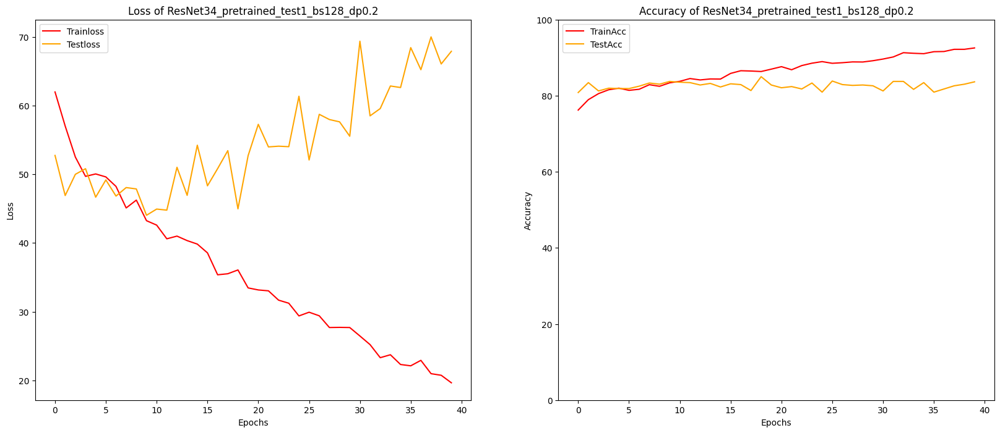

In [41]:
trained_epochs = 10
epochs = 40
bs = 128
lr = 0.0001
optimizer="RMSprop"
PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/weights"
fig_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/CurveImages"
csv_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/csv/model_data_csv"
modelname = "ResNet34_pretrained_test1_bs128_dp0.2"
firsttitle = "Loss of " + modelname
secondtitle = "Accuracy of " + modelname

print(modelname)
torch.manual_seed(1412)
net = m.resnet34(weights=None)
net.fc = torch.nn.Sequential(nn.Dropout(p=0.2),
                             nn.Linear(512, 6, bias=True))
net.load_state_dict(torch.load(os.path.join(PATH, "ResNet34_pretrained_test0_bs128_dp0.pt")))
net = net.to(device,non_blocking=True)
    
    
start = time()
trainloss, testloss, trainacc, testacc = full_procedure(net,epochs=epochs, bs=bs
                                             ,modelname=modelname
                                             ,PATH = PATH
                                             ,lr=lr
                                             ,tol = 10**(-10)
                                             ,patience=30)

print(modelname)
print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
total_time = time()-start
print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
save_data_csv(save_PATH=csv_PATH, filename=modelname, modelname=modelname, trainloss=trainloss, testloss=testloss, 
              trainacc=trainacc, testacc=testacc, total_time=total_time, trained_epochs=trained_epochs)
plotgraph(trainloss, testloss, trainacc, testacc, 
          epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle, save=True, PATH=fig_PATH, filename=modelname)

**ResNet34_pretrained_test1_bs128_lr0.0001_dp0.1** <br>
lr = 0.001 dropout=0 10 epochs <br>
lr = 0.0001 dropout=0.1 39 epochs <br>
Total trained epochs: 49 <br>
Max trainacc: 92.734% Epoch: 38 <br>
Max testacc: 84.688% Epoch: 14 <br>
Mean trainacc: 86.571% <br>
Mean testacc: 82.834% <br>
Running time: 27.0 minutes, 19 seconds. <br>
<br>
**ResNet34_pretrained_test1_bs128_lr0.0001_dp0.2** <br>
lr = 0.001 dropout=0 10 epochs <br>
lr = 0.0001 dropout=0.2 40 epochs <br>
Total trained epochs: 50 <br>
Max trainacc: 92.552% 	Epoch: 40 <br>
Max testacc: 85.000% 	Epoch: 19 <br>
Mean trainacc: 86.549% <br>
Mean testacc: 82.641% <br>
Running time: 27.0 minutes, 8 seconds. <br>

dropout=0.2比dropout=0.1更早，在過了10個epoch後testloss就逐漸上升，且上升幅度更甚於dropout=0.1，dropout=0.2無法有效改善過擬合。 <br>

下一步： <br>
查看一下數據集的分類，看看哪個數據比較難分類，能不能透過數據增強處理，來提升testacc。

### 觀察分錯的類別

In [67]:
# net
model_path = "D:/TGI102_AI_BootCamp/AIA_Interview/weights/ResNet34"
model_weights_name = "ResNet34_pretrained_test0_bs128_lr0.0001.pt"

resnet = m.resnet34(weights=None)
resnet.fc = torch.nn.Linear(512, 6, bias=True)
resnet.load_state_dict(torch.load(os.path.join(model_path, model_weights_name)))
resnet = resnet.to(device, non_blocking=True)
resnet.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [68]:
transform_val = transforms.Compose([transforms.Resize((256, 256)),
                                      transforms.CenterCrop(224), 
                                      transforms.ToTensor(),
                                      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                                        ])

In [69]:
val_dataset = torchvision.datasets.ImageFolder(root="D:\\TGI102_AI_BootCamp\\AIA_Interview\\SplitDatasets\\valset\\", 
                                           transform=transform_val
                                            )

In [70]:
val_dataset

Dataset ImageFolder
    Number of datapoints: 960
    Root location: D:\TGI102_AI_BootCamp\AIA_Interview\SplitDatasets\valset\
    StandardTransform
Transform: Compose(
               Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=None)
               CenterCrop(size=(224, 224))
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

In [71]:
def predictLabels(net, x, y):
    """
    對一組數據進行測試並輸出測試結果標籤的函數
    
    net：經過訓練後的架構
    x：要測試的數據的所有樣本
    y：要測試的數據的真實標籤
    """
    with torch.no_grad(): 
        sigma = net.forward(x)
        yhat = torch.argmax(sigma,1)
        
        correct = (yhat == y)
        correct_predict_label = yhat[correct].to("cpu").tolist()
        correct_true_label = y[correct].to("cpu").tolist()
        
        incorrect = (yhat != y)  # bool
        incorrect_predict_label = yhat[incorrect].to("cpu").tolist()
        incorrect_true_label = y[incorrect].to("cpu").tolist()
        
    return correct_predict_label, correct_true_label, incorrect_predict_label, incorrect_true_label

In [72]:
def predictionForAllSamples(net, testdata, bs=32):    
    net.eval()
    
    testdata = DataLoader(val_dataset, batch_size=bs, shuffle=False, drop_last=False)
    
    correct_predictlabels = []
    correct_truelabels = []
    incorrect_predictlabels = []
    incorrect_truelabels = []

    for x,y in testdata:
        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True).view(x.shape[0])
        
        correct_predict_label, correct_true_label, incorrect_predict_label, incorrect_true_label = predictLabels(net,x,y)
        
        correct_predictlabels = correct_predictlabels + correct_predict_label
        correct_truelabels = correct_truelabels + correct_true_label
        incorrect_predictlabels = incorrect_predictlabels + incorrect_predict_label
        incorrect_truelabels = incorrect_truelabels + incorrect_true_label

        
    torch.cuda.empty_cache()

            
    print("Complete!")
    return correct_predictlabels, correct_truelabels, incorrect_predictlabels, incorrect_truelabels

In [73]:
correct_predictlabels, correct_truelabels, incorrect_predictlabels, incorrect_truelabels = predictionForAllSamples(resnet,
                                                                                                                   val_dataset)

Complete!


In [74]:
incorrect_predictlabels

[1,
 5,
 1,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 3,
 3,
 0,
 3,
 3,
 4,
 5,
 3,
 4,
 3,
 5,
 0,
 5,
 5,
 3,
 5,
 3,
 5,
 3,
 3,
 5,
 3,
 4,
 3,
 5,
 3,
 5,
 5,
 5,
 5,
 3,
 3,
 4,
 5,
 4,
 4,
 3,
 4,
 5,
 1,
 1,
 5,
 1,
 1,
 1,
 5,
 5,
 5,
 4,
 2,
 2,
 5,
 5,
 4,
 2,
 1,
 2,
 1,
 5,
 1,
 5,
 5,
 2,
 1,
 1,
 2,
 0,
 5,
 5,
 1,
 5,
 2,
 0,
 1,
 0,
 0,
 5,
 0,
 0,
 2,
 2,
 5,
 0,
 0,
 3,
 0,
 4,
 3,
 4,
 1,
 4,
 0,
 1,
 0,
 4,
 0,
 4,
 1,
 0,
 2,
 3,
 3,
 4,
 1,
 0,
 4,
 4,
 1,
 4,
 0,
 3,
 4,
 4,
 0,
 1,
 3,
 2,
 2,
 1,
 0,
 0,
 4,
 1,
 4,
 3,
 0,
 4,
 0]

In [75]:
incorrect_truelabels

[0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5]

In [76]:
df_incorrect = pd.DataFrame({"PredictLabel": incorrect_predictlabels, "Truelabel": incorrect_truelabels})
df_incorrect.head()

,PredictLabel,Truelabel
0,1,0
1,5,0
2,1,0
3,5,0
4,5,0


In [77]:
df_incorrect.value_counts()

PredictLabel  Truelabel
4             5            14
0             5            12
5             1            11
              3            10
3             2             8
1             3             8
              5             8
3             1             8
0             4             8
3             5             7
5             2             7
4             2             5
5             4             5
2             4             5
              3             4
1             4             4
2             5             3
5             0             3
4             1             2
              3             2
1             0             2
0             1             2
dtype: int64

In [78]:
mapping_df = pd.read_csv(r"D:\TGI102_AI_BootCamp\AIA_Interview\csv\mapping.csv").set_index(keys="class")
mapping_df

,fileName
class,
0,bald
1,black_hair
2,blond_hair
3,brown_hair
4,gray_hair
5,receding_hairline


In [79]:
df_incorrect["PredictLabel"] = df_incorrect["PredictLabel"].map(mapping_df.iloc[:,0])
df_incorrect["Truelabel"] = df_incorrect["Truelabel"].map(mapping_df.iloc[:,0])

In [81]:
df_incorrect.head()

,PredictLabel,Truelabel
0,black_hair,bald
1,receding_hairline,bald
2,black_hair,bald
3,receding_hairline,bald
4,receding_hairline,bald


In [82]:
df_incorrect.value_counts()

PredictLabel       Truelabel        
gray_hair          receding_hairline    14
bald               receding_hairline    12
receding_hairline  black_hair           11
                   brown_hair           10
brown_hair         blond_hair            8
black_hair         brown_hair            8
                   receding_hairline     8
brown_hair         black_hair            8
bald               gray_hair             8
brown_hair         receding_hairline     7
receding_hairline  blond_hair            7
gray_hair          blond_hair            5
receding_hairline  gray_hair             5
blond_hair         gray_hair             5
                   brown_hair            4
black_hair         gray_hair             4
blond_hair         receding_hairline     3
receding_hairline  bald                  3
gray_hair          black_hair            2
                   brown_hair            2
black_hair         bald                  2
bald               black_hair            2
dtype: int64

在分類錯誤的類別中，receding_hairline和其他類別最難分類正確，其次是黑、褐、金髮這種和顏色相關的分類。 <br>
針對receding_hairline用隨機剪切縮放等方式來增加數據量。 <br>
針對顏色相關分類錯誤在colorjitter增加隨機範圍。 <br>
另外觀察到testset有一些上下半部用edge填充的圖像，所以透過edgepadding來增加該種數據量。 <br>

### 在數據增強部分增加新的增強手段

In [17]:
edgepadding_up = transforms.Compose([
                            transforms.CenterCrop(150),
                            transforms.Pad(padding=(0, 70, 0, 0), fill=0, padding_mode="edge"),
                            transforms.Resize((224, 224)),
                            transforms.ToTensor()
                           ])

In [346]:
edgepadding_down = transforms.Compose([transforms.CenterCrop(190),
                                       transforms.Pad(padding=(0, 0, 0, 30), fill=0, padding_mode="edge"),
                                       transforms.Resize((224, 224)),
                                       transforms.ToTensor()
                                    ])

(3, 224, 224)


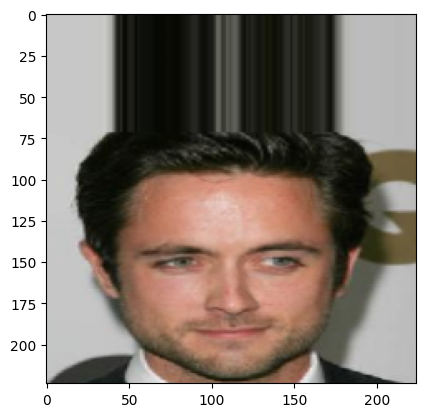

In [18]:
trainDir = "D:/TGI102_AI_BootCamp/AIA_Interview/datasets/trainset/Black_Hair_800/"
name = "00a57db50e394dc3.png"
image = Image.open(trainDir+name).convert("RGB")
preprocessed_image = edgepadding_up(image)
npimg = torchvision.utils.make_grid(preprocessed_image).numpy()
print(npimg.shape)
plt.imshow(np.transpose(npimg, (1, 2, 0)))  # visualize preprocessed_image

In [16]:
randomResizedCrop_ = transforms.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=2)
randomAffine_ = transforms.RandomAffine(degrees=0, translate=(0.05, 0.05), scale=None, shear=(3, 3), resample=False, fillcolor=0)
edgepadding_up = transforms.Compose([transforms.CenterCrop(150),
                                     transforms.Pad(padding=(0, 70, 0, 0), fill=0, padding_mode="edge"),
                                     transforms.Resize((224, 224)),
                                    ])
edgepadding_down = transforms.Compose([transforms.CenterCrop(190),
                                       transforms.Pad(padding=(0, 0, 0, 30), fill=0, padding_mode="edge"),
                                       transforms.Resize((224, 224)),
                                    ])

# transform2
transform_train_ = transforms.Compose([transforms.Resize((256, 256)),
                                      transforms.CenterCrop(224),
                                      transforms.RandomHorizontalFlip(p=0.5),
                                      transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.5, hue=0.1),
                                      transforms.RandomRotation(degrees = [-5,5]),
                                      transforms.RandomChoice([randomResizedCrop_,  randomAffine_]), 
                                      transforms.RandomApply([edgepadding_up], p=0.3),
                                      transforms.RandomApply([edgepadding_down], p=0.1),
                                      transforms.ToTensor(),
                                      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                                        ])

C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\transforms\transforms.py:891: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  warnings.warn(
C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\transforms\transforms.py:1427: UserWarning: The parameter 'resample' is deprecated since 0.12 and will be removed in 0.14. Please use 'interpolation' instead.
  warnings.warn(
C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\transforms\transforms.py:1442: UserWarning: The parameter 'fillcolor' is deprecated since 0.12 and will be removed in 0.14. Please use 'fill' instead.
  warnings.warn(


In [17]:
train_dataset = torchvision.datasets.ImageFolder(root="D:\\TGI102_AI_BootCamp\\AIA_Interview\\SplitDatasets\\trainset\\", 
                                           transform=transform_train_
                                            )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

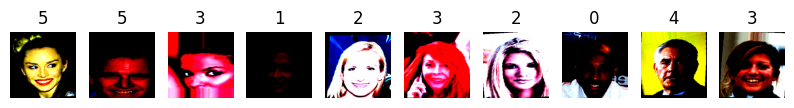

In [18]:
plotsample(train_dataset)

In [19]:
transform_val_ = transforms.Compose([transforms.Resize((256, 256)),
                                      transforms.CenterCrop(224), 
                                      transforms.ToTensor(),
                                      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                                        ])

In [20]:
val_dataset = torchvision.datasets.ImageFolder(root="D:\\TGI102_AI_BootCamp\\AIA_Interview\\SplitDatasets\\valset\\", 
                                           transform=transform_val_
                                            )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

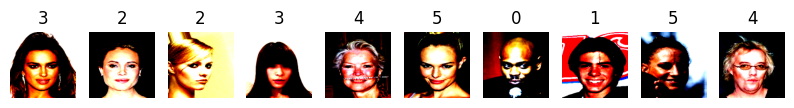

In [21]:
plotsample(val_dataset)

ResNet34_pretrained_transform2_test0_bs8_lr0.001
Epoch1:[1000/115200(1%)]
Epoch1:[2000/115200(2%)]
Epoch1:[3000/115200(3%)]
	 Train Loss:178.247038, Test Loss:165.053630, Train Acc:24.844%, Test Acc:27.812%
Epoch2:[4840/115200(4%)]
Epoch2:[5840/115200(5%)]
Epoch2:[6840/115200(6%)]
	 Train Loss:162.308724, Test Loss:163.882975, Train Acc:31.276%, Test Acc:35.312%
	 Weight Saved
Epoch3:[8680/115200(8%)]
Epoch3:[9680/115200(8%)]
Epoch3:[10680/115200(9%)]
	 Train Loss:155.205876, Test Loss:125.594596, Train Acc:36.198%, Test Acc:48.438%
	 Weight Saved
Epoch4:[12520/115200(11%)]
Epoch4:[13520/115200(12%)]
Epoch4:[14520/115200(13%)]
	 Train Loss:134.183366, Test Loss:103.106299, Train Acc:47.005%, Test Acc:65.104%
	 Weight Saved
Epoch5:[16360/115200(14%)]
Epoch5:[17360/115200(15%)]
Epoch5:[18360/115200(16%)]
	 Train Loss:114.887240, Test Loss:97.296297, Train Acc:55.625%, Test Acc:61.458%
Epoch6:[20200/115200(18%)]
Epoch6:[21200/115200(18%)]
Epoch6:[22200/115200(19%)]
	 Train Loss:106.406413

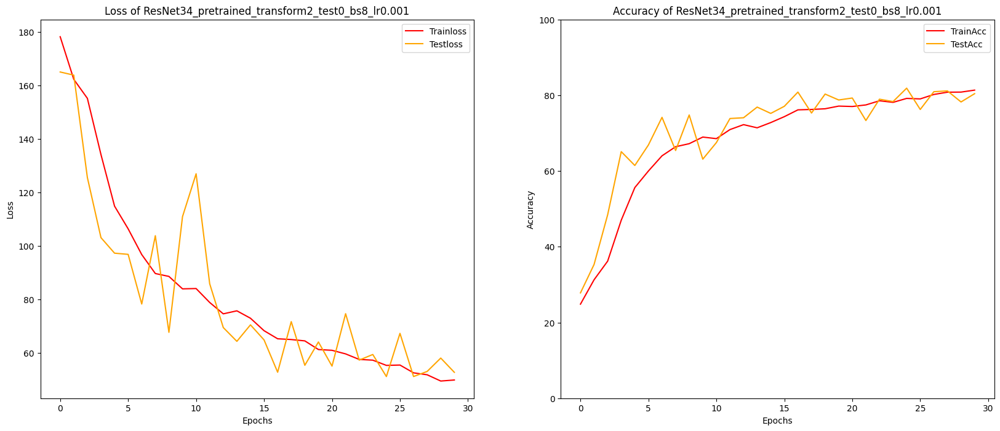

ResNet34_pretrained_transform2_test0_bs16_lr0.001


C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch1:[2000/115200(2%)]
	 Train Loss:178.634229, Test Loss:154.136410, Train Acc:25.443%, Test Acc:36.771%
Epoch2:[5840/115200(5%)]
	 Train Loss:146.056820, Test Loss:168.843669, Train Acc:39.583%, Test Acc:40.000%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
Epoch3:[9680/115200(8%)]
	 Train Loss:122.123999, Test Loss:403.505046, Train Acc:52.995%, Test Acc:43.958%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 20
Epoch4:[13520/115200(12%)]
	 Train Loss:105.201001, Test Loss:83.745426, Train Acc:60.208%, Test Acc:71.042%
	 Weight Saved
Epoch5:[17360/115200(15%)]
	 Train Loss:95.370711, Test Loss:86.639437, Train Acc:63.698%, Test Acc:67.083%
	 NOTICE: Early stopping counter 1 of 20
Epoch6:[21200/115200(18%)]
	 Train Loss:90.681274, Test Loss:65.816109, Train Acc:66.562%, Test Acc:76.250%
	 Weight Saved
Epoch7:[25040/115200(22%)]
	 Train Loss:84.083309, Test Loss:66.316292, Train Acc:69.844%, Test Acc:77.292%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
Epoc

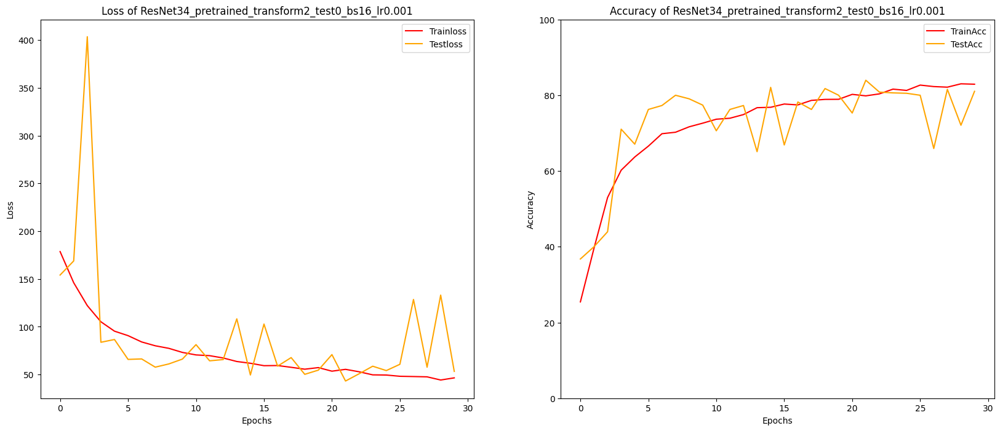

ResNet34_pretrained_transform2_test0_bs32_lr0.001


C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


	 Train Loss:188.789518, Test Loss:178.020931, Train Acc:22.656%, Test Acc:22.708%
	 Train Loss:158.671094, Test Loss:142.183480, Train Acc:34.844%, Test Acc:44.688%
	 Weight Saved
	 Train Loss:144.343050, Test Loss:155.119954, Train Acc:41.615%, Test Acc:38.646%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:123.445321, Test Loss:128.188525, Train Acc:50.677%, Test Acc:50.833%
	 Weight Saved
	 Train Loss:108.716357, Test Loss:99.296899, Train Acc:59.427%, Test Acc:61.562%
	 Weight Saved
	 Train Loss:95.683008, Test Loss:122.922144, Train Acc:64.062%, Test Acc:57.292%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:90.880347, Test Loss:72.319116, Train Acc:66.042%, Test Acc:73.229%
	 Weight Saved
	 Train Loss:83.948503, Test Loss:73.470825, Train Acc:68.880%, Test Acc:73.542%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:78.700708, Test Loss:76.797518, Train Acc:71.432%, Test Acc:71.667%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:75.186027

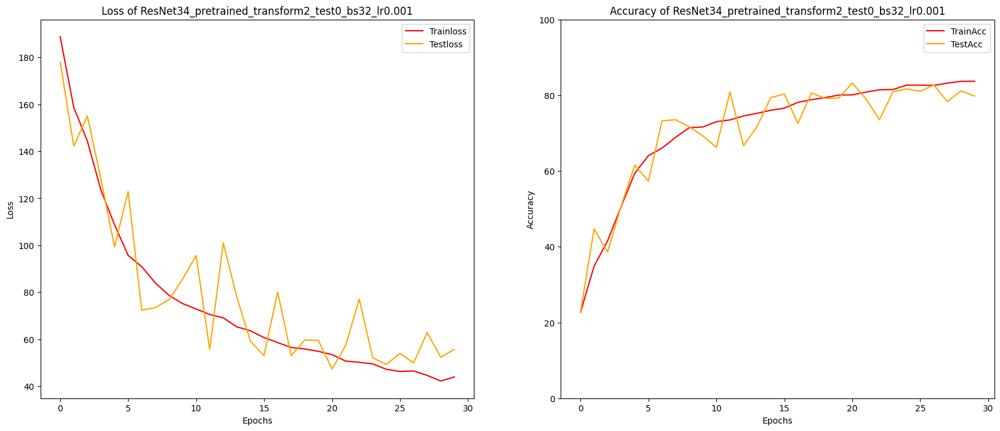

ResNet34_pretrained_transform2_test0_bs64_lr0.001


C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


	 Train Loss:192.352897, Test Loss:169.143750, Train Acc:21.641%, Test Acc:28.125%
	 Train Loss:162.165967, Test Loss:158.487988, Train Acc:32.969%, Test Acc:34.375%
	 Weight Saved
	 Train Loss:145.361410, Test Loss:148.129378, Train Acc:41.198%, Test Acc:39.167%
	 Weight Saved
	 Train Loss:126.944149, Test Loss:145.322087, Train Acc:50.026%, Test Acc:41.771%
	 Weight Saved
	 Train Loss:111.232983, Test Loss:119.185482, Train Acc:58.411%, Test Acc:53.333%
	 Weight Saved
	 Train Loss:95.015682, Test Loss:127.540039, Train Acc:65.182%, Test Acc:60.104%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:83.942708, Test Loss:313.651790, Train Acc:68.646%, Test Acc:68.125%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:77.735938, Test Loss:177.396403, Train Acc:70.885%, Test Acc:47.188%
	 NOTICE: Early stopping counter 3 of 20
	 Train Loss:71.653654, Test Loss:104.669873, Train Acc:73.802%, Test Acc:64.688%
	 Train Loss:66.800513, Test Loss:72.205623,

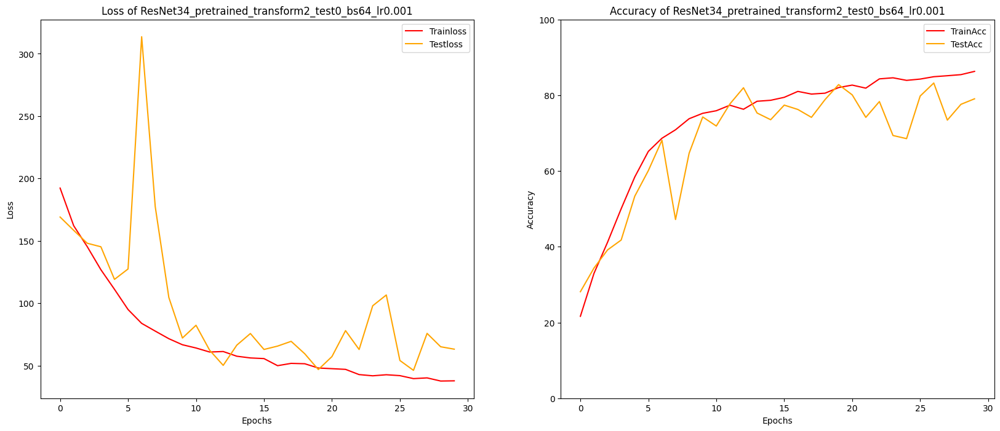

ResNet34_pretrained_transform2_test0_bs128_lr0.001


C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


	 Train Loss:204.365641, Test Loss:217.243457, Train Acc:20.885%, Test Acc:28.750%
	 Train Loss:164.745345, Test Loss:170.184831, Train Acc:33.516%, Test Acc:28.438%
	 Train Loss:153.514225, Test Loss:142.730046, Train Acc:38.542%, Test Acc:42.083%
	 Weight Saved
	 Train Loss:134.596859, Test Loss:152.702083, Train Acc:46.953%, Test Acc:38.750%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:113.268953, Test Loss:119.707235, Train Acc:56.615%, Test Acc:51.979%
	 Weight Saved
	 Train Loss:102.557349, Test Loss:119.303678, Train Acc:61.406%, Test Acc:55.729%
	 Weight Saved
	 Train Loss:97.148560, Test Loss:107.798714, Train Acc:63.646%, Test Acc:60.104%
	 Weight Saved
	 Train Loss:86.856022, Test Loss:101.400163, Train Acc:67.057%, Test Acc:61.042%
	 Weight Saved
	 Train Loss:83.009009, Test Loss:75.484473, Train Acc:68.724%, Test Acc:72.083%
	 Weight Saved
	 Train Loss:75.660384, Test Loss:102.496908, Train Acc:71.641%, Test Acc:67.188%
	 NOTICE: Early stopping counter 1 of 20
	 T

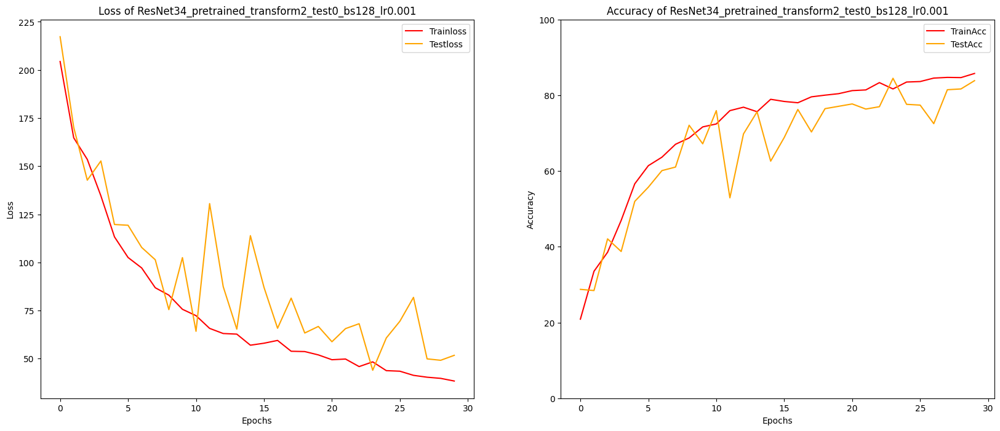

In [48]:
# 使用不同batch_size, 預設的lr=0.001, 訓練30個epochs看看效果
for bs in [8, 16, 32, 64, 128]:
    lr = 0.001
    trained_epochs = 0
    epochs = 30
    optimizer="RMSprop"
    PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/weights"
    fig_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/CurveImages"
    csv_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/csv/model_data_csv"
    modelname = "ResNet34_pretrained_transform2_test0_bs{}_lr{}".format(bs, lr)
    firsttitle = "Loss of " + modelname
    secondtitle = "Accuracy of " + modelname

    print(modelname)
    torch.manual_seed(1412)
    net = m.resnet34(pretrained=True)
    net.fc = torch.nn.Linear(512, 6, bias=True)
    net = net.to(device,non_blocking=True)
    start = time()
    trainloss, testloss, trainacc, testacc = full_procedure(net, epochs=epochs, bs=bs, 
                                                            modelname=modelname, 
                                                            PATH=PATH, 
                                                            optimizer=optimizer, 
                                                            lr=lr, 
                                                            patience=20)

    print(modelname)
    print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
    print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
    print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
    print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
    print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
    total_time = time()-start
    print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
    save_data_csv(save_PATH=csv_PATH, filename=modelname, modelname=modelname, trainloss=trainloss, testloss=testloss, 
                  trainacc=trainacc, testacc=testacc, total_time=total_time, trained_epochs=trained_epochs)
    plotgraph(trainloss, testloss, trainacc, testacc, 
              epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle, save=True, PATH=fig_PATH, filename=modelname)

在使用新的數據增強組合訓練30 epochs之後，和先前的數據增強組合比起來，不論是哪一個batchsize的trainloss/testloss都逐步下降。 <br>
雖然testloss看起來是不穩定的下降（可能是數據增強手段太多，訓練測試集落差有點大），但尚未看到過擬合情況發生。 <br>
可以再訓練更多個epochs來看看能不能提升最終testacc。 <br>
使用lr_scheduler，起始lr=0.001（和先前訓練30 epochs的lr相同），逐步下降lr穩定疊代。

ResNet34_pretrained_transform2_test1_bs8_StepLR
Epoch1:[1000/115200(1%)]
Epoch1:[2000/115200(2%)]
Epoch1:[3000/115200(3%)]
	 Train Loss:58.358435, Test Loss:60.372021, Train Acc:78.464%, Test Acc:78.333%
Epoch2:[4840/115200(4%)]
Epoch2:[5840/115200(5%)]
Epoch2:[6840/115200(6%)]
	 Train Loss:53.539856, Test Loss:52.368591, Train Acc:80.182%, Test Acc:80.833%
	 Weight Saved
Epoch3:[8680/115200(8%)]
Epoch3:[9680/115200(8%)]
Epoch3:[10680/115200(9%)]
	 Train Loss:51.137703, Test Loss:49.847013, Train Acc:80.391%, Test Acc:81.354%
	 Weight Saved
Epoch4:[12520/115200(11%)]
Epoch4:[13520/115200(12%)]
Epoch4:[14520/115200(13%)]
	 Train Loss:49.780538, Test Loss:53.450509, Train Acc:80.859%, Test Acc:81.458%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
Epoch5:[16360/115200(14%)]
Epoch5:[17360/115200(15%)]
Epoch5:[18360/115200(16%)]
	 Train Loss:49.821875, Test Loss:54.188595, Train Acc:81.771%, Test Acc:80.729%
	 NOTICE: Early stopping counter 2 of 20
Epoch6:[20200/115200(18%)]
Epoch

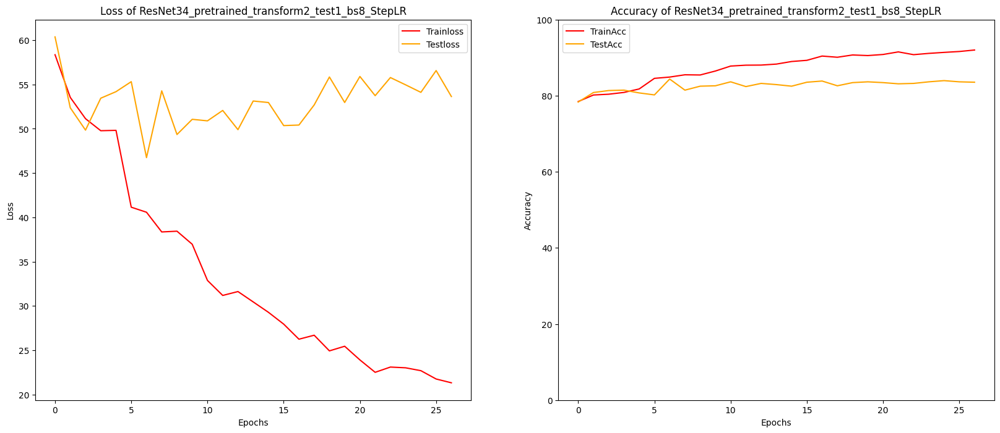

ResNet34_pretrained_transform2_test1_bs16_StepLR
Epoch1:[2000/115200(2%)]
	 Train Loss:63.895614, Test Loss:58.815751, Train Acc:76.146%, Test Acc:77.917%
Epoch2:[5840/115200(5%)]
	 Train Loss:52.713350, Test Loss:56.454875, Train Acc:80.339%, Test Acc:80.104%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:50.150590, Test Loss:56.559823, Train Acc:80.885%, Test Acc:80.521%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
Epoch4:[13520/115200(12%)]
	 Train Loss:48.803324, Test Loss:65.174943, Train Acc:81.302%, Test Acc:77.604%
	 NOTICE: Early stopping counter 2 of 20
Epoch5:[17360/115200(15%)]
	 Train Loss:47.562085, Test Loss:65.064486, Train Acc:82.135%, Test Acc:76.458%
	 NOTICE: Early stopping counter 3 of 20
Epoch6:[21200/115200(18%)]
	 Train Loss:39.082528, Test Loss:44.618241, Train Acc:85.052%, Test Acc:83.438%
	 Weight Saved
Epoch7:[25040/115200(22%)]
	 Train Loss:36.529806, Test Loss:48.266846, Train Acc:85.677%, Test Acc:83.438%
	 NOTICE: Early stopping counter 

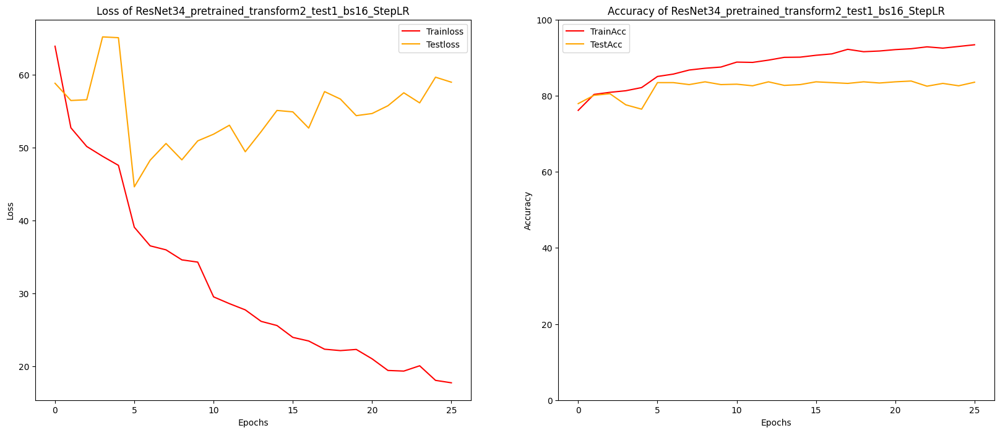

ResNet34_pretrained_transform2_test1_bs32_StepLR
	 Train Loss:70.618123, Test Loss:82.405086, Train Acc:74.193%, Test Acc:71.146%
	 Train Loss:53.223332, Test Loss:66.326896, Train Acc:80.182%, Test Acc:76.146%
	 Weight Saved
	 Train Loss:49.922339, Test Loss:54.444775, Train Acc:81.432%, Test Acc:81.458%
	 Weight Saved
	 Train Loss:49.137101, Test Loss:56.331254, Train Acc:81.458%, Test Acc:78.958%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:48.590531, Test Loss:56.544718, Train Acc:81.667%, Test Acc:80.104%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:41.495194, Test Loss:51.710531, Train Acc:84.766%, Test Acc:81.979%
	 Weight Saved
	 Train Loss:38.322795, Test Loss:44.607353, Train Acc:85.755%, Test Acc:84.479%
	 Weight Saved
	 Train Loss:36.655457, Test Loss:53.178939, Train Acc:86.068%, Test Acc:81.042%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:35.059521, Test Loss:47.882817, Train Acc:86.745%, Test Acc:83.229%
	 NOTICE: Early stopping counter 2 of 2

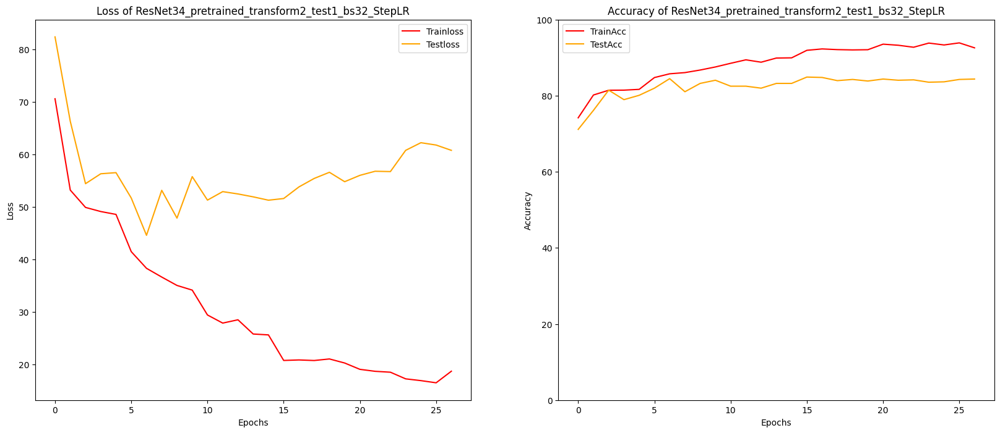

ResNet34_pretrained_transform2_test1_bs64_StepLR
	 Train Loss:78.060921, Test Loss:51.802588, Train Acc:72.318%, Test Acc:81.250%
	 Train Loss:44.728381, Test Loss:59.227100, Train Acc:83.594%, Test Acc:79.479%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:42.774316, Test Loss:48.341435, Train Acc:83.516%, Test Acc:83.333%
	 Weight Saved
	 Train Loss:41.694808, Test Loss:48.039160, Train Acc:84.714%, Test Acc:83.333%
	 Train Loss:38.174939, Test Loss:63.518701, Train Acc:85.781%, Test Acc:78.854%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:30.304053, Test Loss:53.119755, Train Acc:88.594%, Test Acc:81.562%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:29.911794, Test Loss:47.362264, Train Acc:88.646%, Test Acc:84.062%
	 Weight Saved
	 Train Loss:27.345180, Test Loss:52.895105, Train Acc:89.974%, Test Acc:83.750%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:27.738796, Test Loss:49.946029, Train Acc:89.453%, Test Acc:83.333%
	 NOTICE: Early stopping cou

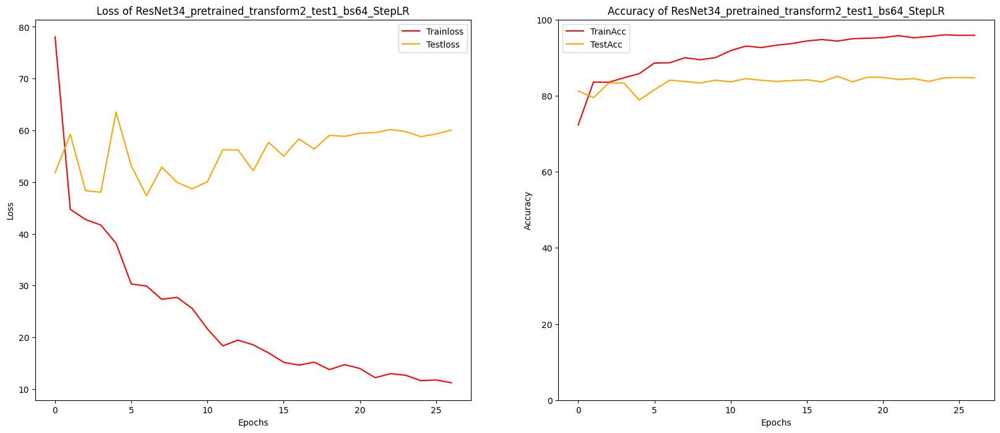

ResNet34_pretrained_transform2_test1_bs128_StepLR
	 Train Loss:145.590869, Test Loss:85.088656, Train Acc:52.057%, Test Acc:69.583%
	 Train Loss:73.436922, Test Loss:61.089368, Train Acc:72.396%, Test Acc:77.188%
	 Weight Saved
	 Train Loss:60.035380, Test Loss:71.876685, Train Acc:77.786%, Test Acc:75.312%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:51.850199, Test Loss:53.362166, Train Acc:80.391%, Test Acc:80.938%
	 Weight Saved
	 Train Loss:50.011938, Test Loss:58.436503, Train Acc:81.354%, Test Acc:78.542%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:38.352193, Test Loss:53.588143, Train Acc:85.859%, Test Acc:81.562%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:38.396285, Test Loss:44.249666, Train Acc:85.807%, Test Acc:83.750%
	 Weight Saved
	 Train Loss:37.432109, Test Loss:50.593722, Train Acc:86.016%, Test Acc:82.812%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:33.581242, Test Loss:46.860832, Train Acc:87.969%, Test Acc:85.3

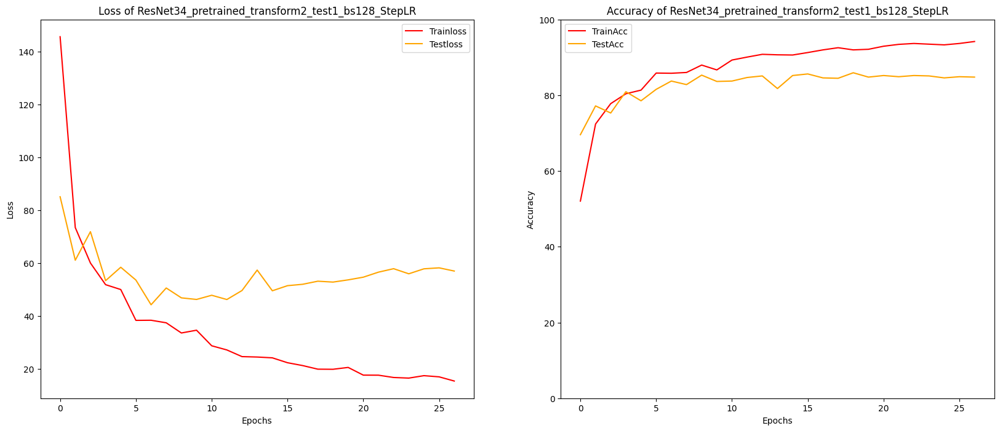

In [56]:
# 使用學習率調度器執行訓練, 從已訓練30個Epochs的權重檔繼續訓練30個epochs
# StepLR
for bs in [8, 16, 32, 64, 128]:
    trained_epochs = 30
    epochs = 30
    lr=0.001
    step_size=5
    gamma=0.5
    optimizer="RMSprop"
    scheduler="StepLR"
    PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/weights/ResNet34"
    fig_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/CurveImages"
    csv_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/csv/model_data_csv"
    modelname = "ResNet34_pretrained_transform2_test1_bs{}_StepLR".format(bs)
    firsttitle = "Loss of " + modelname
    secondtitle = "Accuracy of " + modelname

    print(modelname)
    torch.manual_seed(1412)
    net = m.resnet34(weights=None)
    net.fc = torch.nn.Linear(512, 6, bias=True)
    net.load_state_dict(torch.load(os.path.join(PATH, "ResNet34_pretrained_transform2_test0_bs{}_lr0.001.pt".format(bs))))
    net = net.to(device,non_blocking=True)
    start = time()
    trainloss, testloss, trainacc, testacc = full_procedure_lrscheduler(net, epochs=epochs, bs=bs
                                                                          ,modelname=modelname
                                                                          ,PATH=PATH
                                                                          ,optimizer=optimizer
                                                                          ,lr=lr
                                                                          ,scheduler=scheduler
                                                                          ,step_size=step_size
                                                                          ,gamma=gamma
                                                                          ,patience=20)

    print(modelname)
    print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
    print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
    print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
    print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
    print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
    total_time = time()-start
    print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
    save_data_csv(save_PATH=csv_PATH, filename=modelname, modelname=modelname, trainloss=trainloss, testloss=testloss, 
                  trainacc=trainacc, testacc=testacc, total_time=total_time, trained_epochs=trained_epochs)
    plotgraph(trainloss, testloss, trainacc, testacc, 
              epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle, save=True, PATH=fig_PATH, filename=modelname)

**ResNet34_pretrained_transform2_test1_bs128_StepLR** <br>
Total trained epochs: 57 <br>
Max trainacc: 94.193% 	Epoch: 27 <br>
Max testacc: 85.938% 	Epoch: 19 <br>
Mean trainacc: 87.498% <br>
Mean testacc: 82.936% <br>
Running time: 18.0 minutes, 39 seconds. <br>
<br>
出現最高testacc: 85.938% <br>
先前最高testacc: 85.625% <br>
<br>
Note： 使用DensNet121搭配transform2，最高testacc: 84.896%。transform1的最高testacc: 85.208%。<br>
<br>
觀察到過了第5個epochs開始出現testloss上升，使用lr_scheduler，step_size改為10，讓衰減變慢。 <br>

ResNet34_pretrained_transform2_test2_bs64_StepLR
	 Train Loss:74.269287, Test Loss:71.295988, Train Acc:74.010%, Test Acc:74.479%
	 Train Loss:45.264620, Test Loss:53.560624, Train Acc:82.448%, Test Acc:81.667%
	 Weight Saved
	 Train Loss:43.659713, Test Loss:47.813253, Train Acc:83.568%, Test Acc:83.021%
	 Weight Saved
	 Train Loss:41.574101, Test Loss:50.290820, Train Acc:84.271%, Test Acc:81.875%
	 NOTICE: Early stopping counter 1 of 25
	 Train Loss:38.981783, Test Loss:45.942057, Train Acc:85.599%, Test Acc:83.854%
	 Weight Saved
	 Train Loss:37.107874, Test Loss:59.179533, Train Acc:86.302%, Test Acc:80.312%
	 NOTICE: Early stopping counter 1 of 25
	 Train Loss:34.808639, Test Loss:84.119889, Train Acc:86.901%, Test Acc:76.250%
	 NOTICE: Early stopping counter 2 of 25
	 Train Loss:34.339681, Test Loss:71.973275, Train Acc:87.083%, Test Acc:76.875%
	 NOTICE: Early stopping counter 3 of 25
	 Train Loss:34.281677, Test Loss:48.607178, Train Acc:87.188%, Test Acc:83.438%
	 NOTICE: Ear

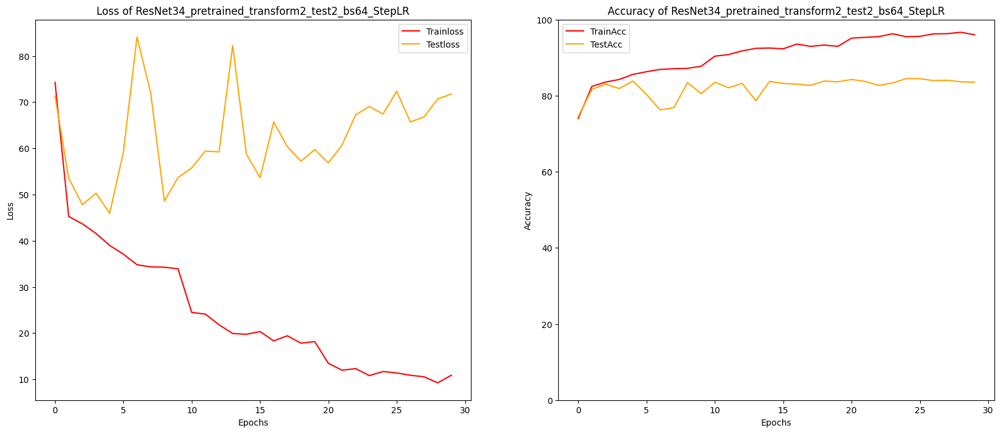

ResNet34_pretrained_transform2_test2_bs128_StepLR
	 Train Loss:168.737760, Test Loss:117.216569, Train Acc:46.719%, Test Acc:54.792%
	 Train Loss:77.104338, Test Loss:79.074894, Train Acc:71.510%, Test Acc:69.583%
	 Weight Saved
	 Train Loss:63.118636, Test Loss:57.689974, Train Acc:76.224%, Test Acc:79.375%
	 Weight Saved
	 Train Loss:55.316748, Test Loss:88.202783, Train Acc:79.401%, Test Acc:69.792%
	 NOTICE: Early stopping counter 1 of 25
	 Train Loss:51.643722, Test Loss:75.793506, Train Acc:80.703%, Test Acc:74.583%
	 NOTICE: Early stopping counter 2 of 25
	 Train Loss:46.710038, Test Loss:51.926746, Train Acc:82.057%, Test Acc:80.312%
	 Weight Saved
	 Train Loss:44.947168, Test Loss:51.173918, Train Acc:83.177%, Test Acc:81.771%
	 Weight Saved
	 Train Loss:44.436934, Test Loss:46.880160, Train Acc:83.099%, Test Acc:81.979%
	 Weight Saved
	 Train Loss:42.516711, Test Loss:89.294124, Train Acc:83.906%, Test Acc:73.333%
	 NOTICE: Early stopping counter 1 of 25
	 Train Loss:41.43594

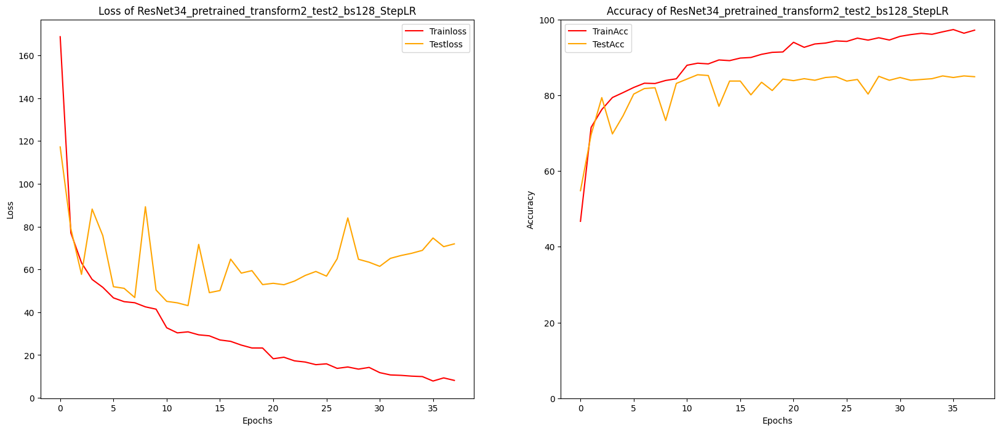

In [28]:
# 使用學習率調度器執行訓練, 從已訓練30個Epochs的權重檔繼續訓練40個epochs
# StepLR
for bs in [64, 128]:
    trained_epochs = 30
    epochs = 40
    lr=0.001
    step_size=10
    gamma=0.5
    optimizer="RMSprop"
    scheduler="StepLR"
    PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/weights/ResNet34"
    fig_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/CurveImages"
    csv_PATH = "D:/TGI102_AI_BootCamp/AIA_Interview/csv/model_data_csv"
    modelname = "ResNet34_pretrained_transform2_test2_bs{}_StepLR".format(bs)
    firsttitle = "Loss of " + modelname
    secondtitle = "Accuracy of " + modelname

    print(modelname)
    torch.manual_seed(1412)
    net = m.resnet34(weights=None)
    net.fc = torch.nn.Linear(512, 6, bias=True)
    net.load_state_dict(torch.load(os.path.join(PATH, "ResNet34_pretrained_transform2_test0_bs{}_lr0.001.pt".format(bs))))
    net = net.to(device,non_blocking=True)
    start = time()
    trainloss, testloss, trainacc, testacc = full_procedure_lrscheduler(net, epochs=epochs, bs=bs
                                                                          ,modelname=modelname
                                                                          ,PATH=PATH
                                                                          ,optimizer=optimizer
                                                                          ,lr=lr
                                                                          ,scheduler=scheduler
                                                                          ,step_size=step_size
                                                                          ,gamma=gamma
                                                                          ,patience=25)

    print(modelname)
    print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
    print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
    print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
    print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
    print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
    total_time = time()-start
    print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
    save_data_csv(save_PATH=csv_PATH, filename=modelname, modelname=modelname, trainloss=trainloss, testloss=testloss, 
                  trainacc=trainacc, testacc=testacc, total_time=total_time, trained_epochs=trained_epochs)
    plotgraph(trainloss, testloss, trainacc, testacc, 
              epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle, save=True, PATH=fig_PATH, filename=modelname)

**ResNet34_pretrained_transform2_test2_bs128_StepLR** <br>
Total trained epochs: 68 <br>
Max trainacc: 97.344% 	Epoch: 36 <br>
Max testacc: 85.417% 	Epoch: 12 <br>
Mean trainacc: 88.980% <br>
Mean testacc: 81.398% <br>
Running time: 24.0 minutes, 37 seconds. <br>
<br>
改變Step_size讓lr衰減速度變慢沒有幫助找到更好的loss surface minima，也無法有效改善過擬合。

嘗試和之前transform1一樣透過網格搜索找出最適的batchsize、lr的搭配，看會不會超過transform1的testacc結果。

ResNet34_pretrained_transform2_test0_bs8_lr0.005


C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch1:[1000/115200(1%)]
Epoch1:[2000/115200(2%)]
Epoch1:[3000/115200(3%)]
	 Train Loss:189.172640, Test Loss:168.076465, Train Acc:20.807%, Test Acc:31.042%
Epoch2:[4840/115200(4%)]
Epoch2:[5840/115200(5%)]
Epoch2:[6840/115200(6%)]
	 Train Loss:165.702783, Test Loss:153.493896, Train Acc:28.516%, Test Acc:32.500%
	 Weight Saved
Epoch3:[8680/115200(8%)]
Epoch3:[9680/115200(8%)]
Epoch3:[10680/115200(9%)]
	 Train Loss:158.674951, Test Loss:143.930387, Train Acc:32.760%, Test Acc:42.500%
	 Weight Saved
Epoch4:[12520/115200(11%)]
Epoch4:[13520/115200(12%)]
Epoch4:[14520/115200(13%)]
	 Train Loss:149.851204, Test Loss:147.726090, Train Acc:38.255%, Test Acc:44.479%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
Epoch5:[16360/115200(14%)]
Epoch5:[17360/115200(15%)]
Epoch5:[18360/115200(16%)]
	 Train Loss:135.050610, Test Loss:115.755298, Train Acc:46.068%, Test Acc:54.062%
	 Weight Saved
Epoch6:[20200/115200(18%)]
Epoch6:[21200/115200(18%)]
Epoch6:[22200/115200(19%)]
	 Train Loss:11

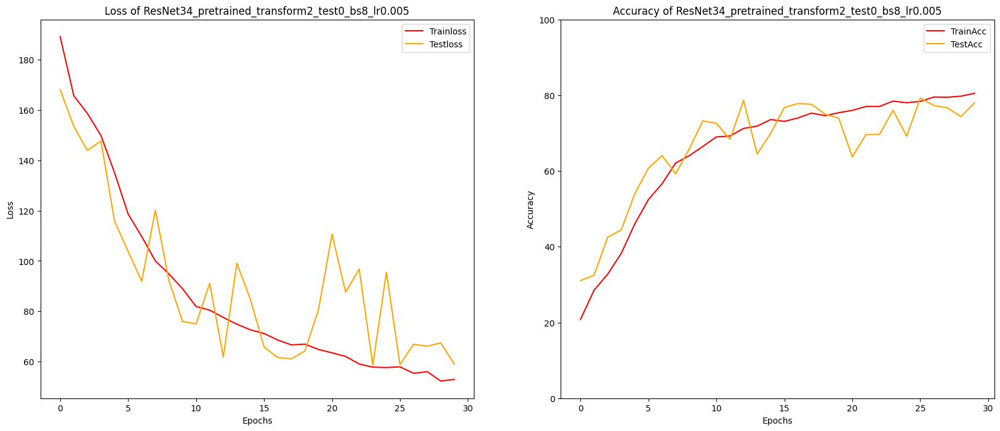

ResNet34_pretrained_transform2_test0_bs8_lr0.002
Epoch1:[1000/115200(1%)]
Epoch1:[2000/115200(2%)]
Epoch1:[3000/115200(3%)]
	 Train Loss:186.012923, Test Loss:169.158838, Train Acc:21.458%, Test Acc:31.042%
Epoch2:[4840/115200(4%)]
Epoch2:[5840/115200(5%)]
Epoch2:[6840/115200(6%)]
	 Train Loss:166.963883, Test Loss:168.822347, Train Acc:28.542%, Test Acc:34.896%
	 Weight Saved
Epoch3:[8680/115200(8%)]
Epoch3:[9680/115200(8%)]
Epoch3:[10680/115200(9%)]
	 Train Loss:157.974170, Test Loss:777.943229, Train Acc:33.229%, Test Acc:30.625%
	 NOTICE: Early stopping counter 1 of 20
Epoch4:[12520/115200(11%)]
Epoch4:[13520/115200(12%)]
Epoch4:[14520/115200(13%)]
	 Train Loss:150.414323, Test Loss:326.290951, Train Acc:38.776%, Test Acc:37.396%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 20
Epoch5:[16360/115200(14%)]
Epoch5:[17360/115200(15%)]
Epoch5:[18360/115200(16%)]
	 Train Loss:130.600854, Test Loss:102.742147, Train Acc:47.578%, Test Acc:59.896%
	 Weight Saved
Epoch6:[20200/115200(

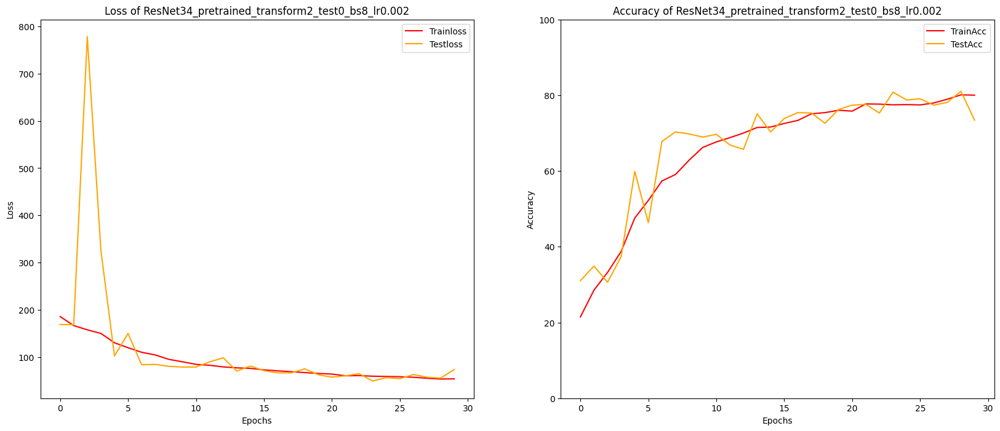

ResNet34_pretrained_transform2_test0_bs8_lr0.0005
Epoch1:[1000/115200(1%)]
Epoch1:[2000/115200(2%)]
Epoch1:[3000/115200(3%)]
	 Train Loss:174.665153, Test Loss:158.880501, Train Acc:26.823%, Test Acc:34.167%
Epoch2:[4840/115200(4%)]
Epoch2:[5840/115200(5%)]
Epoch2:[6840/115200(6%)]
	 Train Loss:135.630518, Test Loss:125.977327, Train Acc:45.651%, Test Acc:52.396%
	 Weight Saved
Epoch3:[8680/115200(8%)]
Epoch3:[9680/115200(8%)]
Epoch3:[10680/115200(9%)]
	 Train Loss:110.207161, Test Loss:86.128166, Train Acc:58.958%, Test Acc:70.208%
	 Weight Saved
Epoch4:[12520/115200(11%)]
Epoch4:[13520/115200(12%)]
Epoch4:[14520/115200(13%)]
	 Train Loss:98.005754, Test Loss:108.538387, Train Acc:63.698%, Test Acc:71.562%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
Epoch5:[16360/115200(14%)]
Epoch5:[17360/115200(15%)]
Epoch5:[18360/115200(16%)]
	 Train Loss:85.120435, Test Loss:69.311987, Train Acc:67.969%, Test Acc:75.312%
	 Weight Saved
Epoch6:[20200/115200(18%)]
Epoch6:[21200/115200(18

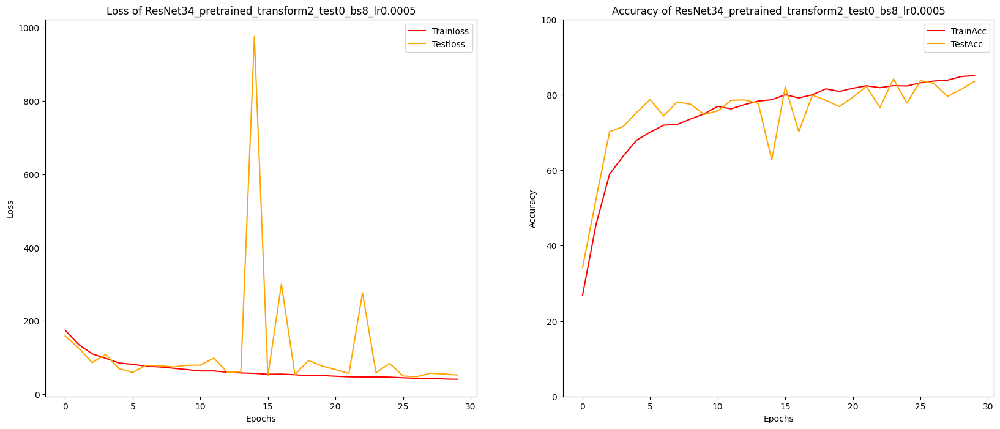

ResNet34_pretrained_transform2_test0_bs8_lr0.00025
Epoch1:[1000/115200(1%)]
Epoch1:[2000/115200(2%)]
Epoch1:[3000/115200(3%)]
	 Train Loss:139.949919, Test Loss:116.489640, Train Acc:44.714%, Test Acc:55.833%
Epoch2:[4840/115200(4%)]
Epoch2:[5840/115200(5%)]
Epoch2:[6840/115200(6%)]
	 Train Loss:91.656160, Test Loss:68.862687, Train Acc:66.250%, Test Acc:76.667%
	 Weight Saved
Epoch3:[8680/115200(8%)]
Epoch3:[9680/115200(8%)]
Epoch3:[10680/115200(9%)]
	 Train Loss:76.798071, Test Loss:80.153638, Train Acc:71.667%, Test Acc:70.417%
	 NOTICE: Early stopping counter 1 of 20
Epoch4:[12520/115200(11%)]
Epoch4:[13520/115200(12%)]
Epoch4:[14520/115200(13%)]
	 Train Loss:71.100358, Test Loss:72.582145, Train Acc:74.115%, Test Acc:74.062%
	 NOTICE: Early stopping counter 2 of 20
Epoch5:[16360/115200(14%)]
Epoch5:[17360/115200(15%)]
Epoch5:[18360/115200(16%)]
	 Train Loss:66.915291, Test Loss:68.553597, Train Acc:74.479%, Test Acc:74.688%
Epoch6:[20200/115200(18%)]
Epoch6:[21200/115200(18%)]
Epo

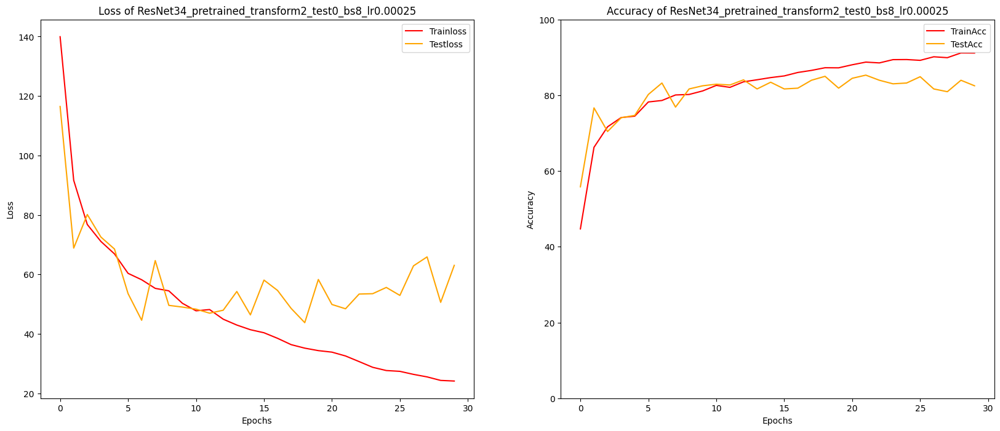

ResNet34_pretrained_transform2_test0_bs8_lr0.0001
Epoch1:[1000/115200(1%)]
Epoch1:[2000/115200(2%)]
Epoch1:[3000/115200(3%)]
	 Train Loss:92.633244, Test Loss:60.475574, Train Acc:65.833%, Test Acc:79.062%
Epoch2:[4840/115200(4%)]
Epoch2:[5840/115200(5%)]
Epoch2:[6840/115200(6%)]
	 Train Loss:68.879712, Test Loss:51.220711, Train Acc:74.740%, Test Acc:81.667%
	 Weight Saved
Epoch3:[8680/115200(8%)]
Epoch3:[9680/115200(8%)]
Epoch3:[10680/115200(9%)]
	 Train Loss:60.229333, Test Loss:47.334941, Train Acc:78.438%, Test Acc:81.458%
Epoch4:[12520/115200(11%)]
Epoch4:[13520/115200(12%)]
Epoch4:[14520/115200(13%)]
	 Train Loss:54.182377, Test Loss:48.142912, Train Acc:80.286%, Test Acc:83.438%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
Epoch5:[16360/115200(14%)]
Epoch5:[17360/115200(15%)]
Epoch5:[18360/115200(16%)]
	 Train Loss:50.875334, Test Loss:49.227063, Train Acc:81.458%, Test Acc:82.917%
	 NOTICE: Early stopping counter 2 of 20
Epoch6:[20200/115200(18%)]
Epoch6:[21200/1152

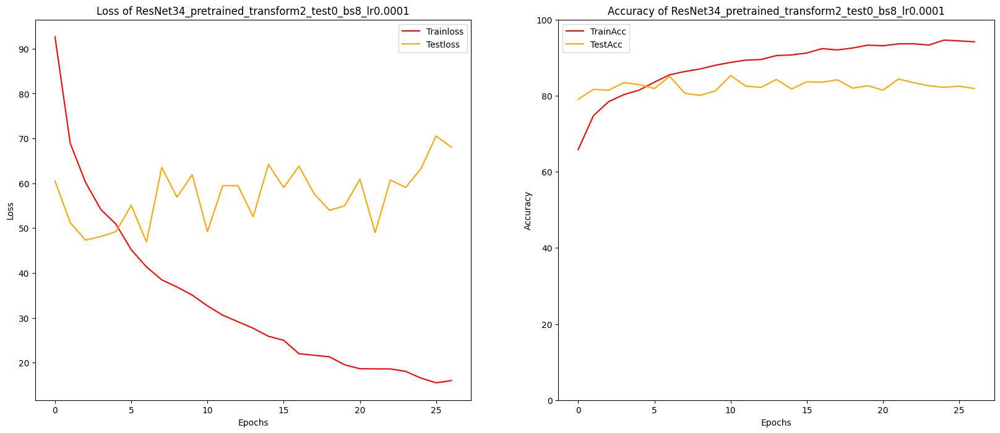

ResNet34_pretrained_transform2_test0_bs16_lr0.005
Epoch1:[2000/115200(2%)]
	 Train Loss:197.924121, Test Loss:163.073389, Train Acc:21.875%, Test Acc:31.250%
Epoch2:[5840/115200(5%)]
	 Train Loss:164.419059, Test Loss:147.194108, Train Acc:29.635%, Test Acc:38.958%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:157.635758, Test Loss:155.717480, Train Acc:32.708%, Test Acc:36.354%
	 NOTICE: Early stopping counter 1 of 20
Epoch4:[13520/115200(12%)]
	 Train Loss:151.491439, Test Loss:135.733073, Train Acc:36.589%, Test Acc:45.625%
	 Weight Saved
Epoch5:[17360/115200(15%)]
	 Train Loss:141.639746, Test Loss:162.044255, Train Acc:43.177%, Test Acc:47.917%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
Epoch6:[21200/115200(18%)]
	 Train Loss:130.192733, Test Loss:128.434904, Train Acc:48.255%, Test Acc:57.604%
	 Weight Saved
Epoch7:[25040/115200(22%)]
	 Train Loss:120.754932, Test Loss:225.030208, Train Acc:52.552%, Test Acc:46.875%
	 NOTICE: Early stopping counter 1 of 20
Epo

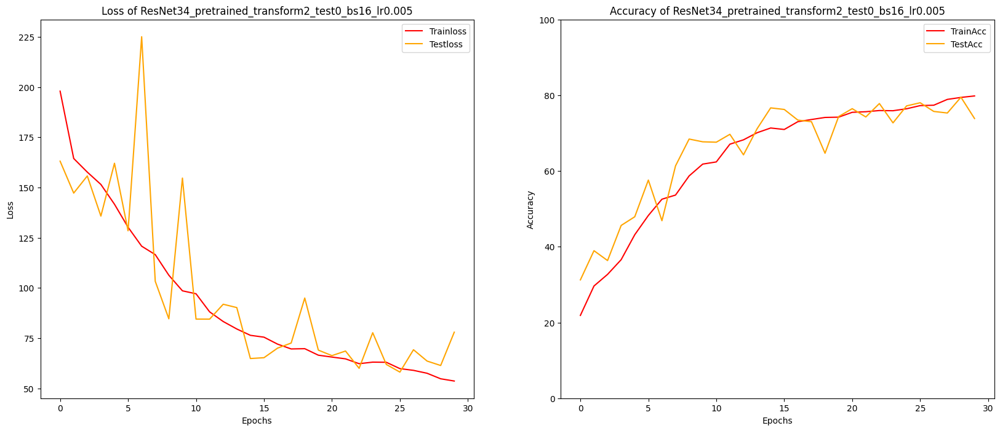

ResNet34_pretrained_transform2_test0_bs16_lr0.002
Epoch1:[2000/115200(2%)]
	 Train Loss:182.954997, Test Loss:187.229281, Train Acc:25.599%, Test Acc:28.750%
Epoch2:[5840/115200(5%)]
	 Train Loss:165.437679, Test Loss:153.092236, Train Acc:28.880%, Test Acc:31.875%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:156.959017, Test Loss:169.705046, Train Acc:35.130%, Test Acc:35.417%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
Epoch4:[13520/115200(12%)]
	 Train Loss:146.380566, Test Loss:152.697266, Train Acc:40.495%, Test Acc:46.667%
	 Weight Saved
Epoch5:[17360/115200(15%)]
	 Train Loss:126.515161, Test Loss:275.843424, Train Acc:49.766%, Test Acc:45.938%
	 NOTICE: Early stopping counter 1 of 20
Epoch6:[21200/115200(18%)]
	 Train Loss:113.493001, Test Loss:92.319116, Train Acc:56.250%, Test Acc:64.688%
	 Weight Saved
Epoch7:[25040/115200(22%)]
	 Train Loss:106.519816, Test Loss:103.171191, Train Acc:58.932%, Test Acc:60.521%
	 NOTICE: Early stopping counter 1 of 20
Epoc

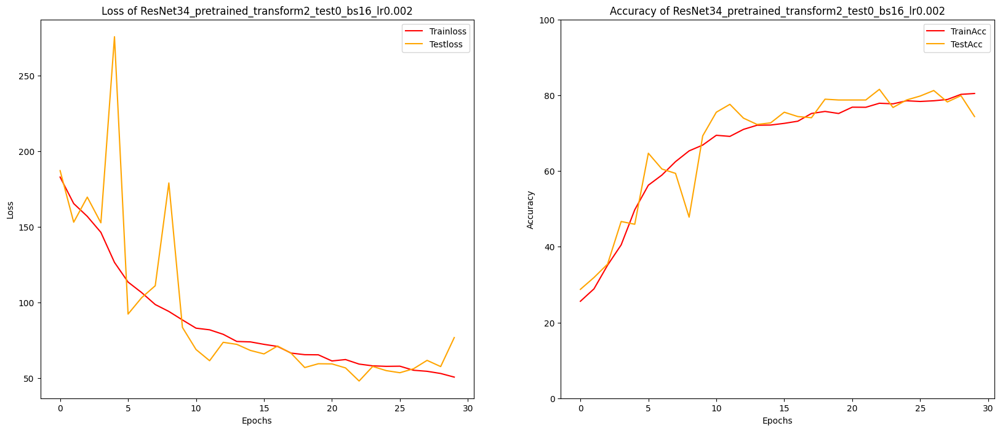

ResNet34_pretrained_transform2_test0_bs16_lr0.0005
Epoch1:[2000/115200(2%)]
	 Train Loss:152.540332, Test Loss:126.891479, Train Acc:40.443%, Test Acc:51.562%
Epoch2:[5840/115200(5%)]
	 Train Loss:102.044556, Test Loss:68.888184, Train Acc:61.693%, Test Acc:75.729%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:86.690015, Test Loss:66.113086, Train Acc:67.396%, Test Acc:76.458%
	 Weight Saved
Epoch4:[13520/115200(12%)]
	 Train Loss:76.986084, Test Loss:80.051986, Train Acc:71.198%, Test Acc:71.146%
	 NOTICE: Early stopping counter 1 of 20
Epoch5:[17360/115200(15%)]
	 Train Loss:70.044580, Test Loss:58.830782, Train Acc:73.854%, Test Acc:78.438%
	 Weight Saved
Epoch6:[21200/115200(18%)]
	 Train Loss:66.671106, Test Loss:69.442635, Train Acc:75.365%, Test Acc:74.375%
	 NOTICE: Early stopping counter 1 of 20
Epoch7:[25040/115200(22%)]
	 Train Loss:63.148885, Test Loss:55.088131, Train Acc:76.354%, Test Acc:80.312%
	 Weight Saved
Epoch8:[28880/115200(25%)]
	 Train Loss:63.197656, Tes

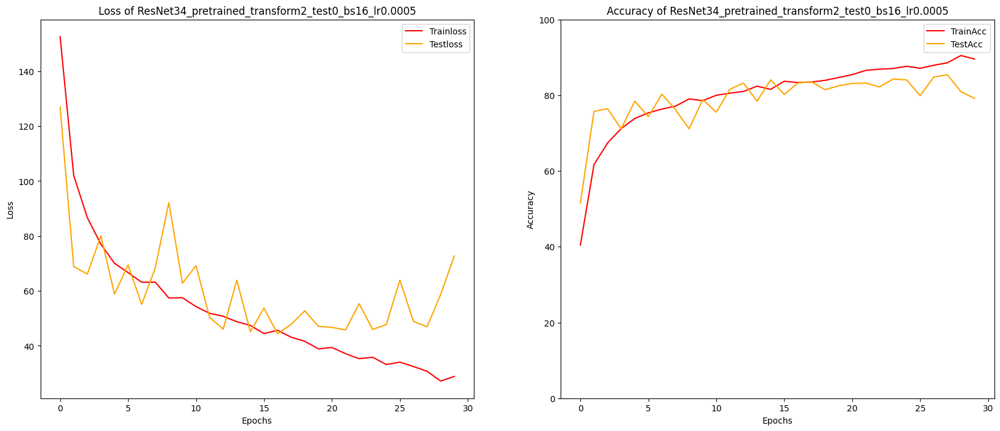

ResNet34_pretrained_transform2_test0_bs16_lr0.00025
Epoch1:[2000/115200(2%)]
	 Train Loss:114.542546, Test Loss:108.524325, Train Acc:56.823%, Test Acc:65.938%
Epoch2:[5840/115200(5%)]
	 Train Loss:76.738330, Test Loss:66.612410, Train Acc:72.500%, Test Acc:76.667%
	 Weight Saved
Epoch3:[9680/115200(8%)]
	 Train Loss:67.754854, Test Loss:73.626636, Train Acc:75.755%, Test Acc:69.688%
	 NOTICE: Early stopping counter 1 of 20
Epoch4:[13520/115200(12%)]
	 Train Loss:61.723466, Test Loss:52.178219, Train Acc:77.969%, Test Acc:81.250%
	 Weight Saved
Epoch5:[17360/115200(15%)]
	 Train Loss:57.090841, Test Loss:59.712740, Train Acc:79.062%, Test Acc:77.188%
	 NOTICE: Early stopping counter 1 of 20
Epoch6:[21200/115200(18%)]
	 Train Loss:52.989250, Test Loss:54.838086, Train Acc:80.651%, Test Acc:79.896%
	 NOTICE: Early stopping counter 2 of 20
Epoch7:[25040/115200(22%)]
	 Train Loss:52.249341, Test Loss:44.961377, Train Acc:81.068%, Test Acc:82.500%
	 Weight Saved
Epoch8:[28880/115200(25%)]
	

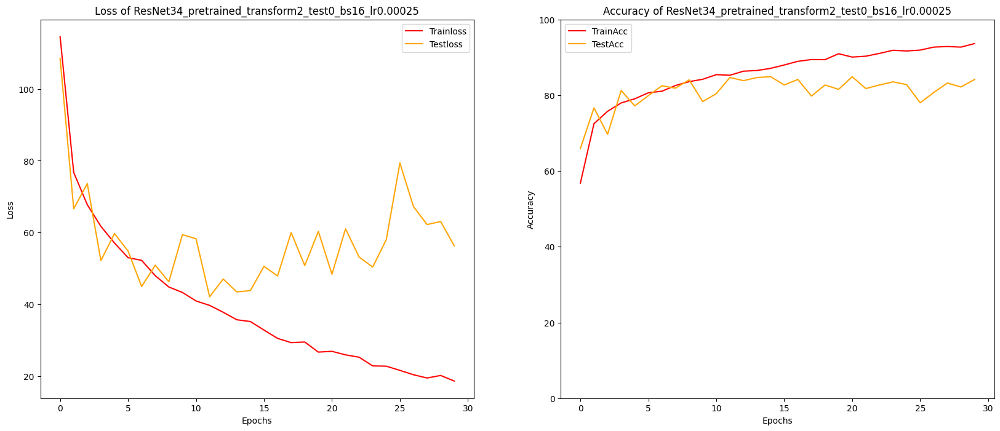

ResNet34_pretrained_transform2_test0_bs16_lr0.0001
Epoch1:[2000/115200(2%)]
	 Train Loss:80.899569, Test Loss:63.958105, Train Acc:70.677%, Test Acc:77.604%
Epoch2:[5840/115200(5%)]
	 Train Loss:59.278756, Test Loss:58.372754, Train Acc:78.281%, Test Acc:77.396%
Epoch3:[9680/115200(8%)]
	 Train Loss:50.313944, Test Loss:45.310673, Train Acc:81.849%, Test Acc:83.229%
	 Weight Saved
Epoch4:[13520/115200(12%)]
	 Train Loss:47.200496, Test Loss:53.190548, Train Acc:82.969%, Test Acc:81.771%
	 NOTICE: Early stopping counter 1 of 20
Epoch5:[17360/115200(15%)]
	 Train Loss:43.768677, Test Loss:44.758207, Train Acc:84.375%, Test Acc:84.375%
	 Weight Saved
Epoch6:[21200/115200(18%)]
	 Train Loss:36.773206, Test Loss:46.300798, Train Acc:86.979%, Test Acc:84.167%
	 NOTICE: Early stopping counter 1 of 20
Epoch7:[25040/115200(22%)]
	 Train Loss:36.198360, Test Loss:52.772827, Train Acc:86.406%, Test Acc:82.396%
	 NOTICE: Early stopping counter 2 of 20
Epoch8:[28880/115200(25%)]
	 Train Loss:31.646

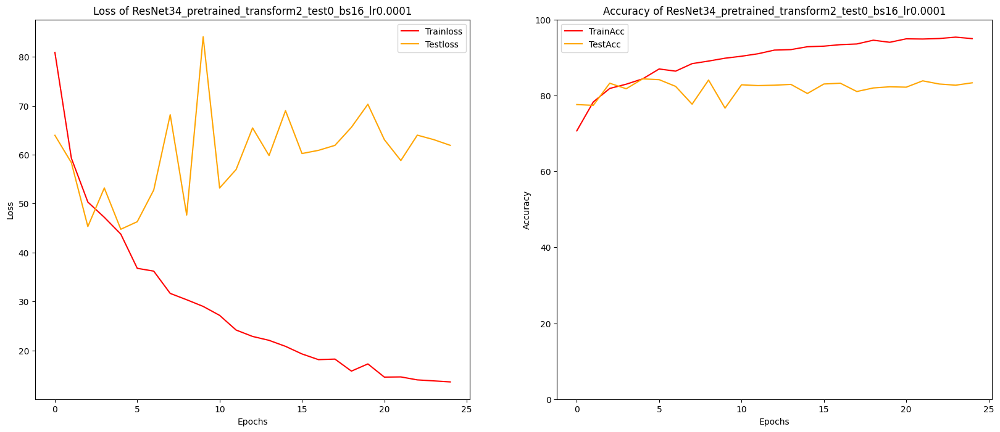

ResNet34_pretrained_transform2_test0_bs32_lr0.005
	 Train Loss:212.615348, Test Loss:180.565609, Train Acc:17.135%, Test Acc:16.667%
	 Train Loss:179.540299, Test Loss:178.595280, Train Acc:18.672%, Test Acc:16.667%
	 Train Loss:167.085775, Test Loss:161.601172, Train Acc:27.917%, Test Acc:31.979%
	 Weight Saved
	 Train Loss:159.325488, Test Loss:186.698747, Train Acc:32.839%, Test Acc:32.396%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:150.605566, Test Loss:141.838900, Train Acc:37.891%, Test Acc:41.875%
	 Weight Saved
	 Train Loss:140.837288, Test Loss:232.231624, Train Acc:42.031%, Test Acc:35.104%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:131.075130, Test Loss:120.201530, Train Acc:48.281%, Test Acc:51.979%
	 Weight Saved
	 Train Loss:119.874040, Test Loss:114.555444, Train Acc:52.500%, Test Acc:54.896%
	 Weight Saved
	 Train Loss:107.904932, Test Loss:102.245687, Train Acc:58.828%, Test Acc:61.667%
	 Weight Saved
	 Train Loss:103.496558, Test L

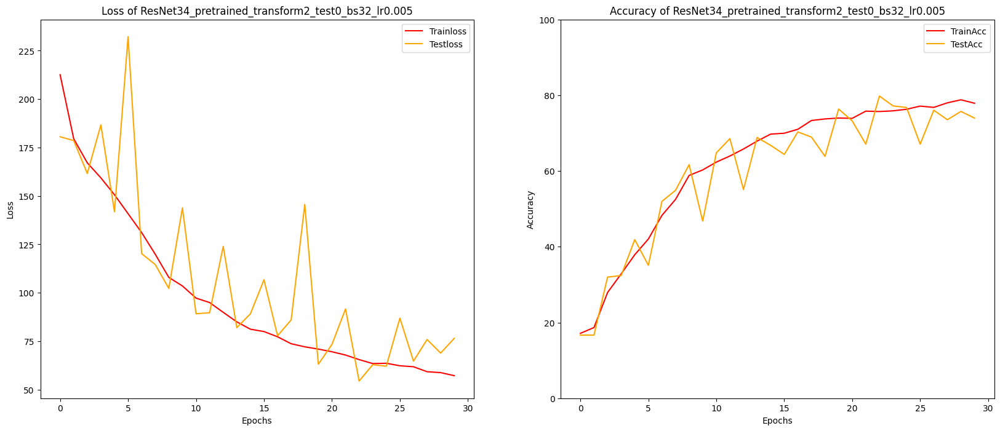

ResNet34_pretrained_transform2_test0_bs32_lr0.002
	 Train Loss:190.914697, Test Loss:164.939502, Train Acc:23.359%, Test Acc:28.438%
	 Train Loss:158.297542, Test Loss:145.954671, Train Acc:32.812%, Test Acc:41.458%
	 Weight Saved
	 Train Loss:149.575228, Test Loss:145.408252, Train Acc:39.453%, Test Acc:41.771%
	 Weight Saved
	 Train Loss:137.892985, Test Loss:181.946891, Train Acc:45.339%, Test Acc:30.833%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:128.691187, Test Loss:104.792537, Train Acc:49.505%, Test Acc:60.417%
	 Weight Saved
	 Train Loss:111.765682, Test Loss:111.253296, Train Acc:56.302%, Test Acc:59.062%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:102.338867, Test Loss:102.633610, Train Acc:61.068%, Test Acc:61.042%
	 Weight Saved
	 Train Loss:97.879647, Test Loss:96.829793, Train Acc:63.125%, Test Acc:61.458%
	 Weight Saved
	 Train Loss:90.676050, Test Loss:81.262223, Train Acc:65.833%, Test Acc:70.417%
	 Weight Saved
	 Train Loss:87.071118, Test Loss:4

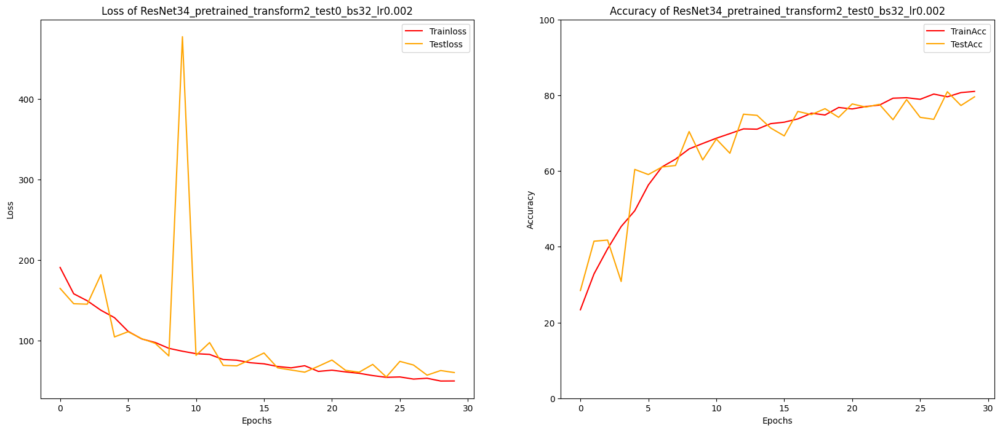

ResNet34_pretrained_transform2_test0_bs32_lr0.0005
	 Train Loss:171.100586, Test Loss:147.375651, Train Acc:32.474%, Test Acc:43.854%
	 Train Loss:116.348063, Test Loss:81.030933, Train Acc:55.964%, Test Acc:68.958%
	 Weight Saved
	 Train Loss:85.784180, Test Loss:77.102913, Train Acc:67.448%, Test Acc:73.438%
	 Weight Saved
	 Train Loss:75.567619, Test Loss:62.099341, Train Acc:71.536%, Test Acc:77.708%
	 Weight Saved
	 Train Loss:68.382357, Test Loss:60.218494, Train Acc:75.260%, Test Acc:78.438%
	 Weight Saved
	 Train Loss:63.939355, Test Loss:59.007556, Train Acc:76.745%, Test Acc:78.542%
	 Weight Saved
	 Train Loss:59.165344, Test Loss:78.090723, Train Acc:78.385%, Test Acc:71.250%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:55.045040, Test Loss:58.573971, Train Acc:79.635%, Test Acc:78.958%
	 Weight Saved
	 Train Loss:56.661149, Test Loss:49.976143, Train Acc:78.932%, Test Acc:82.812%
	 Weight Saved
	 Train Loss:49.300024, Test Loss:52.469804, Train Acc:82.005%, Test Ac

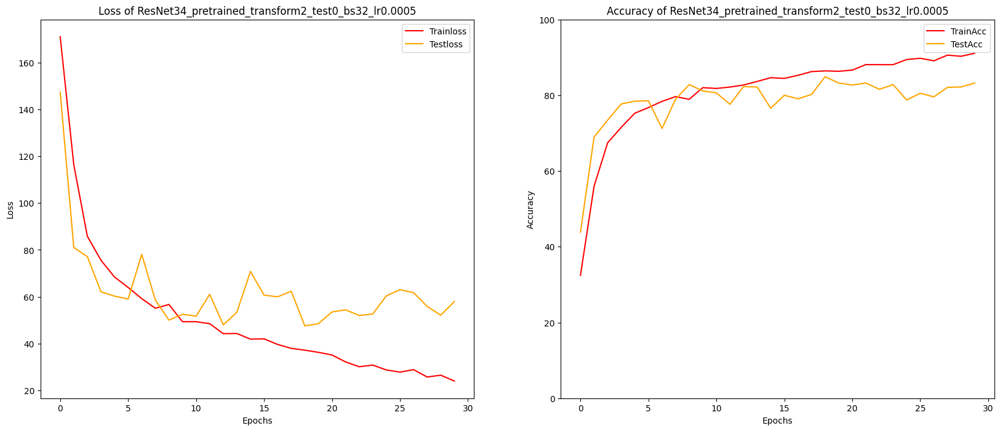

ResNet34_pretrained_transform2_test0_bs32_lr0.00025
	 Train Loss:100.390894, Test Loss:76.876668, Train Acc:62.396%, Test Acc:70.417%
	 Train Loss:64.562301, Test Loss:67.154053, Train Acc:75.703%, Test Acc:77.188%
	 Weight Saved
	 Train Loss:55.926331, Test Loss:55.768921, Train Acc:79.844%, Test Acc:80.625%
	 Weight Saved
	 Train Loss:51.956238, Test Loss:49.699162, Train Acc:80.339%, Test Acc:81.771%
	 Weight Saved
	 Train Loss:48.539571, Test Loss:50.724316, Train Acc:82.578%, Test Acc:82.292%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:44.010929, Test Loss:50.334880, Train Acc:84.297%, Test Acc:82.396%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:41.459546, Test Loss:51.947827, Train Acc:84.948%, Test Acc:81.458%
	 NOTICE: Early stopping counter 3 of 20
	 Train Loss:40.535620, Test Loss:51.470789, Train Acc:84.740%, Test Acc:82.604%
	 Weight Saved
	 NOTICE: Early stopping counter 4 of 20
	 Train Loss:38.203552, Test Loss:49.978027, 

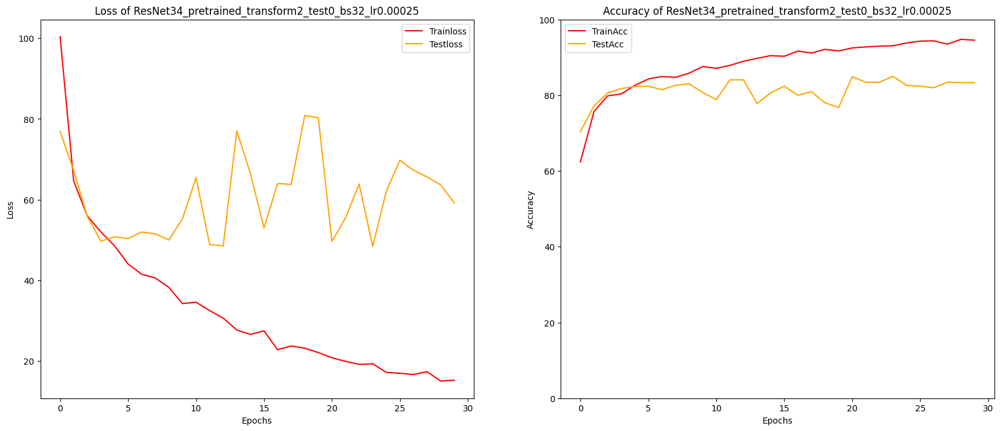

ResNet34_pretrained_transform2_test0_bs32_lr0.0001
	 Train Loss:76.215975, Test Loss:58.873621, Train Acc:72.240%, Test Acc:79.479%
	 Train Loss:50.879602, Test Loss:56.101575, Train Acc:81.172%, Test Acc:79.062%
	 Train Loss:42.842179, Test Loss:42.589478, Train Acc:84.297%, Test Acc:84.062%
	 Weight Saved
	 Train Loss:39.928394, Test Loss:48.052466, Train Acc:85.599%, Test Acc:82.396%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:36.292537, Test Loss:56.419995, Train Acc:87.135%, Test Acc:82.396%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:34.810567, Test Loss:44.964115, Train Acc:87.500%, Test Acc:85.000%
	 Weight Saved
	 NOTICE: Early stopping counter 3 of 20
	 Train Loss:27.355591, Test Loss:53.255017, Train Acc:89.870%, Test Acc:83.021%
	 NOTICE: Early stopping counter 4 of 20
	 Train Loss:26.974194, Test Loss:55.985795, Train Acc:89.896%, Test Acc:82.188%
	 NOTICE: Early stopping counter 5 of 20
	 Train Loss:24.173899, Test Loss:56.660079, Train Acc:90.990%, Te

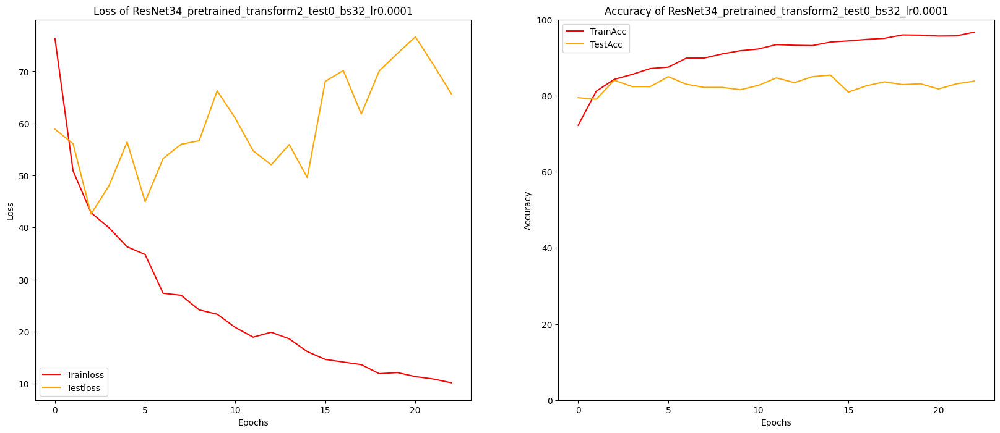

ResNet34_pretrained_transform2_test0_bs64_lr0.005
	 Train Loss:231.782259, Test Loss:299.829167, Train Acc:20.156%, Test Acc:29.062%
	 Train Loss:169.498844, Test Loss:162.579085, Train Acc:29.792%, Test Acc:34.479%
	 Weight Saved
	 Train Loss:159.081413, Test Loss:157.906022, Train Acc:33.359%, Test Acc:41.042%
	 Weight Saved
	 Train Loss:151.047526, Test Loss:136.201676, Train Acc:38.307%, Test Acc:45.729%
	 Weight Saved
	 Train Loss:141.882471, Test Loss:167.299040, Train Acc:43.854%, Test Acc:31.979%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:136.195841, Test Loss:134.017155, Train Acc:45.078%, Test Acc:45.312%
	 Train Loss:128.690299, Test Loss:150.992025, Train Acc:49.271%, Test Acc:52.188%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:125.237809, Test Loss:148.410498, Train Acc:50.000%, Test Acc:44.583%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:118.840690, Test Loss:153.678988, Train Acc:54.141%, Test Acc:44.062%
	 NOTICE: Early stop

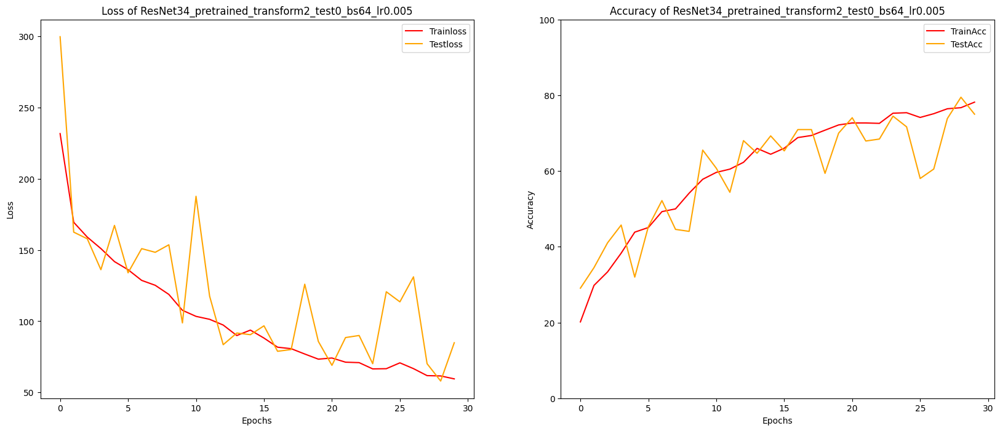

ResNet34_pretrained_transform2_test0_bs64_lr0.002
	 Train Loss:211.653271, Test Loss:178.382275, Train Acc:17.031%, Test Acc:19.271%
	 Train Loss:172.483529, Test Loss:160.052067, Train Acc:27.474%, Test Acc:30.625%
	 Weight Saved
	 Train Loss:158.635514, Test Loss:151.813428, Train Acc:35.208%, Test Acc:40.104%
	 Weight Saved
	 Train Loss:148.518001, Test Loss:151.910400, Train Acc:40.182%, Test Acc:39.271%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:141.155127, Test Loss:229.523844, Train Acc:43.307%, Test Acc:28.021%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:133.702620, Test Loss:121.714274, Train Acc:47.474%, Test Acc:52.917%
	 Weight Saved
	 Train Loss:127.567415, Test Loss:110.110343, Train Acc:49.766%, Test Acc:56.354%
	 Weight Saved
	 Train Loss:114.341341, Test Loss:154.438558, Train Acc:55.182%, Test Acc:46.146%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:110.121102, Test Loss:125.518612, Train Acc:58.047%, Test Acc:51.667%
	 NOTICE: Early stop

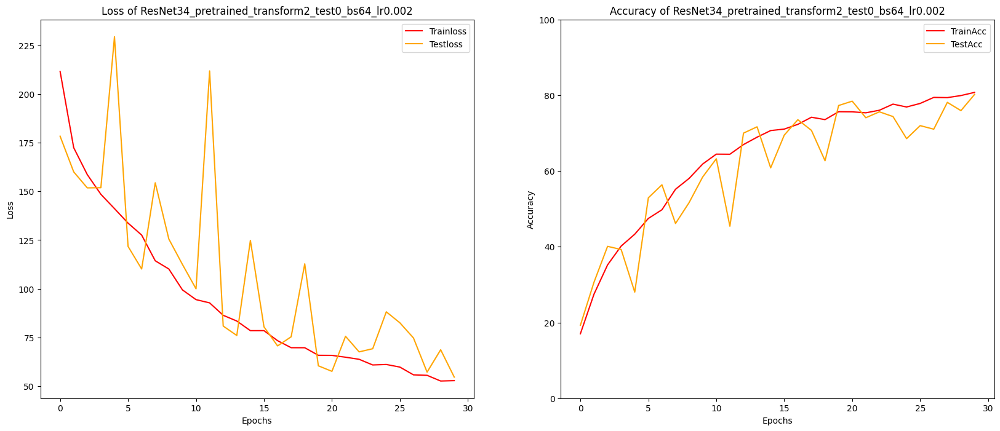

ResNet34_pretrained_transform2_test0_bs64_lr0.0005
	 Train Loss:171.361768, Test Loss:140.715771, Train Acc:32.891%, Test Acc:47.500%
	 Train Loss:110.484212, Test Loss:178.843392, Train Acc:58.021%, Test Acc:59.479%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:81.249854, Test Loss:94.520215, Train Acc:69.948%, Test Acc:66.042%
	 Weight Saved
	 Train Loss:68.994849, Test Loss:105.575350, Train Acc:73.932%, Test Acc:68.646%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:62.797074, Test Loss:92.561979, Train Acc:76.641%, Test Acc:71.354%
	 Weight Saved
	 Train Loss:59.197795, Test Loss:56.937423, Train Acc:77.943%, Test Acc:78.438%
	 Weight Saved
	 Train Loss:56.330896, Test Loss:62.010986, Train Acc:78.594%, Test Acc:77.500%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:51.791882, Test Loss:43.174520, Train Acc:81.458%, Test Acc:84.583%
	 Weight Saved
	 Train Loss:50.793302, Test Loss:55.455737, Train Acc:81.510%, Test Acc:79.896%
	 

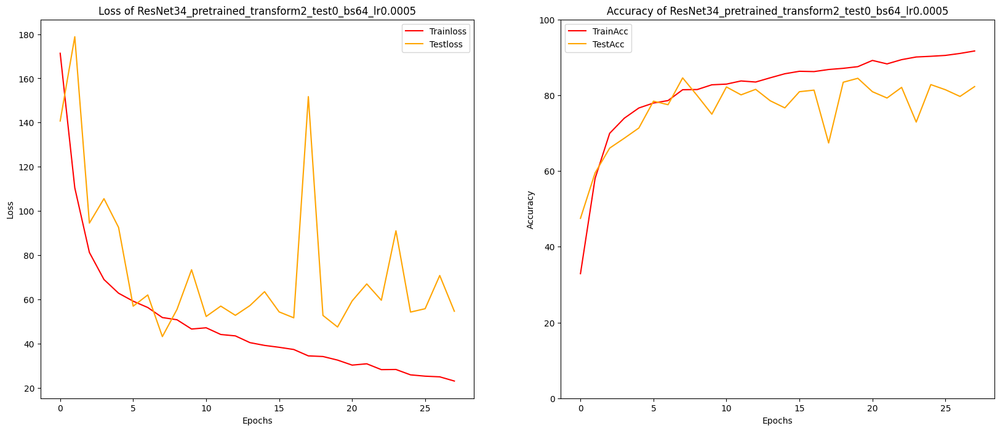

ResNet34_pretrained_transform2_test0_bs64_lr0.00025
	 Train Loss:110.110107, Test Loss:84.327848, Train Acc:60.208%, Test Acc:71.250%
	 Train Loss:60.643494, Test Loss:58.744177, Train Acc:77.474%, Test Acc:77.396%
	 Weight Saved
	 Train Loss:51.897095, Test Loss:55.006364, Train Acc:80.547%, Test Acc:80.938%
	 Weight Saved
	 Train Loss:45.613798, Test Loss:44.514677, Train Acc:83.464%, Test Acc:84.271%
	 Weight Saved
	 Train Loss:42.722709, Test Loss:56.644401, Train Acc:83.958%, Test Acc:81.667%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:38.166821, Test Loss:51.141675, Train Acc:85.573%, Test Acc:82.917%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:37.875728, Test Loss:70.915226, Train Acc:85.990%, Test Acc:76.562%
	 NOTICE: Early stopping counter 3 of 20
	 Train Loss:35.557780, Test Loss:52.575094, Train Acc:87.109%, Test Acc:83.750%
	 NOTICE: Early stopping counter 4 of 20
	 Train Loss:32.087368, Test Loss:56.003776, Train Acc:88.047%, Test Acc:81.771%
	 NOTICE:

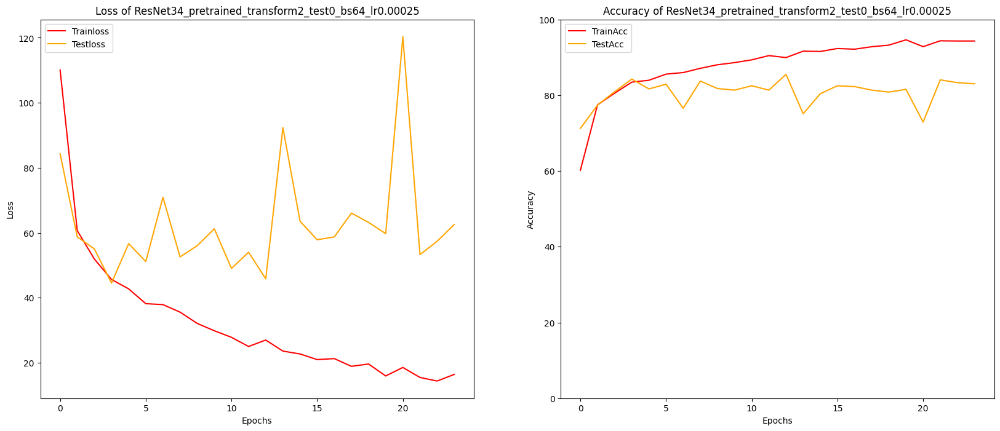

ResNet34_pretrained_transform2_test0_bs64_lr0.0001
	 Train Loss:78.252523, Test Loss:53.436401, Train Acc:70.729%, Test Acc:79.688%
	 Train Loss:47.215043, Test Loss:59.076107, Train Acc:82.812%, Test Acc:79.375%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:39.927861, Test Loss:50.257922, Train Acc:84.583%, Test Acc:81.562%
	 Weight Saved
	 Train Loss:33.716296, Test Loss:49.649223, Train Acc:87.865%, Test Acc:82.083%
	 Weight Saved
	 Train Loss:32.229519, Test Loss:48.640291, Train Acc:87.917%, Test Acc:84.062%
	 Weight Saved
	 Train Loss:26.955992, Test Loss:52.044442, Train Acc:90.391%, Test Acc:82.708%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:24.592173, Test Loss:52.493693, Train Acc:90.807%, Test Acc:84.167%
	 Weight Saved
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:22.681089, Test Loss:66.626973, Train Acc:91.745%, Test Acc:78.333%
	 NOTICE: Early stopping counter 3 of 20
	 Train Loss:18.988737, Test Loss:61.847847, Train Acc:92.760%, Test Acc:83.1

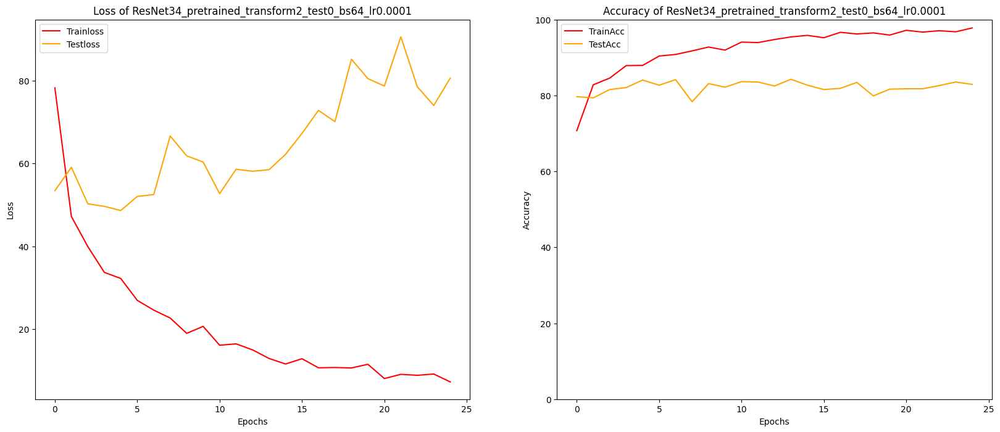

ResNet34_pretrained_transform2_test0_bs128_lr0.005
	 Train Loss:260.603923, Test Loss:387.157910, Train Acc:16.224%, Test Acc:21.146%
	 Train Loss:181.538997, Test Loss:165.958431, Train Acc:24.635%, Test Acc:28.958%
	 Weight Saved
	 Train Loss:165.220410, Test Loss:162.464469, Train Acc:30.182%, Test Acc:30.000%
	 Weight Saved
	 Train Loss:158.504004, Test Loss:153.897380, Train Acc:33.620%, Test Acc:37.812%
	 Weight Saved
	 Train Loss:151.398682, Test Loss:154.659163, Train Acc:37.656%, Test Acc:41.562%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:147.062712, Test Loss:262.612663, Train Acc:40.000%, Test Acc:38.854%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:143.614990, Test Loss:142.693197, Train Acc:43.516%, Test Acc:42.396%
	 Weight Saved
	 Train Loss:138.309196, Test Loss:155.077035, Train Acc:44.010%, Test Acc:38.646%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:134.103345, Test Loss:146.196745, Train Acc:46.432%, Test Acc:38.438%
	 NO

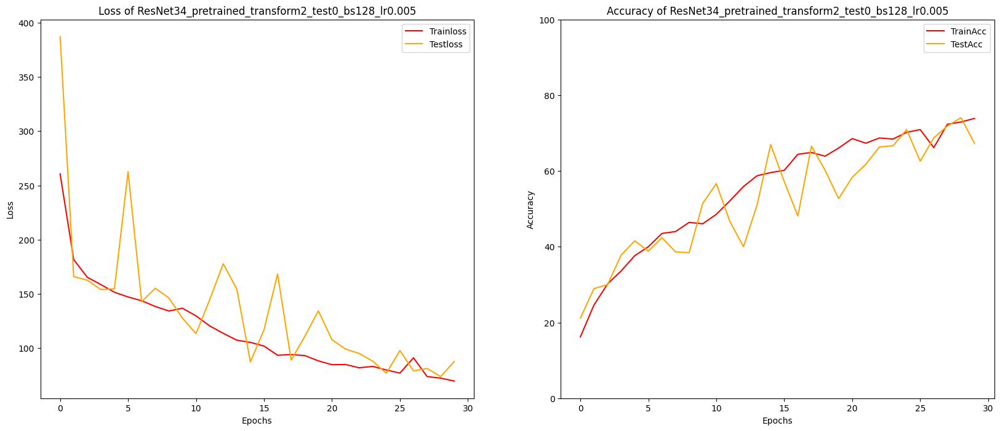

ResNet34_pretrained_transform2_test0_bs128_lr0.002
	 Train Loss:227.128532, Test Loss:183.692187, Train Acc:17.786%, Test Acc:19.896%
	 Train Loss:173.954150, Test Loss:176.243213, Train Acc:27.786%, Test Acc:30.417%
	 Weight Saved
	 Train Loss:165.594385, Test Loss:662.073763, Train Acc:32.630%, Test Acc:29.271%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:151.376709, Test Loss:179.591292, Train Acc:39.479%, Test Acc:27.917%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:142.017855, Test Loss:136.214486, Train Acc:44.141%, Test Acc:48.646%
	 Weight Saved
	 Train Loss:132.118579, Test Loss:184.701286, Train Acc:49.089%, Test Acc:28.750%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:120.736971, Test Loss:174.644954, Train Acc:52.448%, Test Acc:41.667%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:111.868221, Test Loss:92.317716, Train Acc:56.979%, Test Acc:65.312%
	 Weight Saved
	 Train Loss:104.750562, Test Loss:112.855876, Train Acc:59.792%, Test Acc:56

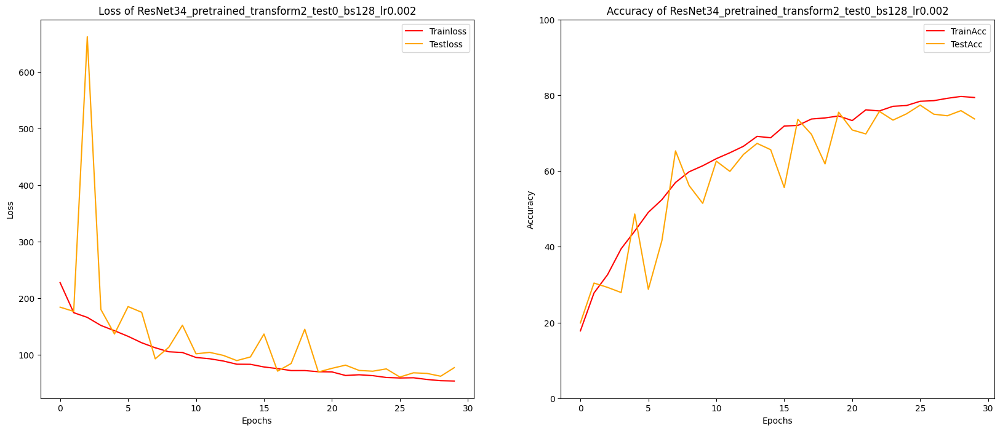

ResNet34_pretrained_transform2_test0_bs128_lr0.0005
	 Train Loss:179.329541, Test Loss:127.072868, Train Acc:31.589%, Test Acc:51.146%
	 Train Loss:117.594263, Test Loss:133.032340, Train Acc:54.297%, Test Acc:50.208%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:88.304167, Test Loss:113.911930, Train Acc:67.370%, Test Acc:61.354%
	 Weight Saved
	 Train Loss:72.353426, Test Loss:63.886959, Train Acc:73.255%, Test Acc:76.250%
	 Weight Saved
	 Train Loss:63.525631, Test Loss:73.671916, Train Acc:76.693%, Test Acc:74.167%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:55.996187, Test Loss:69.771541, Train Acc:79.219%, Test Acc:75.312%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:56.017253, Test Loss:53.231421, Train Acc:78.776%, Test Acc:81.458%
	 Weight Saved
	 Train Loss:51.414351, Test Loss:50.238684, Train Acc:80.573%, Test Acc:81.458%
	 Train Loss:50.401864, Test Loss:66.675382, Train Acc:81.953%, Test Acc:74.271%
	 NOTICE: Early stopping counter 1 of 20
	 Tra

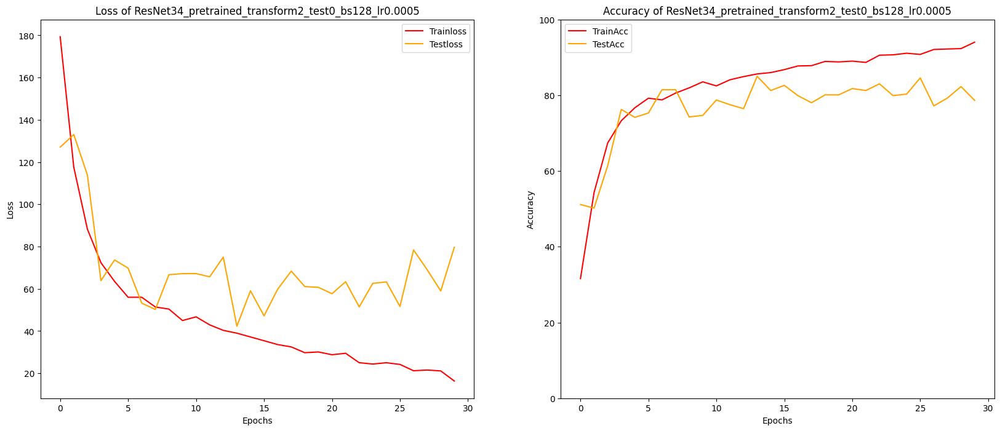

ResNet34_pretrained_transform2_test0_bs128_lr0.00025
	 Train Loss:126.677336, Test Loss:79.339591, Train Acc:54.922%, Test Acc:71.146%
	 Train Loss:66.043498, Test Loss:57.405192, Train Acc:74.974%, Test Acc:78.750%
	 Weight Saved
	 Train Loss:53.249858, Test Loss:52.472099, Train Acc:79.740%, Test Acc:80.938%
	 Weight Saved
	 Train Loss:45.865560, Test Loss:53.411877, Train Acc:83.255%, Test Acc:81.042%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:40.699382, Test Loss:55.475745, Train Acc:84.427%, Test Acc:80.417%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:38.857121, Test Loss:75.929932, Train Acc:85.312%, Test Acc:74.479%
	 NOTICE: Early stopping counter 3 of 20
	 Train Loss:34.746008, Test Loss:83.308171, Train Acc:87.005%, Test Acc:76.146%
	 NOTICE: Early stopping counter 4 of 20
	 Train Loss:35.353613, Test Loss:49.425366, Train Acc:86.849%, Test Acc:81.979%
	 Weight Saved
	 Train Loss:31.140582, Test Loss:56.878402, Train Acc:88.672%, Test Acc:8

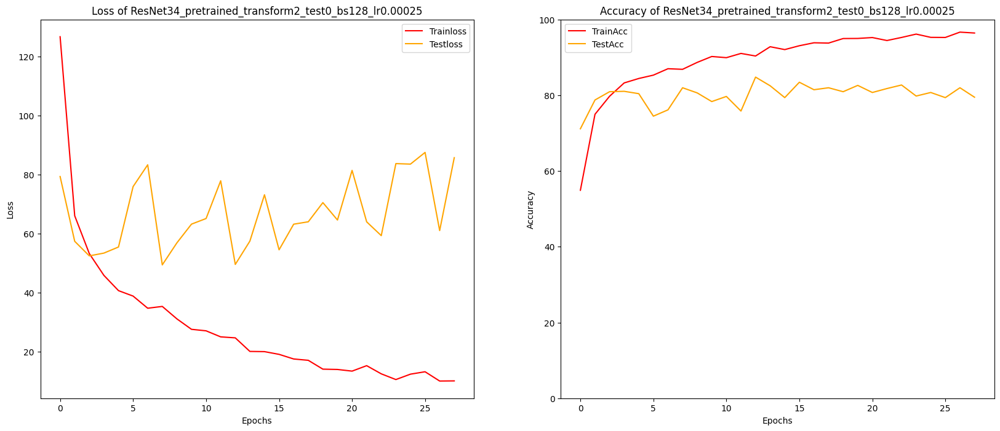

ResNet34_pretrained_transform2_test0_bs128_lr0.0001
	 Train Loss:82.917505, Test Loss:53.193599, Train Acc:69.453%, Test Acc:81.250%
	 Train Loss:46.135624, Test Loss:52.353890, Train Acc:83.385%, Test Acc:80.938%
	 Train Loss:37.518050, Test Loss:41.695097, Train Acc:86.042%, Test Acc:84.479%
	 Weight Saved
	 Train Loss:32.523979, Test Loss:41.440771, Train Acc:88.255%, Test Acc:83.646%
	 Train Loss:27.661505, Test Loss:43.124434, Train Acc:89.974%, Test Acc:84.792%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:25.550336, Test Loss:57.605005, Train Acc:90.755%, Test Acc:80.833%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:22.970099, Test Loss:52.113696, Train Acc:91.406%, Test Acc:83.229%
	 NOTICE: Early stopping counter 3 of 20
	 Train Loss:21.727684, Test Loss:56.489893, Train Acc:91.953%, Test Acc:80.417%
	 NOTICE: Early stopping counter 4 of 20
	 Train Loss:16.879948, Test Loss:56.748055, Train Acc:94.141%, Test Acc:84.479%
	 NOTICE: Early stopping 

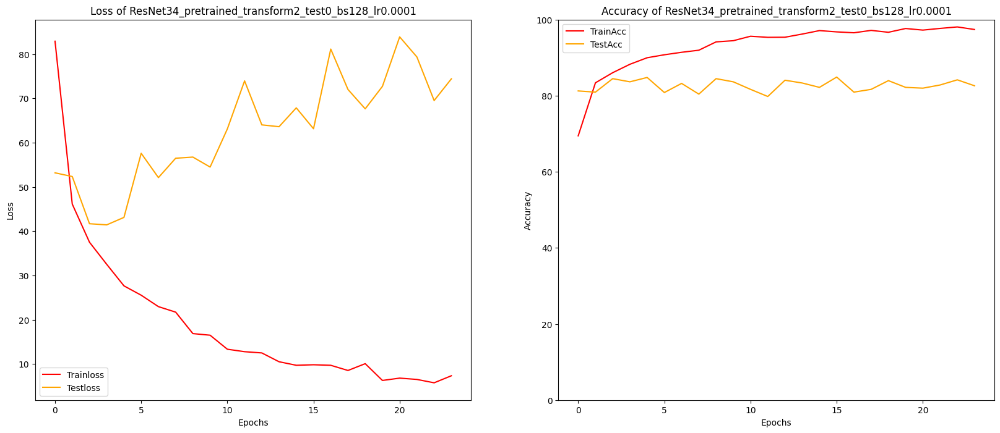

In [42]:
# 使用不同batch_size, 和不同的lr, 訓練30個epochs看看效果
# 預設的lr是0.001, 以這個lr為中點, 提高或降低初始lr來看看效果
for bs in [8, 16, 32, 64, 128]:
    for lr in [0.005, 0.002, 0.0005, 0.00025, 0.0001]:
        trained_epochs = 0
        epochs = 30
        optimizer="RMSprop"
        PATH = r"D:\TGI102_AI_BootCamp\AIA_Interview\weights"
        modelname = "ResNet34_pretrained_transform2_test0_bs{}_lr{}".format(bs, lr)
        firsttitle = "Loss of " + modelname
        secondtitle = "Accuracy of " + modelname

        print(modelname)
        torch.manual_seed(1412)
        net = m.resnet34(pretrained=True)
        net.fc = torch.nn.Linear(512, 6, bias=True)
        net = net.to(device,non_blocking=True)
        start = time()
        trainloss, testloss, trainacc, testacc = full_procedure(net, epochs=epochs, bs=bs
                                                  ,modelname=modelname
                                                  ,PATH=PATH
                                                  ,optimizer=optimizer
                                                  ,lr=lr
                                                  ,patience=20)

        print(modelname)
        print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
        print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
        print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
        print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
        print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
        total_time = time()-start
        print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
        plotgraph(trainloss, testloss, trainacc, testacc, epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle)

**ResNet34_pretrained_transform2_test0_bs64_lr0.00025** <br>
Total trained epochs: 24 <br>
Max trainacc: 94.635% 	Epoch: 20  <br>
Max testacc: 85.521% 	Epoch: 13  <br>
Mean trainacc: 88.125%  <br>
Mean testacc: 80.777%  <br>
Running time: 15.0 minutes, 51 seconds.  <br>
最高testacc: 85.521%，沒有新的突破。 <br>
<br>
下一步： <br>
1. 嘗試Warm up
2. 更換optimizer試試。

------------------------------

### 更換optimizer

ResNet34_pretrained_transform2_Adam_test0_bs8_lr0.001


C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\Users\USER\anaconda3\envs\py38pytorch1121\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch1:[1000/192000(1%)]
Epoch1:[2000/192000(1%)]
Epoch1:[3000/192000(2%)]
	 Train Loss:162.780355, Test Loss:157.516895, Train Acc:34.661%, Test Acc:35.833%
Epoch2:[4840/192000(3%)]
Epoch2:[5840/192000(3%)]
Epoch2:[6840/192000(4%)]
	 Train Loss:125.524544, Test Loss:349.093522, Train Acc:52.266%, Test Acc:64.792%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
Epoch3:[8680/192000(5%)]
Epoch3:[9680/192000(5%)]
Epoch3:[10680/192000(6%)]
	 Train Loss:104.992619, Test Loss:105.947363, Train Acc:59.922%, Test Acc:63.125%
Epoch4:[12520/192000(7%)]
Epoch4:[13520/192000(7%)]
Epoch4:[14520/192000(8%)]
	 Train Loss:93.468351, Test Loss:71.602441, Train Acc:65.339%, Test Acc:74.375%
	 Weight Saved
Epoch5:[16360/192000(9%)]
Epoch5:[17360/192000(9%)]
Epoch5:[18360/192000(10%)]
	 Train Loss:89.675513, Test Loss:126.637419, Train Acc:66.380%, Test Acc:61.250%
	 NOTICE: Early stopping counter 1 of 20
Epoch6:[20200/192000(11%)]
Epoch6:[21200/192000(11%)]
Epoch6:[22200/192000(12%)]
	 Train Loss

Epoch42:[159440/192000(83%)]
Epoch42:[160440/192000(84%)]
	 Train Loss:28.770894, Test Loss:51.282227, Train Acc:89.089%, Test Acc:82.500%
	 NOTICE: Early stopping counter 15 of 20
Epoch43:[162280/192000(85%)]
Epoch43:[163280/192000(85%)]
Epoch43:[164280/192000(86%)]
	 Train Loss:28.251794, Test Loss:54.560897, Train Acc:89.844%, Test Acc:82.812%
	 NOTICE: Early stopping counter 16 of 20
Epoch44:[166120/192000(87%)]
Epoch44:[167120/192000(87%)]
Epoch44:[168120/192000(88%)]
	 Train Loss:28.058824, Test Loss:61.533272, Train Acc:89.531%, Test Acc:81.250%
	 NOTICE: Early stopping counter 17 of 20
Epoch45:[169960/192000(89%)]
Epoch45:[170960/192000(89%)]
Epoch45:[171960/192000(90%)]
	 Train Loss:26.305479, Test Loss:60.788078, Train Acc:90.104%, Test Acc:82.188%
	 NOTICE: Early stopping counter 18 of 20
Epoch46:[173800/192000(91%)]
Epoch46:[174800/192000(91%)]
Epoch46:[175800/192000(92%)]
	 Train Loss:26.884646, Test Loss:53.554781, Train Acc:89.818%, Test Acc:82.917%
	 NOTICE: Early stopp

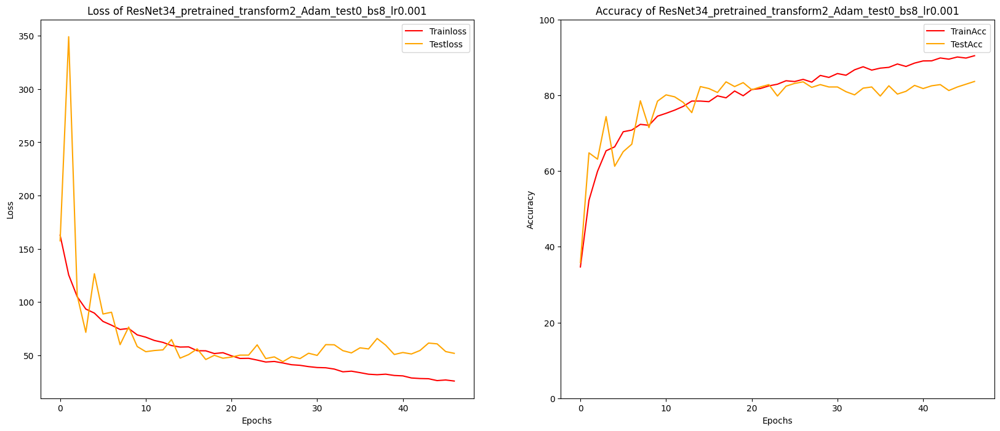

ResNet34_pretrained_transform2_Adam_test0_bs16_lr0.001
Epoch1:[2000/192000(1%)]
	 Train Loss:124.654517, Test Loss:121.776286, Train Acc:52.161%, Test Acc:60.312%
Epoch2:[5840/192000(3%)]
	 Train Loss:89.681494, Test Loss:76.219686, Train Acc:66.719%, Test Acc:70.729%
	 Weight Saved
Epoch3:[9680/192000(5%)]
	 Train Loss:79.592358, Test Loss:63.441671, Train Acc:71.302%, Test Acc:78.750%
	 Weight Saved
Epoch4:[13520/192000(7%)]
	 Train Loss:75.788786, Test Loss:61.593913, Train Acc:71.719%, Test Acc:76.562%
Epoch5:[17360/192000(9%)]
	 Train Loss:70.003963, Test Loss:61.677934, Train Acc:74.349%, Test Acc:79.583%
	 Weight Saved
	 NOTICE: Early stopping counter 1 of 20
Epoch6:[21200/192000(11%)]
	 Train Loss:67.491264, Test Loss:59.442322, Train Acc:75.521%, Test Acc:78.438%
Epoch7:[25040/192000(13%)]
	 Train Loss:62.768579, Test Loss:69.868872, Train Acc:76.927%, Test Acc:74.583%
	 NOTICE: Early stopping counter 1 of 20
Epoch8:[28880/192000(15%)]
	 Train Loss:62.879590, Test Loss:73.6388

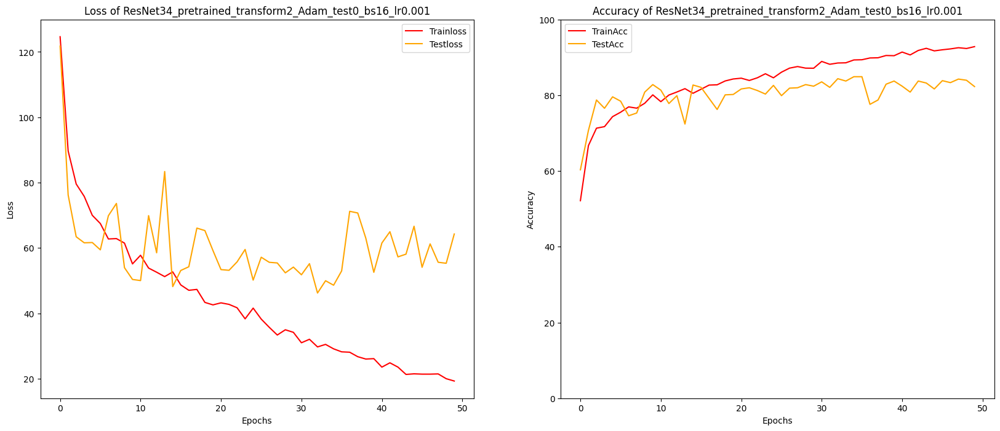

ResNet34_pretrained_transform2_Adam_test0_bs32_lr0.001
	 Train Loss:104.250627, Test Loss:96.505021, Train Acc:61.328%, Test Acc:65.833%
	 Train Loss:80.214950, Test Loss:73.376733, Train Acc:70.469%, Test Acc:76.042%
	 Weight Saved
	 Train Loss:71.088151, Test Loss:61.480509, Train Acc:74.818%, Test Acc:77.292%
	 Weight Saved
	 Train Loss:64.787598, Test Loss:56.877429, Train Acc:76.484%, Test Acc:78.229%
	 Weight Saved
	 Train Loss:62.478951, Test Loss:53.163257, Train Acc:77.448%, Test Acc:81.250%
	 Weight Saved
	 Train Loss:58.821944, Test Loss:71.849528, Train Acc:77.969%, Test Acc:73.750%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:55.779985, Test Loss:53.256087, Train Acc:79.453%, Test Acc:80.104%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:54.384554, Test Loss:68.630786, Train Acc:80.104%, Test Acc:73.333%
	 NOTICE: Early stopping counter 3 of 20
	 Train Loss:49.711210, Test Loss:53.104553, Train Acc:81.484%, Test Acc:80.104%
	 Train Loss:49.438761, Test Los

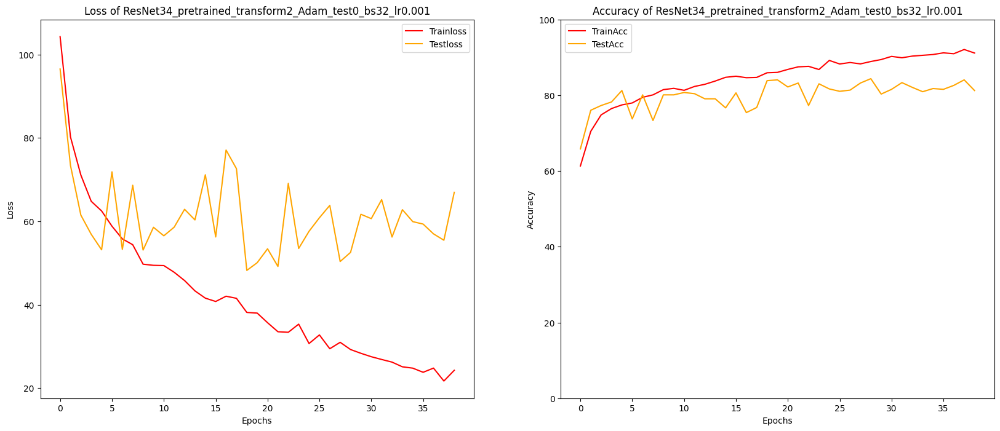

ResNet34_pretrained_transform2_Adam_test0_bs64_lr0.001
	 Train Loss:93.958341, Test Loss:63.526103, Train Acc:65.339%, Test Acc:74.896%
	 Train Loss:66.950647, Test Loss:59.929504, Train Acc:76.146%, Test Acc:78.750%
	 Weight Saved
	 Train Loss:60.322591, Test Loss:59.162415, Train Acc:78.151%, Test Acc:79.271%
	 Weight Saved
	 Train Loss:59.200574, Test Loss:64.709428, Train Acc:78.203%, Test Acc:76.458%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:54.280115, Test Loss:56.269405, Train Acc:80.182%, Test Acc:79.688%
	 Weight Saved
	 Train Loss:50.722319, Test Loss:59.151648, Train Acc:80.625%, Test Acc:79.271%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:47.551628, Test Loss:61.822965, Train Acc:83.021%, Test Acc:77.500%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:46.184163, Test Loss:81.458504, Train Acc:83.073%, Test Acc:73.646%
	 NOTICE: Early stopping counter 3 of 20
	 Train Loss:45.071810, Test Loss:52.252271, Train Acc:83.802%, Test Acc:81.875%
	 Weigh

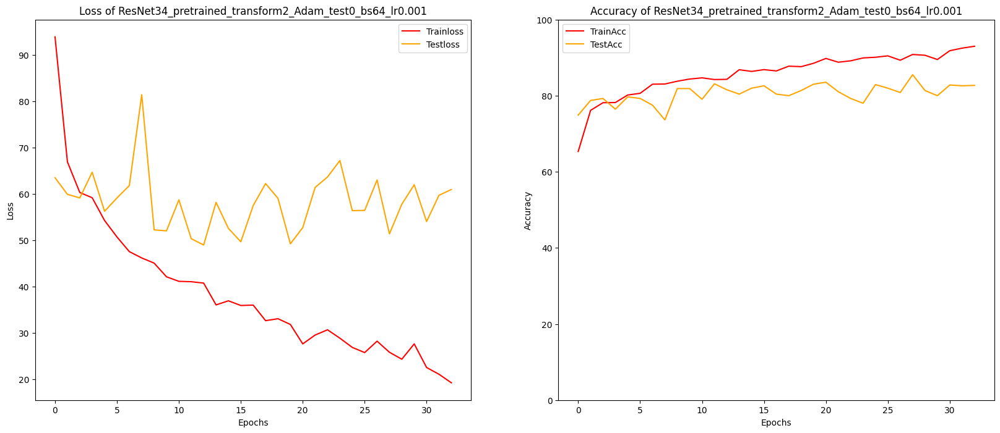

ResNet34_pretrained_transform2_Adam_test0_bs128_lr0.001
	 Train Loss:93.690267, Test Loss:91.460848, Train Acc:65.391%, Test Acc:74.688%
	 Train Loss:60.411080, Test Loss:53.871358, Train Acc:77.917%, Test Acc:81.146%
	 Weight Saved
	 Train Loss:54.454753, Test Loss:82.055583, Train Acc:80.130%, Test Acc:74.375%
	 NOTICE: Early stopping counter 1 of 20
	 Train Loss:48.643282, Test Loss:68.088322, Train Acc:81.406%, Test Acc:75.729%
	 NOTICE: Early stopping counter 2 of 20
	 Train Loss:46.284147, Test Loss:55.666862, Train Acc:83.828%, Test Acc:78.958%
	 NOTICE: Early stopping counter 3 of 20
	 Train Loss:45.716268, Test Loss:53.927604, Train Acc:82.734%, Test Acc:80.729%
	 NOTICE: Early stopping counter 4 of 20
	 Train Loss:42.462830, Test Loss:60.762349, Train Acc:84.740%, Test Acc:78.646%
	 NOTICE: Early stopping counter 5 of 20
	 Train Loss:41.314172, Test Loss:69.813704, Train Acc:84.531%, Test Acc:76.458%
	 NOTICE: Early stopping counter 6 of 20
	 Train Loss:37.207992, Test Loss:6

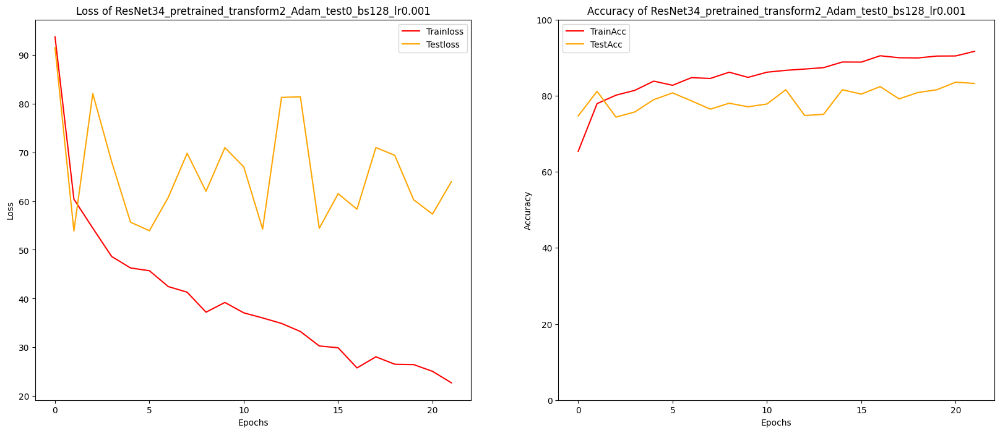

In [22]:
# Adam
# 使用不同batch_size, 和不同的lr, 訓練30個epochs看看效果
# 預設的lr是0.001, 以這個lr為中點, 提高或降低初始lr來看看效果
for bs in [8, 16, 32, 64, 128]:
    trained_epochs = 0
    epochs = 50
    lr = 0.001
    optimizer="Adam"
    PATH = r"D:\TGI102_AI_BootCamp\AIA_Interview\weights"
    modelname = "ResNet34_pretrained_transform2_Adam_test0_bs{}_lr{}".format(bs, lr)
    firsttitle = "Loss of " + modelname
    secondtitle = "Accuracy of " + modelname

    print(modelname)
    torch.manual_seed(1412)
    net = m.resnet34(pretrained=True)
    net.fc = torch.nn.Linear(512, 6, bias=True)
    net = net.to(device,non_blocking=True)
    start = time()
    trainloss, testloss, trainacc, testacc = full_procedure(net, epochs=epochs, bs=bs
                                                  ,modelname=modelname
                                                  ,PATH=PATH
                                                  ,optimizer=optimizer
                                                  ,lr=lr
                                                  ,patience=20)

    print(modelname)
    print("Total trained epochs: {}".format(len(trainacc)+trained_epochs))
    print("Max trainacc: {:.3f}%".format(np.max(trainacc)), "\tEpoch:", trainacc.index(np.max(trainacc))+1)
    print("Max testacc: {:.3f}%".format(np.max(testacc)), "\tEpoch:", testacc.index(np.max(testacc))+1)
    print("Mean trainacc: {:.3f}%".format(np.mean(trainacc)))
    print("Mean testacc: {:.3f}%".format(np.mean(testacc)))
    total_time = time()-start
    print("Running time: {} minutes, {:.0f} seconds.".format(total_time//60, total_time%60))
    plotgraph(trainloss, testloss, trainacc, testacc, epochs=epochs, firsttitle=firsttitle, secondtitle=secondtitle)

**ResNet34_pretrained_transform2_Adam_test0_bs64_lr0.001** <br>
Total trained epochs: 33 <br>
Max trainacc: 92.995% 	Epoch: 33 <br>
Max testacc: 85.521% 	Epoch: 28 <br>
Mean trainacc: 85.833% <br>
Mean testacc: 80.587% <br>
Running time: 20.0 minutes, 48 seconds. <br>
<br>
使用Adam優化器，隨著batchsize加大，比RMSprop收斂速度更快，但並無法改善過擬合問題。

下一步： <br>
試試看把六分類的問題拆成三分類(Bald, Receding_hairline, Normal_hairline)，再從Normal_hairline去區分顏色。

### 對testset進行預測並輸出結果至csv

In [29]:
import os
from PIL import Image
import pandas as pd

In [31]:
def predictOnce(net, x):
    """
    對一組數據進行測試並輸出測試結果的函數
    
    net: 經過訓練後的架構
    x：要測試的數據的所有樣本
    """
    with torch.no_grad(): 
        sigma = net.forward(x)
        yhat = torch.argmax(sigma,1)
    return sigma, yhat

In [28]:
# net
model_path = "D:/TGI102_AI_BootCamp/AIA_Interview/weights/ResNet34"
model_weights_name = "ResNet34_pretrained_transform2_Adam_test0_bs64_lr0.001.pt"

resnet = m.resnet34(weights=None)
resnet.fc = torch.nn.Linear(512, 6, bias=True)
resnet.load_state_dict(torch.load(os.path.join(model_path, model_weights_name)))
resnet = resnet.to(device, non_blocking=True)
resnet.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [29]:
# preprocess test image data
preprocess = transforms.Compose([transforms.Resize((256, 256)),
                                 transforms.CenterCrop(224), 
                                 transforms.ToTensor(),
                                 transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                                        ])

In [32]:
# Prediction
image_names = []
predict_labels = []

testDir = "D:/TGI102_AI_BootCamp/AIA_Interview/datasets/testset/"
testimages = os.listdir(testDir)

for name in testimages:
    image = Image.open(testDir+name).convert("RGB")
    preprocessed_image = preprocess(image) # 3d tensor
    # print(preprocessed_image.shape)
    
    # npimg = torchvision.utils.make_grid(preprocessed_image).numpy()
    # plt.imshow(np.transpose(npimg, (1, 2, 0)))  # visualize preprocessed_image
    
    batch_preprocessed_image_tensor = torch.unsqueeze(preprocessed_image, 0)  # 3d to 4d tensor for model input
    # print(batch_preprocessed_image_tensor.shape)
    batch_preprocessed_image_tensor = batch_preprocessed_image_tensor.to(device,non_blocking=True)  # to.cuda
    
    sigma, yhat = predictOnce(resnet, batch_preprocessed_image_tensor)
    yhat= yhat.to('cpu').item()
    
    image_names.append(name)
    predict_labels.append(yhat)

In [33]:
image_names.__len__()

3000

In [34]:
predict_labels.__len__()

3000

In [35]:
# to dataframe and to_csv
predict_df = pd.DataFrame({"fileName": image_names, "class": predict_labels})

saveDir = "D:/TGI102_AI_BootCamp/AIA_Interview/csv/answer_csv"
filename = "answer4"

predict_df.to_csv(os.path.join(saveDir, filename+".csv"), header=True, index=False, encoding="utf-8")
print("CSV files saved!")

predict_df

CSV files saved!


,fileName,class
0,0004a19b4e3340fe.png,5
1,000afd091ddd4072.png,2
2,000c30901b254aee.png,3
3,000df7a868114cd9.png,3
4,000eb82577584c01.png,5
...,...,...
2995,a84ac249fe5a4321.png,0
2996,a8c72d2e01904f03.png,0
2997,a8cf1a21ccf648e5.png,0
2998,a917be9cff72423b.png,0
